In [690]:
!pip install -r requirements.txt

950283.79s - pydevd: Sending message related to process being replaced timed-out after 5 seconds


In [ ]:
import random
import time
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import ListedColormap
from queue import Queue
import copy
from enum import Enum
import uuid
import heapq
import pandas as pd


"""
    Enum representing simulation 
    termination conditions. 
"""
class Condition(Enum): 
    NO_INFECTED = 0
    NO_NURSES = 1
    NO_PEOPLE = 2
    NO_INFECTED_OR_NURSES = 3

"""
    Enum numerically representing the value 
    of a given element in the simulation. 
"""
class Tile(Enum): 
    EMPTY = 0
    PERSON = 1
    NURSE = 2
    INFECTED = 3
# The Person class acts as the primary Agent for 
# our scenario.
"""
Class representing people in the simulation.
Each person has inherent attributes modelling 
how they interact with the environment. 
"""
class Person: 
    """
    Constructor
    Parameters: 
        float prob_nurse: probability that 
                    a new person is a nurse
    """
    def __init__(self,prob_nurse): 
        self.nurse = False
        # How long until this person (recovering from a disease)
        #   can be reinfected
        self.immunity = 0
        # Chance to resist being infected by a disease
        self.natural_resistance = random.uniform(0.0,0.2)
        # Initial assigned health, retain a copy for metrics
        self.starting_health = random.randint(4,7)
        # Current health, updated throughout simulation
        self.health = self.starting_health
        # List of all diseases individual is currently infected with.
        self.diseases = list()
        if random.random() < prob_nurse: 
            self.nurse = True

    def __str__(self):
        ret = ""
        for k in vars(self): 
            ret += k+"->"+str(vars(self)[k])+" | "
        return ret
    
    def is_nurse(self): 

        return self.nurse
    
    def get_health(self): 
        return self.health
    
    def get_diseases(self):
        # if len(self.diseases) == 0: 
        #     return None
        return self.diseases

    def is_sick(self):
        """
        Checks if a given Person has any diseases.
        Returns Boolean
        """
        return len(self.diseases) > 0
    
    def appears_sick(self): 
        """
        Checks if other people can see this Person as sick.
        Accounts for latent period, where others may not know 
        the current Person is infected. 
        """
        return self.is_sick() and not self.is_latent()
    
    def is_latent(self):
        """
        People will only appear as infected to other people 
        when they reach a certain level of sickness. 
        Returns:
            True    If person is in latent period
            False   Otherwise
        """
        return self.health > 3
    # Adding a disease doesn't trigger its' effects immediately, but 
    #   will trigger at the start of each timestep.
    def add_disease(self,disease): 
        """
        Add a new diseases to the current person when they are infected 
        by another person. Adding a disease doesn't trigger its' effects 
        immediately, but will trigger at the start of each timestep.
        Parameters: 
            Diseases disease: An object of the Disease class that the 
                                person has been infected with 
        """
        if self.has_disease(disease.name): 
            print(self.diseases)
            return
        self.diseases.append(disease)

    
    def clear_diseases(self): 
        """
        Add a new diseases to the current person when they are infected 
        by another person. Adding a disease doesn't trigger its' effects 
        immediately, but will trigger at the start of each timestep.
        Parameters: 
            Diseases disease: An object of the Disease class that the 
                                  person has been infected with.
        """
        # print(self.diseases)
        self.diseases = list()
        # print(self.diseases)

    def has_disease(self,name): 
        """
        Checks if a person already has an instance of a disease. Used 
        to ensure no one can get sick from multiple instances of the same 
        disease simultaneously. 
        Parameters: 
            str name: The name of the disease to check.. 
        Returns: 
            Boolean:    True if person is already infected with the relevant 
                            disease.
                        False otherwise.
        """
        for disease in self.diseases: 
            if name == disease.name: 
                return True 
        return False
    
    def update_health(self):
        """
        Runs before an infected person moves in the simulation. 
        Reduces their health according to the properties of the 
        diseases they are infected with.  
        Returns: 
            int health:     The updated health value for the agent. 
        """ 
        for disease in self.diseases: 
            if self.health == 1: 
                if random.random() + self.natural_resistance < disease.kill_chance: 
                    self.health -= 1
            elif random.random() + self.natural_resistance < disease.mortality: 
                print("Health decreased")
                self.health -= 1 
        return self.health
    
# The Disease class acts as the secondary Agent for our scenario.
"""
The Disease class acts as the secondary Agent for our scenario.
To accurately model real world scenarios, we account for multiple 
types of diseases that vary in virulence and lethality. 
"""
class Disease:
    """
    Constructor for Disease Agents
    """
    def __init__(self): 
        # Chance the diesease will spread to others
        self.infectivity = random.random()
        # Chance for disease to decrease an infected Persons' health
        self.mortality = random.uniform(0.5,1)
        # Chance that a disease will actually kill a Person (reduce 
        #   health below 0)
        self.kill_chance = random.uniform(0.2,0.4)
        # Unique identifier to prevent duplicates
        self.name = uuid.uuid4()
    def infect_random(self,map):
        """
            Runs before an infected person moves in the simulation. 
            Reduces their health according to the properties of the 
            diseases they are infected with.  
            Parameters: 
                Map map:    The map to infect a random Person in.    
            Returns: 
                int[] coords:     The coordinates [x,y] of the chosen 
                                    Person. 
        """ 
        # print(map.get_random_person())
        rand_coords = map.get_random_person()
        map.board[rand_coords[0]][rand_coords[1]].add_disease(copy.deepcopy(self))
        return rand_coords

    def will_spread(self): 
        """
            Determines if a disease will spread to a Person, 
            based on the Diseases' infectivity.
            Returns: 
                Boolean:    True if the disease will spread,
                            False otherwise 
        """ 
        return random.random() < self.infectivity

    def __str__(self):
        ret = ""
        for k in vars(self): 
            ret += k+"->"+str(vars(self)[k])+" | "
        return ret


"""
The Map class acts as the environment for our simulation, 
providing the board and other required features. 
"""
class Map:
    """
    Constructor for the Map class.
    Parameters: 
        int size:           The size of the board.
        int k:              The number of clusters to  
                                start with on the board.
        float prob_nurse:   Probability that a new
                                person is a nurse.
        float prob_person:  Probability that an empty 
                                square on the first map
                                is a person.
    """
    def __init__(self,size,k,prob_nurse,prob_person): 
        self.size = size
        self.prob_nurse = prob_nurse
        self.prob_person = prob_person
        self.num_clusters = k
        # The 2d array that will hold the board state. 
        self.board = self.generate_array()
        # Cluster initalisation 
        self.cluster_props = self.assign_cluster_probabilities()
        self.place_clusters()

    def dijkstra(self, start_i, start_j):
        """Use Dijkstra's algorithm to find the shortest path from (start_i, start_j) to all nurses."""
        # Priority queue to hold the cells to be processed
        pq = []
        # Distance dictionary to hold the shortest distance to each cell
        distances = { (i, j): float('inf') for i in range(self.size) for j in range(self.size) }
        # Dictionary to store only the distances to nurses
        nurse_distances = {}
        
        # Initialize the start point's distance
        distances[(start_i, start_j)] = 0
        heapq.heappush(pq, (0, (start_i, start_j)))  # (distance, (i, j))

        while pq:
            current_distance, (current_i, current_j) = heapq.heappop(pq)

            # If this distance is greater than the recorded distance, skip it
            if current_distance > distances[(current_i, current_j)]:
                continue

            # Explore neighbors
            for neighbour, ni, nj in self.get_neighbours(current_i, current_j):
                if self.get_element_at(ni, nj) == Tile.EMPTY:
                    distance = current_distance + 1  # All moves have a cost of 1                    
                    if distance < distances[(ni, nj)]:
                        distances[(ni, nj)] = distance
                        heapq.heappush(pq, (distance, (ni, nj)))
                        
                        # If the neighbor is a nurse, add it to the nurse_distances dictionary
                        if self.get_element_at(ni, nj) == Tile.NURSE:
                            nurse_distances[(ni, nj)] = distance
                if self.get_element_at(ni, nj) == Tile.NURSE:
                    distance = current_distance
                    if distance < distances[(ni, nj)]:
                        distances[(ni, nj)] = distance
                        heapq.heappush(pq, (distance, (ni, nj)))  
                        # If the neighbor is a nurse, add it to the nurse_distances dictionary
                        if self.get_element_at(ni, nj) == Tile.NURSE:
                            nurse_distances[(ni, nj)] = distance
            
        print(nurse_distances)
        return nurse_distances



    def generate_array(self): 
        """
            Initialise an empty 2D array of the correct size. 
            Returns: 
                arr[][]:    2D array initialised to empty squares. 
        """ 
        return [[None for _ in range(self.size)] for _ in range(self.size)]

    def assign_cluster_probabilities(self):
        # Assign different probabilities to different clusters
        return [random.uniform(0.1, 0.5) for _ in range(self.num_clusters)]

    def is_nurse_adjacent(self,i,j): 
        """
            Checks if a given square is adjacent to a nurse,
            and thus within healing range. 
            Parameters:
                int i:      The x coordinate of the square. 
                int j:      The y coordinate of the square. 
            Returns: 
                Boolean:    True if the square is nurse adjacent,
                            False otherwise. 
        """ 
        neighbours = self.get_neighbours(i,j)
        for neighbour,_,_ in neighbours:
            if neighbour is not None and neighbour.is_nurse(): 
                return True 
        return False
    
    def place_clusters(self):
        # Randomly place clusters on the grid while ensuring they don't overlap and are separated by at least 1 space
        cluster_areas = []
        max_attempts = 1000  # Maximum number of attempts to place clusters without overlap
        
        for cluster_index in range(self.num_clusters):
            placed = False
            attempts = 0
            region_size = random.randint(10, 20)  # Random size for each cluster
            
            while not placed and attempts < max_attempts:
                attempts += 1
                # Random top-left corner for the cluster
                x_start = random.randint(0, self.size - region_size - 1)
                y_start = random.randint(0, self.size - region_size - 1)

                # Check if the cluster can fit without touching others (minimum 1 space around it)
                if self.is_region_free(x_start, y_start, region_size):
                    cluster_areas.append((x_start, y_start, region_size))
                    self.populate_cluster(x_start, y_start, region_size)
                    placed = True
        
        if len(cluster_areas) < self.num_clusters:
            print("Warning: Could not place all clusters due to space constraints.")

    def is_region_free(self, x_start, y_start, region_size):
        """Check if a region is free and has at least one space buffer around."""
        # Check if the region is free and has at least one space around
        for i in range(x_start - 1, x_start + region_size + 1):
            for j in range(y_start - 1, y_start + region_size + 1):
                if i < 0 or i >= self.size or j < 0 or j >= self.size:
                    continue  # Ignore out-of-bounds checks
                if self.board[i][j] is not None:  # If there is a person or nurse already
                    return False
        return True

    def populate_cluster(self, x_start, y_start, region_size):
        """Populate a region with people, ensuring separation from other clusters."""
        for i in range(x_start, x_start + region_size):
            for j in range(y_start, y_start + region_size):
                if random.random() < self.prob_person:
                    self.add_person(i, j)

    def add_person(self, i, j):
        """
            Add a new Person to the map, if the specified 
            coordinates are valid.
            Parameters:
                int i:      The x coordinate to add the Person at. 
                int j:      The y coordinate to add the Person at. 
        """ 
        if self.board[i][j] is None:
            self.board[i][j] = Person(prob_nurse=self.prob_nurse)

    def get_random_person(self): 
        """
            Get a random person from the current choices in the map. 
            Returns:
                int[]:      The coordinates of the randomly chosen 
                            person in form [i,j]
        """ 
        return random.choice([[i,j] for i,row in enumerate(self.board) for j,col in enumerate(row) if self.get_element_at(i,j) == Tile.PERSON])
    
    def check_in_bounds(self,i,j): 
        """
            Error checking to ensure that given coordinates are 
            a valid entry into the board. 
            Parameters:
                int i:      The x coordinate to add the Person at. 
                int j:      The y coordinate to add the Person at. 
            Returns: 
                Boolean:    True if the parameters are a valid coordinate
                                on the map. 
                            False otherwise. 
        """ 
        return i >= 0 and i < self.size and j >= 0 and j < self.size 

    def get_element_at(self,i,j): 
        """
            Returns a numerical value corresponding to the type of 
            Agent present at the given location in the map. 
            Parameters:
                int i:      The x coordinate to add the Person to. 
                int j:      The y coordinate to add the Person to. 
            Returns: 
                Condition:  The enum corresponding to the desired 
                                square. 
        """ 
        if self.board[i][j] is None: 
            return Tile.EMPTY
        elif self.board[i][j].is_nurse():
            return Tile.NURSE
        elif self.board[i][j].is_sick(): 
            return Tile.INFECTED
        else: 
            return Tile.PERSON
    
    def infect_surrounding(self,i,j): 
        """
            Tries to infect all People surrounding an infected individual 
            at the given coordinates. 
            Parameters:
                int i:      The x coordinate of the infected indiividual. 
                int j:      The y coordinate of the infected indiividual. 
        """ 
        if not self.board[i][j].is_sick(): 
            return 
        cur_diseases = self.board[i][j].get_diseases()
        for neighbour, ni, nj in self.get_neighbours(i,j):
            if neighbour is not None: 
                print("Adding from",cur_diseases,self.board[i][j].get_diseases())
                for disease in cur_diseases: 
                    # Calculate if the Person will be infected,
                    #   according to their resistances and the 
                    #   diseases infectivity.
                    if disease.will_spread():
                        self.board[ni][nj].add_disease(disease)
                        print(disease, "added to", ni,nj)
        
    def get_neighbours(self,srci,srcj):
        """
            Returns all elements adjacent to the neighbour 
            at the given coordinates.
            Parameters:
                int srci:           The x coordinate of the source square. 
                int srcj:           The y coordinate of the source square. 
            Returns: 
                [[el,i,j]...]:   A 2D array containing [element,x_coord,y_coord]
                                        for all neighbours of the source square.
        """ 
        neighbours = list()
        for i in range(srci-1,srci+2):
            for j in range(srcj-1,srcj+2): 
                if i == srci and j == srcj:
                    continue
                if self.check_in_bounds(i,j):
                    neighbours.append([self.board[i][j],i,j])
        return neighbours

    def make_random_move(self,i,j):
        """
            Moves an element to a randomly selected 
            valid (empty) adjacent square.
            Parameters:
                int i:           The x coordinate of the element to move. 
                int j:           The y coordinate of the element to move. 
            Returns: 
                None:            If no valid square is adjacent. 
                int[2]:          Coordinates of square that was chosen 
                                    to move to.
        """ 
        options = [x for x in self.get_neighbours(i,j) if x[0] is None]
        # print("Choosing from",options)
        if len(options) == 0:
            return None
        choice = random.choice(options)
        # print("Chose",choice)
        self.move_to(i,j,choice[1],choice[2])
        return [choice[1],choice[2]]

    def get_infected_surrounding(self,i,j):
        """
            Determine how many infected neighbours a Person can see 
            adjacent to a chosen square. 
            Parameters:
                int i:           The x coordinate of the input square. 
                int j:           The y coordinate of the input square. 
            Returns: 
                int count:       The number of infected neighbours seen. 
        """ 
        count = 0
        for neighbour, _, _ in self.get_neighbours(i,j): 
            if neighbour is not None and neighbour.appears_sick():
                count += 1
        return count

    def get_safest_surrounding(self,start_i,start_j):
        """
            Determine which adjacent square is the safest (has the least adjacent 
            infected neighbours) for an uninfected Person to move to. 
            Parameters:
                int start_i:           The x coordinate of the input square. 
                int start_j:           The y coordinate of the input square. 
            Returns: 
                int[2]:                The [i,j] coordinates of the safest square. 
        """ 
        # Can only have a maximum of 9 neighbours.
        lowest = 10
        lowest_vals = None
        for _, ni, nj in self.get_neighbours(start_i,start_j):
            # Only consider empty neighbours
            if self.get_element_at(ni,nj) == Tile.EMPTY:
                unsafe_count = self.get_infected_surrounding(ni,nj) 
                if unsafe_count < lowest: 
                    lowest = unsafe_count
                    lowest_vals = [ni,nj]
        # print("Safest square is", lowest_vals, "with ",lowest,"infected surrounding")
        return lowest_vals

    def get_map(self):
        """
            Returns a copy of the current instance of the board. 
            Returns: 
                int[size][size]:    The current board. 
        """ 
        return self.board
    
    def move_to(self,old_i,old_j,new_i,new_j): 
        """
            Moves an element to a new location. Integrity of new position should
            be verified before call - board[new_i][new_j] should be empty. 
            Parameters:
                int old_i:           The x coordinate of the elements original position. 
                int old_j:           The y coordinate of the elements original position. 
                int new_i:           The x coordinate of the elements new position. 
                int new_j:           The y coordinate of the elements new position. 
        """ 
        element = self.board[old_i][old_j]
        self.clear_square(old_i,old_j)
        self.board[new_i][new_j] = element

    def get_most_infected_neighbour(self,i,j): 
        """
            Determine which square adjacent to the input square is the 
            most at risk, and thus most important for the nurses to heal.
            Parameters:
                int i:                  The x coordinate of the desired square. 
                int j:                  The y coordinate of the desired square. 
            Returns: 
                [neighbour,ni,nj]:      The details of the most at risk square -
                                            the object and its' x, y coordinates.
        """ 
        lowest_health = 10
        lowest_diseases = 0
        highest_priority = [None,None,None]
        for neighbour, ni, nj in self.get_neighbours(i,j): 
            if neighbour is None: 
                continue
            health = neighbour.get_health()
            diseases = neighbour.get_diseases()
            if diseases is None:
                continue
            diseases = len(diseases)
            # print("Infected",neighbour)
            if health <= lowest_health and diseases > lowest_diseases: 
                lowest_health = health
                lowest_diseases = diseases
                highest_priority = [neighbour, ni, nj]
        return highest_priority

    def clear_square(self,i,j):
        """
            Removes an element from the board.
            Parameters:
                int i:                  The x coordinate of the square to clear. 
                int j:                  The y coordinate of the square to clear. 
        """ 
        self.board[i][j] = None

    def map_to_ints(self): 
        """
            Returns a new board, with all elements converted to their 
            respective numerical values. 
            Returns:
                int[size][size]:    The array containing numerically 
                                        mapped values.
        """ 
        grid = np.zeros((self.size, self.size))
        for i in range(self.size): 
            for j in range(self.size): 
                if not self.check_in_bounds(i,j):
                    continue
                grid[i][j] = self.get_element_at(i,j).value
        return grid
    
    def get_closest_nurse(self,i,j): 
        """
            Calculates the coordinates of the closest nurse to the input square.
            Parameters:
                int i:                  The x coordinate of the square to evaluate. 
                int j:                  The y coordinate of the square to evaluate. 
            Returns:
                int[2]:                 The [x,y] coordinates of the closest nurse.
        """ 
        arr = np.array(self.map_to_ints())
        nurses = np.argwhere(arr == 2)
        # print(nurses)
        min_distance = np.inf
        ret = None
        for coords in nurses: 
            x = coords[0]
            y = coords[1]
            dist = self.get_distance_bewteen(i,j,x,y) 
            if dist < min_distance: 
                min_distance = dist
                ret = [x,y]
            # print("distances",i,j,x,y,dist)
        return ret
    
    def get_num_neighbours(self,i,j): 
        """
            Calculates how many people are adjacent to a given square.
            Parameters:
                int i:                  The x coordinate of the square to evaluate. 
                int j:                  The y coordinate of the square to evaluate. 
            Returns:
                int count:              The number of people adjacent to the square. 
        """ 
        count = 0
        for _, ni, nj in self.get_neighbours(i,j):
            if self.get_element_at(ni,nj) != Tile.EMPTY: 
                count += 1
        return count

    def get_distance_bewteen(self,i,j,i2,j2): 
        """
            Calculates how many people are adjacent to a given square.
            Parameters:
                int i:                  The x coordinate of the source square. 
                int j:                  The y coordinate of the source square. 
                int i2:                 The x coordinate of the destination square. 
                int j2:                 The y coordinate of the destination square. 
            Returns:
                float distance:         The distance between the two squares. 
        """ 
        return np.sqrt((i - i2)**2 + (j - j2)**2)

    def get_best_move_from_to(self,srci,srcj,desti,destj): 
        """
            Greedily calculates the best move to make to get to a desired square
            given the current map state.
            Parameters:
                int srci:                  The x coordinate of the source square. 
                int srcj:                  The y coordinate of the source square. 
                int desti:                 The x coordinate of the destination square. 
                int destj:                 The y coordinate of the destination square. 
            Returns:
                int[2]:                    The coordinates of the best move to the detination.  
        """ 
        min_dist = np.inf
        best_move = None
        for i in range(srci-1,srci+2):
            for j in range(srcj-1,srcj+2): 
                if not self.check_in_bounds(i,j):
                    continue
                # Can only move to empty square
                if self.get_element_at(i,j) == Tile.EMPTY: 
                    print(i,j,desti,destj,"distance ",self.get_distance_bewteen(i,j,desti,destj))
                    dist = self.get_distance_bewteen(i,j,desti,destj)
                    if dist < min_dist: 
                        best_move = [i,j]
                        min_dist = dist
        # print("Best move is",best_move, "with distance", )
        return best_move

    def copy(self): 
        """
        Returns a deep copy of the current map to facilitate 
        storing past state instances.
        Returns:
            Map map:    A deep copy of the current map.
        """
        return copy.deepcopy(self)

    def get_total_people(self):
        """
        Gets the total number of people in current board. 
        Returns:
            int count:   The number of people in the board. 
        """
        count = 0
        for i in range(self.size): 
            for j in range(self.size): 
                if not self.check_in_bounds(i,j):
                    continue
                if self.get_element_at(i,j) != Tile.EMPTY:
                    count += 1
        return count   
    
    def check_end(self):
        """
        Determines if the current state of the map meets 
        any of the simulation termination criteria.
        Returns:
            Condition termination:      The Condition causing the termination. 
            Boolean False:              If no Condition is matched. 
        """
        any_infected = False
        any_nurses = False
        any_people = False
        grid = np.zeros((self.size, self.size))
        for i in range(self.size): 
            for j in range(self.size): 
                if not self.check_in_bounds(i,j):
                    continue
                if self.get_element_at(i,j) == Tile.PERSON:
                    any_people = True
                if self.get_element_at(i,j) == Tile.INFECTED: 
                    any_infected = True
                if self.get_element_at(i,j) == Tile.NURSE:
                    any_nurses = True
        if not any_people: 
            return Condition.NO_PEOPLE
        if not any_infected: 
            return Condition.NO_INFECTED
        # if not any_nurses: 
        #     return Condition.NO_NURSES
        return False
                
    def get_average_alive_stats(self): 
        healths = []
        res = []
        for i in range(self.size): 
            for j in range(self.size): 
                if not self.check_in_bounds(i,j):
                    continue
                elif self.get_element_at(i,j) != Tile.EMPTY: 
                    cur_person : Person = self.board[i][j]
                    healths.append(cur_person.starting_health)
                    res.append(cur_person.natural_resistance)
        return np.mean(healths), np.mean(res)
"""
The class responsible for incorporating the previous elements 
and running a simulation instance.
"""
class Simulation: 
    """
    Constructor for the Simulation class.
    Parameters: 
        int board_size:           The size of the board. 
                                  Default 100. 
        int num_clusters:         The number of clusters to start with
                                    on the board.
                                  Default 4
        float prob_nurse:         Probability that a new
                                    person is a nurse.
                                  Default 0.2 
        float prob_person:        Probability that an empty square on 
                                    the first map is a person.
                                  Default 0.4
    """
    def __init__(self,board_size=100,num_clusters=4,prob_nurse=0.2,prob_person=0.4): 
        self.board_size = board_size
        self.num_clusters = num_clusters
        self.prob_nurse = prob_nurse
        self.prob_person = prob_person
        # Hold simulation-wide metrics
        self.metrics = SimMetrics()
        # Copy of the first map 
        self.starting_map = None
        # The current map 
        self.map = Map(board_size,num_clusters,prob_nurse=prob_nurse,prob_person=prob_person)
        # The list of possible diseases for the current simulation
        self.disease_choices = list()
        # Whether or not the simulation has terminated
        self.running = False
        # Holds step-specific metrics for all steps. 
        self.all_metrics = list()
        self.stats = [["infected","not infected", "time step"]]
        self.new_list = list()
        self.old_list = list()
        # self.infected_count = 0

    def get_sim_params(self):
        """ 
            Retrieves the initial parameters used to run the simulation. 
            Returns: 
                arr[4]:     Initial parameters
        """
        return [self.board_size,self.num_clusters,self.prob_nurse,self.prob_person]

    def get_diseases(self): 
        """ 
            Retrieves the list of diseases available to the current simulation. 
            Returns: 
                Disease[]:   List of available diseases
        """
        return self.disease_choices
            
    def add_disease_option(self): 
        """ 
            Creates a new disease, and makes it available 
            to the simulation.
        """
        self.disease_choices.append(Disease())

    def start(self): 
        """ 
            Starts a simulation instance. 
        """
        self.metrics.set_start_count(self.map.get_total_people())
        self.add_disease_option()
        # self.add_disease_option()
        for disease in self.disease_choices: 
            num_to_infect = random.randint(1,4)
            print("Infecting",num_to_infect)
            for i in range(0,num_to_infect): 
                self.metrics.add_hotspot(disease.infect_random(self.map))
        # self.starting_map = self.map.copy()
        self.metrics.set_first_map(self.map.copy())

    def step(self): 
        """ 
            Steps through an iteration of the simulation. 
            Squares are processed in a random order.
            Processing involves different actions depending 
            on which element is in the square. 
            If conditions for termination are met, displays 
            the final simulation statistics.  
        """
        if self.map.check_end() is not False:
            print("Simulation Ended",self.map.check_end()) 
            return

        # self.iterations += 1 
        self.metrics.increment_iterations()
        # self.previous = self.map.copy()
        new_map = self.map.copy()
        indices = [[x,y] for x in range(self.board_size) for y in range(self.board_size)]
        random.shuffle(indices)
        for i,j in indices: 
            if not self.map.check_in_bounds(i,j): 
                continue
            match self.map.get_element_at(i,j): 
                case Tile.EMPTY: 
                    # Empty
                    continue
                case Tile.PERSON:  
                    # Just Person
                    num_infected = new_map.get_infected_surrounding(i,j) 
                    if num_infected == 0: 
                        new_map.make_random_move(i,j)
                        continue
                    ## Move to the safest empty square 
                    safest_square = new_map.get_safest_surrounding(i,j)
                    if safest_square is not None: 
                        # print("Moving to",safest_square[0],safest_square[1])
                        new_map.move_to(i,j,safest_square[0],safest_square[1])
                    continue
                case Tile.NURSE: 
                    # Nurse
                    endangered_node,ni,nj = new_map.get_most_infected_neighbour(i,j)
                    print("Neighbour",i,j,endangered_node)
                    if endangered_node is not None: 
                        self.metrics.increment_healed()
                        new_map.board[ni][nj].clear_diseases()
                    continue
                case Tile.INFECTED: 
                    cur_health = new_map.board[i][j].update_health()
                    print("Node health is", cur_health)
                    if cur_health <= 0: 
                        print("Node died")
                        self.metrics.add_dead(new_map.board[i][j])
                        new_map.board[i][j] = None
                        continue
                    # Person with diseases
                    new_map.infect_surrounding(i,j)
                    # print("Moving infected at",i,j)

                    if self.map.is_nurse_adjacent(i,j):
                        # print("Nurse adjacent to",i,j)
                        continue
                    
                    distances = new_map.dijkstra(i, j)
                    # Find the closest nurse position
                    closest_nurse_coords = None
                    min_distance = float('inf')
                    for coords, distance in distances.items():
                        if new_map.get_element_at(coords[0], coords[1]) == Tile.NURSE and distance < min_distance:
                            min_distance = distance
                            closest_nurse_coords = coords
                    nurse_coords = new_map.get_closest_nurse(i,j)

                    if closest_nurse_coords is not None:
                        # Move towards the closest nurse
                        best_move = new_map.get_best_move_from_to(i, j, closest_nurse_coords[0], closest_nurse_coords[1])
                        new_map.move_to(i, j, best_move[0], best_move[1])
                        new_map.infect_surrounding(best_move[0],best_move[1])
                        continue
                    if nurse_coords is None: 
                        # Could just do random move 
                        new_map.make_random_move(i,j)
                        continue
                    best_move = new_map.get_best_move_from_to(i,j,nurse_coords[0],nurse_coords[1])
                    # print("Infected at",i,j,"optimal move is",best_move,"to nurse at",nurse_coords)
                    try:
                        new_map.move_to(i,j,best_move[0],best_move[1])
                    except TypeError:
                        print("Infected patient could not move since hospital/nurse met patient capacity.")
                        continue
                    continue
        self.map = new_map
        self.all_metrics.append(StepMetrics(self.metrics.copy(), new_map.copy()))

    def view(self,chosen_map=None):
        """Visualize the grid using matplotlib."""
        grid = np.zeros((self.board_size, self.board_size))
        
        for i in range(self.board_size):
            for j in range(self.board_size):
                if chosen_map is None:
                    grid[i][j] = self.map.get_element_at(i,j).value
                else: 
                    grid[i][j] = chosen_map.get_element_at(i,j).value
        
        bounds = [0, 1, 2, 3]
        cmap = 'viridis'
        norm = plt.Normalize(vmin=bounds[0], vmax=bounds[-1])

        plt.imshow(grid, cmap=cmap, norm=norm, interpolation='nearest')
        plt.colorbar(label='0 = Empty, 1 = Person, 2 = Nurse, 3 = Infected',cmap=cmap,norm=norm)
        plt.title("Randomly Placed Clusters with People and Nurses")
        plt.show()

    def show_map(self): 
        """
            Gets the board of the current map in the simulation. 
            Returns:
                Map map:    The current map
        """
        return self.map.get_map()        

    def run_to_end(self, max_steps=100): 
        """
            Automatically runs the simulation either until it ends, 
            or an assigned number of steps is reached, whichever is 
            first.
            Parameters:
                int max_steps:              The maximum number of steps to execute
            Returns: 
                DataFrame infected_df:      Statistics on infected individuals. 
                DataFrame overall_df:       Statistics on the whole simulation. 
        """
        infected_statistics = []
        infected_stats = self.track_infected_statistics()
        overall_stats = self.track_overall_statistics()
        n = self.get_infected_count()
        if n > 1:
            for row in range(self.get_infected_count()):
                infected_statistics.append(infected_stats[row])
        else:
            infected_statistics.append(infected_stats)
        overall_statistics = [self.track_overall_statistics()]
        current_step = 0

        while self.map.check_end() is False and current_step < max_steps:
            self.step()
            self.view()

            # Track stats for each time step
            infected_stats = self.track_infected_statistics()
            overall_stats = self.track_overall_statistics()

            # Append stats to the list to store them
            n = self.get_infected_count()
            if n > 1:
                for row in range(self.get_infected_count()):
                    infected_statistics.append(infected_stats[row])
            else:
                infected_statistics.append(infected_stats)
            overall_statistics.append(overall_stats)

            current_step += 1  # Increment the step count

        # Once the simulation is done or max steps reached, return the collected statistics
        infected_df = pd.DataFrame(infected_statistics, columns=["Infected X", "Infected Y","Uninfected Count Near", "Total Squares Visited", "Time Step", ])

        overall_df = pd.DataFrame(overall_statistics, columns=["Time Step","Current Infected", "Total Deaths", "Total Healed","Average Alive Health",
                                                                "Average Alive Resistance", "Average Dead Health","Average Dead Resistance"])

        return infected_df, overall_df

    def end(self): 
        """
            Display final statistics upon simulation termination. 
        """       
        description,total_matched, total_possible = self.metrics.get_hotspot_density()
        print(description,total_matched,"starting neighbours out of",total_possible,"possible")
        print("Started with",self.metrics.get_start_count(),"people. Ended with "+str(self.map.get_total_people()) 
              + ". " + str(self.metrics.get_start_count() - self.map.get_total_people()),"people died in",self.metrics.iterations,"iterations.")
        print("The following died:",self.metrics.get_dead())
        print(f"{self.metrics.get_healed()} healed.")
        print(f"Ended because of: {self.map.check_end()}")
        for i in self.all_metrics: 
            print("")
        print("Started at:")
        self.view(chosen_map=self.metrics.get_first_map())
        print("Finished at:")
        self.view()

    def get_infected_count(self):
        """
            Determine how many people in total are 
            infected in the current map. 
            Returns:
                int infected_count:     Number of infected individuals 
                                            in the current map. 
        """  
        infected_count = 0
        for i in range(self.board_size):
            for j in range(self.board_size):
                if self.map.get_element_at(i, j) == Tile.INFECTED:
                        infected_count +=1
        return infected_count

    def track_infected_statistics(self):
        """
            Evaluates current metrics for infected individuals. Gets 
            infected statistics from the relevant step. 
            Returns:
                float[] infected_stats:     Current infected metrics
        """  
        infected_stats = []
        for i in range(self.board_size):
            for j in range(self.board_size):
                if self.map.get_element_at(i, j) == Tile.INFECTED:
                    # Count uninfected persons within two spaces
                    uninfected_within_two_spaces = 0
                    squares_to_visit = 0

                    #self.new_list = []

                    for x in range(i-2, i+3):
                        for y in range(j-2, j+3):
                            if x==i and y==j:
                                continue
                            elif self.map.check_in_bounds(x, y):
                                # If the tile is a person and not infected, increase uninfected count
                                if self.map.get_element_at(x, y) == Tile.PERSON:
                                    uninfected_within_two_spaces += 1
                                # Count the number of empty squares the infected person can visit
                                if self.map.get_element_at(x, y) == Tile.EMPTY or self.map.get_element_at(x, y) == Tile.PERSON:
                                    squares_to_visit += 1

                    # Store the statistics for the infected person at (i, j)
                    infected_stats.append(
                        [i,
                        j,
                        uninfected_within_two_spaces,
                        squares_to_visit,
                        self.metrics.iterations
                    ])
                    continue
                continue

        return infected_stats

    def track_overall_statistics(self):
        """
            Evaluates current metrics for the overall simulation. Gets simulation 
            statistics from the relevant step. 
            Returns:
                float[] overall_stats:     Current simulation metrics
        """  
        total_infected = 0
        total_deaths = len(self.metrics.get_dead())
        total_healed = self.metrics.get_healed()

        # Count current number of infected people
        for i in range(self.board_size):
            for j in range(self.board_size):
                if self.map.get_element_at(i, j) == Tile.INFECTED:
                    total_infected += 1
        alive_stats = self.metrics.get_avg_alive_stats()
        alive_health = alive_stats[0]
        alive_res = alive_stats[1]
        dead_stats = self.metrics.get_avg_dead_stats()
        dead_health = dead_stats[0]
        dead_res = dead_stats[1]
        # Store the overall statistics at the current time step
        overall_stats = [
            self.metrics.iterations,
            total_infected,
            total_deaths,
            total_healed,
            alive_health,
            alive_res,
            dead_health,
            dead_res
        ]

        return overall_stats

class StepMetrics(): 
    "Class holding metrics for a single step in the simulation."
    def __init__(self,sim_metrics,map):
        self.metrics : SimMetrics = sim_metrics
        self.metrics.set_first_map(map)

class SimMetrics:
    "Class holding overall metrics for the simulation."
    def __init__(self): 
        self.dead = list()
        self.num_healed = 0
        self.iterations = 0
        self.start_count = 0
        self.initial_hotspots = list()
        self.starting_map : Map = None

    def add_dead(self,person): 
        """
            Adds a new person to the dead array. 
            Parameters: 
                Person person:      The person who died. 
        """
        self.dead.append(person)

    def increment_healed(self):
        """
            Maintains the counter of the number of people healed. 
        """
        self.num_healed += 1

    def increment_iterations(self): 
        """
            Maintains the counter of the number of steps in the simulation. 
        """
        self.iterations += 1 

    def add_hotspot(self,hotspot): 
        """
            Maintains the list of starting locations for infected
            individuals 
        """
        self.initial_hotspots.append(hotspot)
    
    def get_hotspot_density(self):
        """
            Determines how many infected individuals are clustered
            around each outbreak hotspot. 
        """
        total_possible = 0
        total_matched = 0
        for hotspot in self.initial_hotspots: 
            print(hotspot)
            i = hotspot[0]
            j = hotspot[1]
            total_possible += len(self.starting_map.get_neighbours(i,j))
            total_matched += self.starting_map.get_num_neighbours(i,j)
        return ["hotspots",total_matched, total_possible]

    def set_first_map(self,map): 
        """
            Saves the first map for comparison against
            the terminal state.    
            Parameters:
                Map map:        The initial state of the map.
        """
        self.starting_map = map

    def get_first_map(self):
        """
            Gets the state of the initial map. 
            Return:
                Map map:        The initial state of the map.
        """
        return self.starting_map
    
    def get_dead(self):
        """
            Gets the state of the decased individuals. 
            Return:
                Dead[] dead:        Array of dead people.
        """
        return self.dead.copy()
    
    def get_healed(self): 
        """
            Gets the number of people healed throughout the simulation.
            Return:
                int num_healed:         The number of people healed. 
        """
        return self.num_healed
    
    def set_start_count(self,num): 
        """
            Sets the number of people at the start of the simulation.
        """
        self.start_count = num

    def get_iterations(self): 
        """
            Gets the number of steps in the simulation.
            Return:
                int iterations:         The number of steps. 
        """
        return self.iterations
    
    def get_start_count(self): 
        """
            Gets the number of people at the start of the simulation.
            Return:
                int start_count:         The number of initial people. 
        """
        return self.start_count
    
    def copy(self): 
        """
            Returns a copy of the simulation metrics.
            Return:
                SimMetrics metrics:         The current simulation metrics. 
        """
        return copy.deepcopy(self)
    
    def __str__(self):
        """
            Prints the current simulation metrics in an intuitive format
            using key iteration. 
            Return:
                str ret:        The formatted string to be printed.
        """
        ret = ""
        for k in vars(self): 
            ret += k+":"+str(vars(self)[k])+" , "
        return ret

    def get_avg_alive_stats(self): 
        """
            Returns a copy of the metrics for alive individuals.
            Return:
                float[] metrics:         The current alive metrics. 
        """
        return self.starting_map.get_average_alive_stats()
    
    def get_avg_dead_stats(self):
        """
            Returns a copy of the metrics for dead individuals.
            Return:
                float[] metrics:         The current dead metrics. 
        """
        healths = []
        res = [] 
        for d in self.get_dead():
            cur_person : Person = d
            healths.append(cur_person.starting_health)
            res.append(cur_person.natural_resistance)
        return np.mean(healths), np.mean(res)

Infecting 4


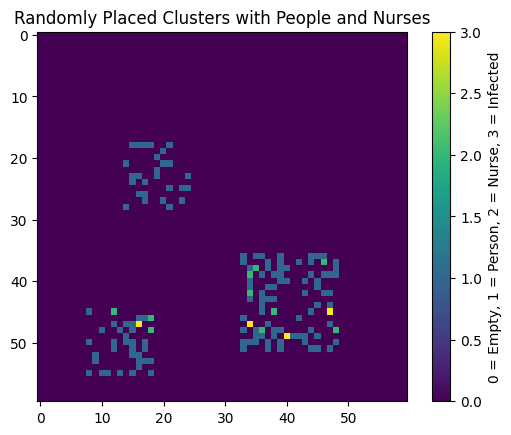

In [691]:
# from cls import *
import time
BOARDSIZE = 60
NUM_CLUSTERS = 3
PROB_NURSE = 0.05
PROB_PERSON = 0.3
sim = Simulation(board_size=BOARDSIZE,num_clusters=NUM_CLUSTERS,
                    prob_nurse=PROB_NURSE,prob_person=PROB_PERSON)
# print(sim.show_map())
sim.start()
sim.view()
# while True:
#     sim.step()
#     sim.view()
#     time.sleep(3)
# if __name__ == "__main__": 
#     main()

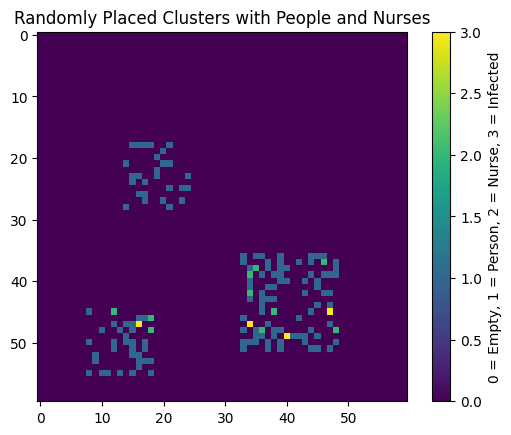

Node health is 4
Adding from [<cls.Disease object at 0x143d221d0>] [<cls.Disease object at 0x143d221d0>]
infectivity->0.3940558067690666 | mortality->0.5466433786298861 | kill_chance->0.26008435781648864 | name->42d0541c-8b16-4bd4-bf28-9698b27e6e77 |  added to 48 39
Adding from [<cls.Disease object at 0x143d221d0>] [<cls.Disease object at 0x143d221d0>]
Adding from [<cls.Disease object at 0x143d221d0>] [<cls.Disease object at 0x143d221d0>]
infectivity->0.3940558067690666 | mortality->0.5466433786298861 | kill_chance->0.26008435781648864 | name->42d0541c-8b16-4bd4-bf28-9698b27e6e77 |  added to 50 39
{(45, 38): 3, (48, 36): 3, (48, 48): 7, (42, 34): 8, (39, 34): 9, (38, 35): 9, (37, 46): 11, (46, 18): 20, (48, 18): 20, (45, 12): 25}
48 40 45 38 distance  3.605551275463989
48 41 45 38 distance  4.242640687119285
49 39 45 38 distance  4.123105625617661
50 40 45 38 distance  5.385164807134504
50 41 45 38 distance  5.830951894845301
Adding from [<cls.Disease object at 0x143d221d0>] [<cls.Dise

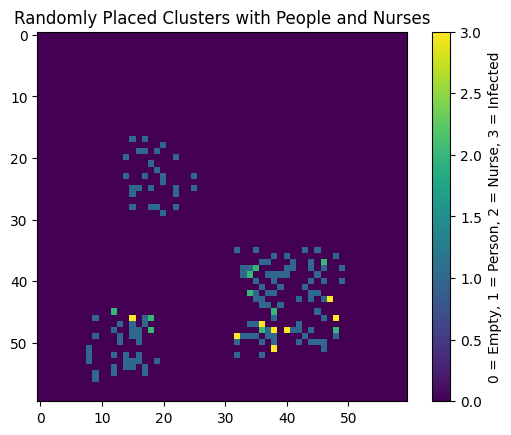

In [692]:
sim.view()
sim.step()
sim.view()

In [693]:

import importlib
import cls  # Assuming `cls.py` is in the same directory
importlib.reload(cls)



<module 'cls' from '/Users/oscar/SEM-2-2024/CITS4403/Project/CITS4403_Project/cls.py'>

In [694]:
import os
print(os.listdir())  # This should show your current directory and files, including cls.py


['overall_stats.csv', 'run.py', 'Run_Notebook.ipynb', '.DS_Store', 'requirements.txt', 'over_15_7_1.csv', 'inf_01_7_1.csv', 'cls.py', 'over_05_2_2.csv', 'over_05_2_1.csv', '__pycache__', 'README.md', 'map.py', 'inf_15_7_1.csv', '.gitignore', 'Jupyter_added_sim', '.ipynb_checkpoints', 'sim_study_2.Rmd', 'venv', 'CITS4403_simulation_study.Rmd', '.git', 'inf_05_2_1.csv', 'over_01_7_1.csv', 'infected_person_stats.csv', 'inf_05_2_2.csv']


In [695]:
from cls import *


In [696]:
from cls import *

BOARDSIZE = 20
NUM_CLUSTERS = 1
PROB_NURSE = 0.15
PROB_PERSON = 0.2

sim = Simulation(board_size=BOARDSIZE, num_clusters=NUM_CLUSTERS,
                 prob_nurse=PROB_NURSE, prob_person=PROB_PERSON)

sim.start()
sim.run(steps=5,delay=0.02)
#sim.animate(steps=50, interval=200)


Infecting 1


AttributeError: 'Simulation' object has no attribute 'run'

In [ ]:
# Assuming cls refers to your main simulation classes already defined (e.g., Simulation class and relevant entities)
from cls import *

BOARDSIZE = 60
NUM_CLUSTERS = 3
PROB_NURSE = 0.05
PROB_PERSON = 0.2


# Initialize the simulation with the given parameters
sim = Simulation(board_size=BOARDSIZE, num_clusters=NUM_CLUSTERS,
                 prob_nurse=PROB_NURSE, prob_person=PROB_PERSON)

# Start and run the simulation
sim.start()
sim.run(steps=10, delay=0.02)


In [ ]:
import importlib
import cls  # Assuming `cls.py` is in the same directory
importlib.reload(cls)
import os
print(os.listdir())  # This should show your current directory and files, including cls.py


['overall_stats.csv', 'run.py', 'Run_Notebook.ipynb', '.DS_Store', 'requirements.txt', 'over_15_7_1.csv', 'inf_01_7_1.csv', 'cls.py', 'over_05_2_2.csv', 'over_05_2_1.csv', '__pycache__', 'README.md', 'map.py', 'inf_15_7_1.csv', '.gitignore', 'Jupyter_added_sim', '.ipynb_checkpoints', 'sim_study_2.Rmd', 'venv', 'CITS4403_simulation_study.Rmd', '.git', 'inf_05_2_1.csv', 'over_01_7_1.csv', 'infected_person_stats.csv', 'inf_05_2_2.csv']


Infecting 4


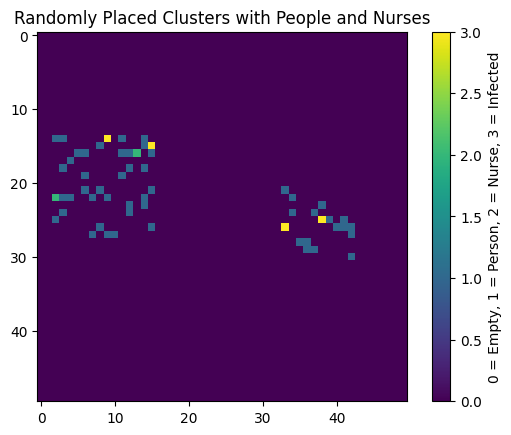

Neighbour 22 2 None
Node health is 7
Adding from [<cls.Disease object at 0x28d33e290>] [<cls.Disease object at 0x28d33e290>]
{(16, 13): 3, (22, 2): 7}
13 8 16 13 distance  5.830951894845301
13 9 16 13 distance  5.0
13 10 16 13 distance  4.242640687119285
14 8 16 13 distance  5.385164807134504
14 10 16 13 distance  3.605551275463989
15 9 16 13 distance  4.123105625617661
15 10 16 13 distance  3.1622776601683795
Adding from [<cls.Disease object at 0x28d33e290>] [<cls.Disease object at 0x28d33e290>]
Adding from [<cls.Disease object at 0x28d33e290>] [<cls.Disease object at 0x28d33e290>]
infectivity->0.14665650035659672 | mortality->0.9521130890093026 | kill_chance->0.21495363457892014 | name->c4cd48c6-79b1-4361-98e1-998ff062aaf2 |  added to 16 11
Health decreased
Node health is 3
{(16, 13): 19, (22, 2): 29}
25 32 16 13 distance  21.02379604162864
25 33 16 13 distance  21.93171219946131
25 34 16 13 distance  22.847319317591726
26 32 16 13 distance  21.470910553583888
26 34 16 13 distance  2

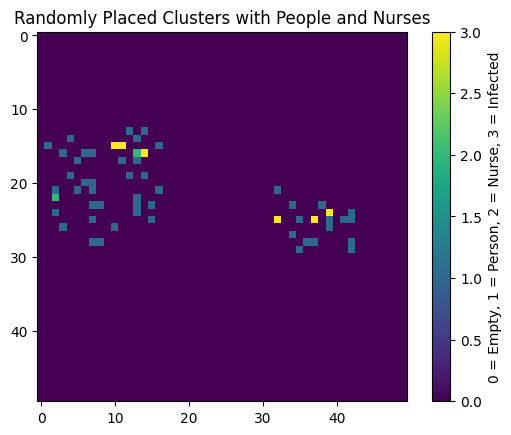

Health decreased
Node health is 2
{(16, 13): 18, (22, 2): 28}
24 31 16 13 distance  19.697715603592208
24 32 16 13 distance  20.615528128088304
24 33 16 13 distance  21.540659228538015
25 31 16 13 distance  20.12461179749811
25 33 16 13 distance  21.93171219946131
26 31 16 13 distance  20.591260281974
26 32 16 13 distance  21.470910553583888
26 33 16 13 distance  22.360679774997898
Node health is 4
Adding from [<cls.Disease object at 0x2a483bf10>] [<cls.Disease object at 0x2a483bf10>]
{(16, 13): 23, (22, 2): 33}
24 36 16 13 distance  24.351591323771842
24 37 16 13 distance  25.298221281347036
24 38 16 13 distance  26.248809496813376
25 36 16 13 distance  24.698178070456937
26 36 16 13 distance  25.079872407968907
26 37 16 13 distance  26.0
26 38 16 13 distance  26.92582403567252
Adding from [<cls.Disease object at 0x2a483bf10>] [<cls.Disease object at 0x2a483bf10>]
Adding from [<cls.Disease object at 0x2a483bf10>] [<cls.Disease object at 0x2a483bf10>]
Neighbour 16 13 nurse->False | imm

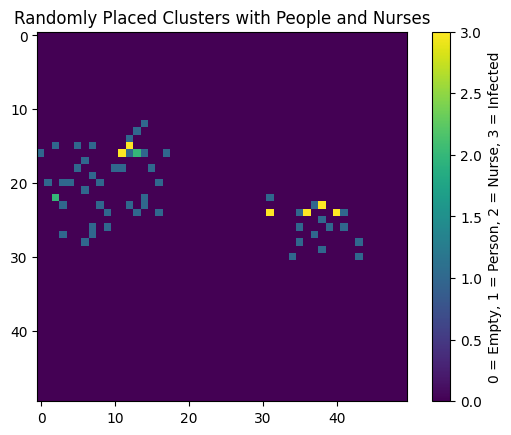

Health decreased
Node health is 3
Adding from [<cls.Disease object at 0x2a4cdf8b0>] [<cls.Disease object at 0x2a4cdf8b0>]
{(16, 13): 24, (22, 2): 34}
22 37 16 13 distance  24.73863375370596
22 38 16 13 distance  25.709920264364882
22 39 16 13 distance  26.68332812825267
23 39 16 13 distance  26.92582403567252
24 37 16 13 distance  25.298221281347036
24 38 16 13 distance  26.248809496813376
24 39 16 13 distance  27.202941017470888
Adding from [<cls.Disease object at 0x2a4cdf8b0>] [<cls.Disease object at 0x2a4cdf8b0>]
Neighbour 22 2 None
Health decreased
Node health is 5
Adding from [<cls.Disease object at 0x28ceb5360>] [<cls.Disease object at 0x28ceb5360>]
infectivity->0.14665650035659672 | mortality->0.9521130890093026 | kill_chance->0.21495363457892014 | name->c4cd48c6-79b1-4361-98e1-998ff062aaf2 |  added to 15 13
Adding from [<cls.Disease object at 0x28ceb5360>] [<cls.Disease object at 0x28ceb5360>]
infectivity->0.14665650035659672 | mortality->0.9521130890093026 | kill_chance->0.214

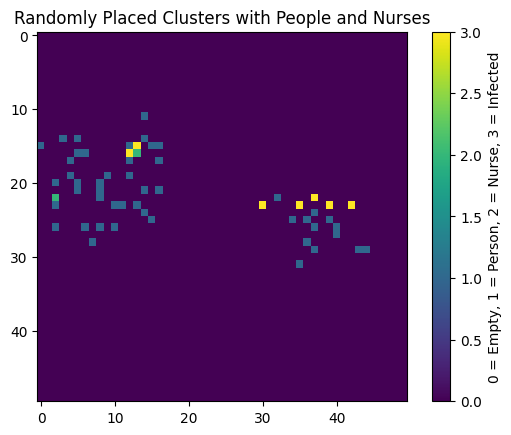

Neighbour 16 13 nurse->False | immunity->0 | natural_resistance->0.008904573121481008 | starting_health->6 | health->6 | diseases->[<cls.Disease object at 0x2a4bc4700>] | 
Node health is 6
Neighbour 22 2 None
Node health is 1
{(16, 13): 16, (22, 2): 27}
22 29 16 13 distance  17.08800749063506
22 30 16 13 distance  18.027756377319946
22 31 16 13 distance  18.973665961010276
23 29 16 13 distance  17.46424919657298
23 31 16 13 distance  19.313207915827967
24 29 16 13 distance  17.88854381999832
24 30 16 13 distance  18.788294228055936
24 31 16 13 distance  19.697715603592208
Health decreased
Node health is 4
Adding from [<cls.Disease object at 0x2a4bc4700>] [<cls.Disease object at 0x2a4bc4700>]
Adding from [<cls.Disease object at 0x2a4bc4700>] [<cls.Disease object at 0x2a4bc4700>]
Adding from [<cls.Disease object at 0x2a4bc4700>] [<cls.Disease object at 0x2a4bc4700>]
Adding from [<cls.Disease object at 0x2a4bc4700>] [<cls.Disease object at 0x2a4bc4700>]
Health decreased
Node health is 2
{

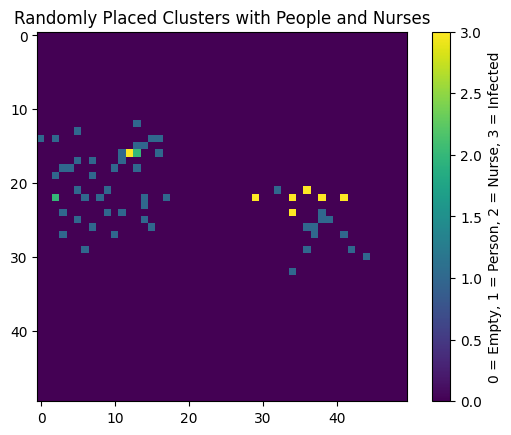

Node health is 4
Adding from [<cls.Disease object at 0x2a3fb1c30>] [<cls.Disease object at 0x2a3fb1c30>]
Adding from [<cls.Disease object at 0x2a3fb1c30>] [<cls.Disease object at 0x2a3fb1c30>]
Adding from [<cls.Disease object at 0x2a3fb1c30>] [<cls.Disease object at 0x2a3fb1c30>]
infectivity->0.14665650035659672 | mortality->0.9521130890093026 | kill_chance->0.21495363457892014 | name->c4cd48c6-79b1-4361-98e1-998ff062aaf2 |  added to 16 13
Adding from [<cls.Disease object at 0x2a3fb1c30>] [<cls.Disease object at 0x2a3fb1c30>]
Health decreased
Node health is 1
{(16, 13): 20, (22, 2): 30}
21 33 16 13 distance  20.615528128088304
21 34 16 13 distance  21.587033144922902
21 35 16 13 distance  22.561028345356956
22 33 16 13 distance  20.8806130178211
22 35 16 13 distance  22.80350850198276
23 33 16 13 distance  21.18962010041709
23 34 16 13 distance  22.135943621178654
23 35 16 13 distance  23.08679276123039
Adding from [<cls.Disease object at 0x2a3cf6860>] [<cls.Disease object at 0x2a3cf68

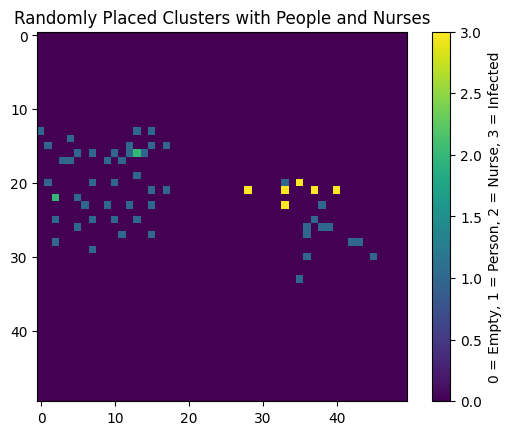

Health decreased
Node health is 2
{(16, 13): 23, (22, 2): 33}
20 36 16 13 distance  23.345235059857504
20 37 16 13 distance  24.331050121192877
20 38 16 13 distance  25.317977802344327
21 36 16 13 distance  23.53720459187964
21 38 16 13 distance  25.495097567963924
22 36 16 13 distance  23.769728648009426
22 37 16 13 distance  24.73863375370596
22 38 16 13 distance  25.709920264364882
Adding from [<cls.Disease object at 0x28d309600>] [<cls.Disease object at 0x28d309600>]
Neighbour 16 13 None
Node health is 1
Adding from [<cls.Disease object at 0x28d309600>] [<cls.Disease object at 0x28d309600>]
{(16, 13): 21, (22, 2): 31}
19 34 16 13 distance  21.213203435596427
19 35 16 13 distance  22.20360331117452
19 36 16 13 distance  23.194827009486403
20 34 16 13 distance  21.37755832643195
21 34 16 13 distance  21.587033144922902
21 35 16 13 distance  22.561028345356956
21 36 16 13 distance  23.53720459187964
Adding from [<cls.Disease object at 0x28d309600>] [<cls.Disease object at 0x28d309600>

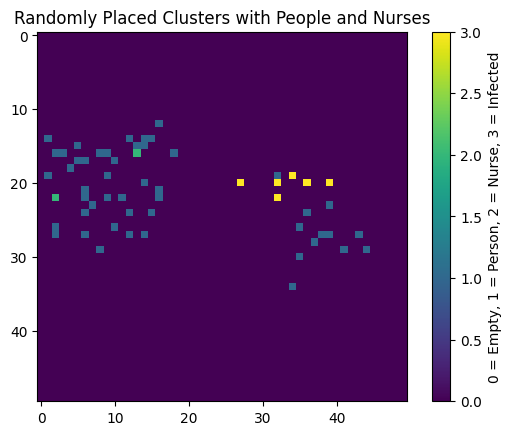

Node health is 1
{(16, 13): 13, (22, 2): 23}
19 26 16 13 distance  13.341664064126334
19 27 16 13 distance  14.317821063276353
19 28 16 13 distance  15.297058540778355
20 26 16 13 distance  13.601470508735444
20 28 16 13 distance  15.524174696260024
21 26 16 13 distance  13.92838827718412
21 27 16 13 distance  14.866068747318506
21 28 16 13 distance  15.811388300841896
Neighbour 16 13 None
Health decreased
Node health is 1
{(16, 13): 25, (22, 2): 35}
19 38 16 13 distance  25.179356624028344
19 39 16 13 distance  26.1725046566048
19 40 16 13 distance  27.16615541441225
20 38 16 13 distance  25.317977802344327
20 40 16 13 distance  27.294688127912362
21 38 16 13 distance  25.495097567963924
21 39 16 13 distance  26.476404589747453
21 40 16 13 distance  27.459060435491963
Health decreased
Node health is 4
{(16, 13): 18, (22, 2): 28}
21 31 16 13 distance  18.681541692269406
21 32 16 13 distance  19.6468827043885
21 33 16 13 distance  20.615528128088304
22 31 16 13 distance  18.973665961010

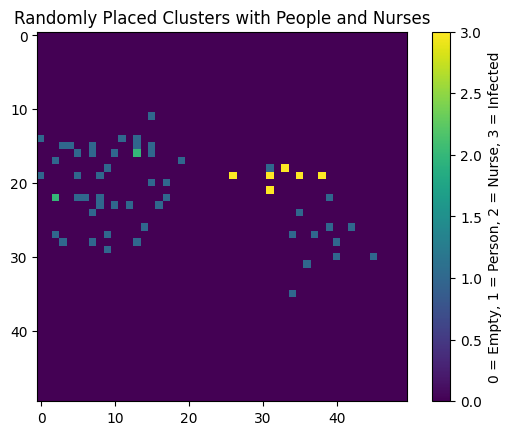

Node health is 1
{(16, 13): 19, (22, 2): 29}
17 32 16 13 distance  19.026297590440446
17 33 16 13 distance  20.024984394500787
17 34 16 13 distance  21.02379604162864
18 32 16 13 distance  19.1049731745428
18 34 16 13 distance  21.095023109728988
19 32 16 13 distance  19.235384061671343
19 33 16 13 distance  20.223748416156685
19 34 16 13 distance  21.213203435596427
Adding from [<cls.Disease object at 0x16d87a2c0>] [<cls.Disease object at 0x16d87a2c0>]
Node health is 1
{(16, 13): 21, (22, 2): 31}
18 34 16 13 distance  21.095023109728988
18 35 16 13 distance  22.090722034374522
18 36 16 13 distance  23.08679276123039
19 34 16 13 distance  21.213203435596427
19 36 16 13 distance  23.194827009486403
20 34 16 13 distance  21.37755832643195
20 35 16 13 distance  22.360679774997898
20 36 16 13 distance  23.345235059857504
Neighbour 22 2 None
Node health is 1
{(16, 13): 24, (22, 2): 34}
18 37 16 13 distance  24.08318915758459
18 38 16 13 distance  25.079872407968907
18 39 16 13 distance  26.

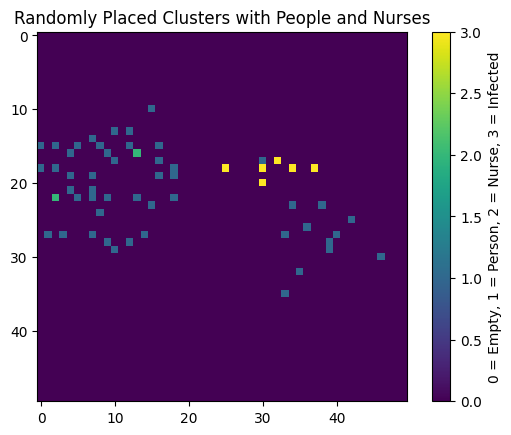

Node health is 1
{(16, 13): 11, (22, 2): 21}
17 24 16 13 distance  11.045361017187261
17 25 16 13 distance  12.041594578792296
17 26 16 13 distance  13.038404810405298
18 24 16 13 distance  11.180339887498949
18 26 16 13 distance  13.152946437965905
19 24 16 13 distance  11.40175425099138
19 25 16 13 distance  12.36931687685298
19 26 16 13 distance  13.341664064126334
Node health is 1
{(16, 13): 20, (22, 2): 30}
17 33 16 13 distance  20.024984394500787
17 34 16 13 distance  21.02379604162864
17 35 16 13 distance  22.02271554554524
18 33 16 13 distance  20.09975124224178
18 35 16 13 distance  22.090722034374522
19 33 16 13 distance  20.223748416156685
19 34 16 13 distance  21.213203435596427
19 35 16 13 distance  22.20360331117452
Adding from [<cls.Disease object at 0x1663836a0>] [<cls.Disease object at 0x1663836a0>]
Health decreased
Node health is 2
{(16, 13): 16, (22, 2): 26}
19 29 16 13 distance  16.278820596099706
19 30 16 13 distance  17.26267650163207
19 31 16 13 distance  18.2482

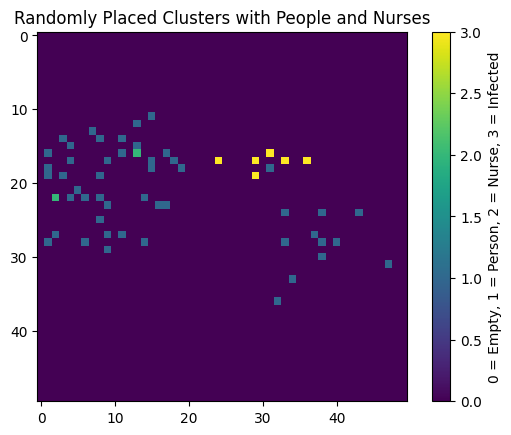

Neighbour 16 13 None
Node health is 2
{(16, 13): 15, (22, 2): 25}
18 28 16 13 distance  15.132745950421556
18 29 16 13 distance  16.1245154965971
18 30 16 13 distance  17.11724276862369
19 28 16 13 distance  15.297058540778355
19 30 16 13 distance  17.26267650163207
20 28 16 13 distance  15.524174696260024
20 29 16 13 distance  16.492422502470642
20 30 16 13 distance  17.46424919657298
Adding from [<cls.Disease object at 0x2833abdc0>] [<cls.Disease object at 0x2833abdc0>]
Node health is 1
{(16, 13): 19, (22, 2): 29}
16 32 16 13 distance  19.0
16 33 16 13 distance  20.0
16 34 16 13 distance  21.0
17 32 16 13 distance  19.026297590440446
17 34 16 13 distance  21.02379604162864
18 32 16 13 distance  19.1049731745428
18 33 16 13 distance  20.09975124224178
18 34 16 13 distance  21.095023109728988
Adding from [<cls.Disease object at 0x2833abdc0>] [<cls.Disease object at 0x2833abdc0>]
Neighbour 22 2 None
Node health is 1
{(16, 13): 22, (22, 2): 32}
16 35 16 13 distance  22.0
16 36 16 13 dist

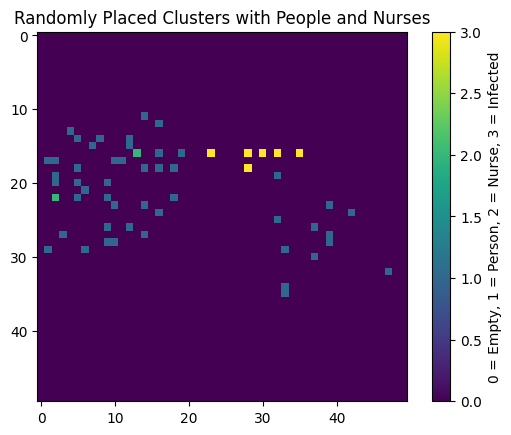

Health decreased
Node health is 1
{(16, 13): 14, (22, 2): 24}
17 27 16 13 distance  14.035668847618199
17 28 16 13 distance  15.033296378372908
17 29 16 13 distance  16.0312195418814
18 27 16 13 distance  14.142135623730951
18 29 16 13 distance  16.1245154965971
19 27 16 13 distance  14.317821063276353
19 28 16 13 distance  15.297058540778355
19 29 16 13 distance  16.278820596099706
Adding from [<cls.Disease object at 0x2a470e8c0>] [<cls.Disease object at 0x2a470e8c0>]
Node health is 1
{(16, 13): 9, (22, 2): 19}
15 22 16 13 distance  9.055385138137417
15 23 16 13 distance  10.04987562112089
15 24 16 13 distance  11.045361017187261
16 22 16 13 distance  9.0
16 24 16 13 distance  11.0
17 22 16 13 distance  9.055385138137417
17 23 16 13 distance  10.04987562112089
17 24 16 13 distance  11.045361017187261
Neighbour 22 2 None
Node health is 0
Node died
Neighbour 16 13 None
Node health is 1
{(16, 13): 21, (22, 2): 31}
15 34 16 13 distance  21.02379604162864
15 35 16 13 distance  22.022715545

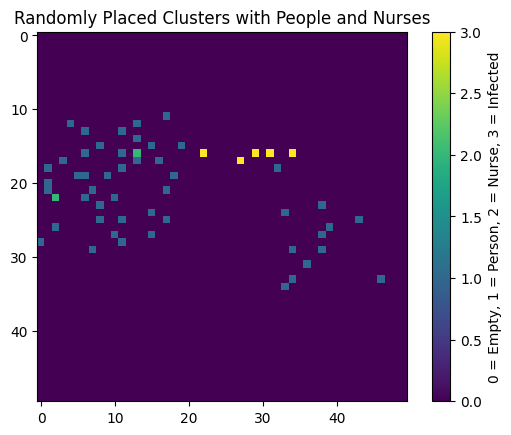

Node health is 1
{(16, 13): 20, (22, 2): 30}
15 33 16 13 distance  20.024984394500787
15 34 16 13 distance  21.02379604162864
15 35 16 13 distance  22.02271554554524
16 33 16 13 distance  20.0
16 35 16 13 distance  22.0
17 33 16 13 distance  20.024984394500787
17 34 16 13 distance  21.02379604162864
17 35 16 13 distance  22.02271554554524
Neighbour 22 2 None
Node health is 1
{(16, 13): 8, (22, 2): 18}
15 21 16 13 distance  8.06225774829855
15 22 16 13 distance  9.055385138137417
15 23 16 13 distance  10.04987562112089
16 21 16 13 distance  8.0
16 23 16 13 distance  10.0
17 21 16 13 distance  8.06225774829855
17 22 16 13 distance  9.055385138137417
17 23 16 13 distance  10.04987562112089
Node health is 0
Node died
Neighbour 16 13 None
Node health is 1
{(16, 13): 15, (22, 2): 25}
15 28 16 13 distance  15.033296378372908
15 29 16 13 distance  16.0312195418814
15 30 16 13 distance  17.029386365926403
16 28 16 13 distance  15.0
16 30 16 13 distance  17.0
17 28 16 13 distance  15.03329637837

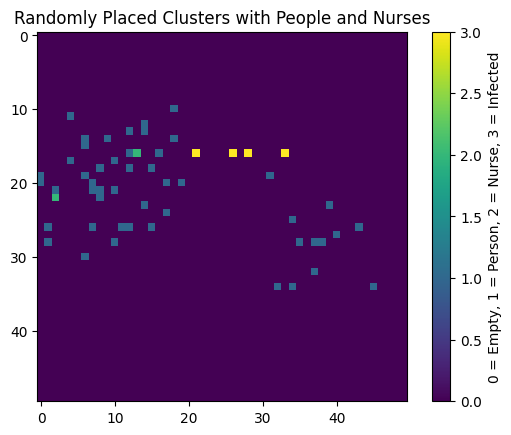

Node health is 1
{(16, 13): 14, (22, 2): 24}
15 27 16 13 distance  14.035668847618199
15 28 16 13 distance  15.033296378372908
15 29 16 13 distance  16.0312195418814
16 27 16 13 distance  14.0
16 29 16 13 distance  16.0
17 27 16 13 distance  14.035668847618199
17 28 16 13 distance  15.033296378372908
17 29 16 13 distance  16.0312195418814
Adding from [<cls.Disease object at 0x1608bd330>] [<cls.Disease object at 0x1608bd330>]
Neighbour 22 2 None
Node health is 0
Node died
Node health is 0
Node died
Neighbour 16 13 None
Node health is 1
{(16, 13): 7, (22, 2): 17}
15 20 16 13 distance  7.0710678118654755
15 21 16 13 distance  8.06225774829855
15 22 16 13 distance  9.055385138137417
16 20 16 13 distance  7.0
16 22 16 13 distance  9.0
17 20 16 13 distance  7.0710678118654755
17 21 16 13 distance  8.06225774829855
17 22 16 13 distance  9.055385138137417


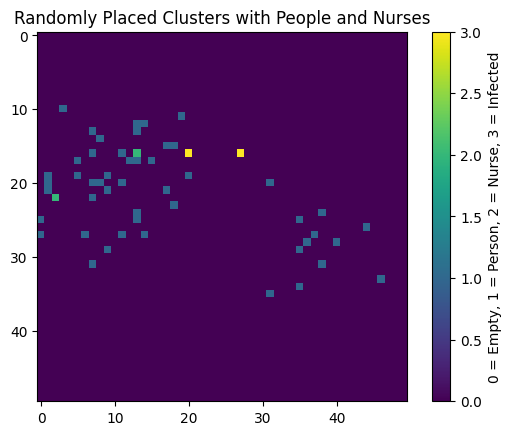

Neighbour 22 2 None
Neighbour 16 13 None
Node health is 1
{(16, 13): 13, (22, 2): 23}
15 26 16 13 distance  13.038404810405298
15 27 16 13 distance  14.035668847618199
15 28 16 13 distance  15.033296378372908
16 26 16 13 distance  13.0
16 28 16 13 distance  15.0
17 26 16 13 distance  13.038404810405298
17 27 16 13 distance  14.035668847618199
17 28 16 13 distance  15.033296378372908
Node health is 1
{(16, 13): 6, (22, 2): 16}
15 19 16 13 distance  6.082762530298219
15 20 16 13 distance  7.0710678118654755
15 21 16 13 distance  8.06225774829855
16 19 16 13 distance  6.0
16 21 16 13 distance  8.0
17 19 16 13 distance  6.082762530298219
17 20 16 13 distance  7.0710678118654755
17 21 16 13 distance  8.06225774829855


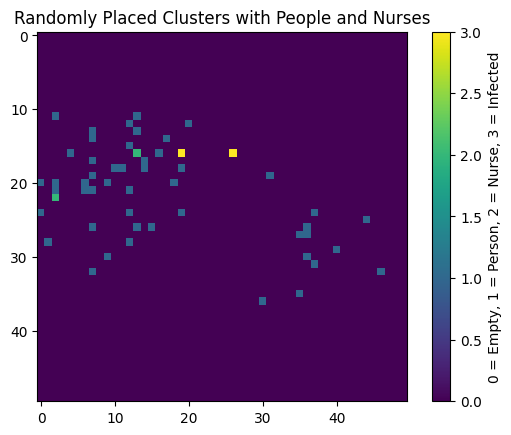

Node health is 1
{(16, 13): 5, (22, 2): 15}
15 18 16 13 distance  5.0990195135927845
15 19 16 13 distance  6.082762530298219
15 20 16 13 distance  7.0710678118654755
16 18 16 13 distance  5.0
16 20 16 13 distance  7.0
17 18 16 13 distance  5.0990195135927845
17 19 16 13 distance  6.082762530298219
17 20 16 13 distance  7.0710678118654755
Node health is 0
Node died
Neighbour 22 2 None
Neighbour 16 13 None


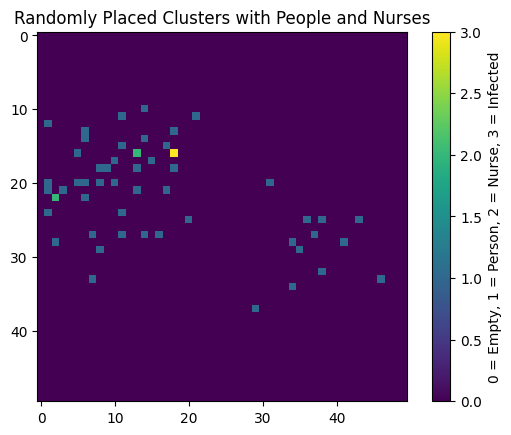

Neighbour 22 2 None
Node health is 1
{(16, 13): 4, (22, 2): 14}
15 17 16 13 distance  4.123105625617661
15 18 16 13 distance  5.0990195135927845
15 19 16 13 distance  6.082762530298219
16 17 16 13 distance  4.0
16 19 16 13 distance  6.0
17 17 16 13 distance  4.123105625617661
17 18 16 13 distance  5.0990195135927845
17 19 16 13 distance  6.082762530298219
Neighbour 16 13 None


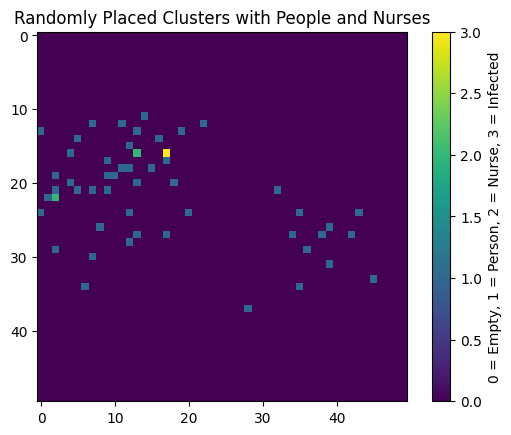

Node health is 1
Adding from [<cls.Disease object at 0x166524d60>] [<cls.Disease object at 0x166524d60>]
{(16, 13): 3, (22, 2): 13}
15 16 16 13 distance  3.1622776601683795
15 17 16 13 distance  4.123105625617661
15 18 16 13 distance  5.0990195135927845
16 16 16 13 distance  3.0
16 18 16 13 distance  5.0
17 16 16 13 distance  3.1622776601683795
17 18 16 13 distance  5.0990195135927845
Adding from [<cls.Disease object at 0x166524d60>] [<cls.Disease object at 0x166524d60>]
Neighbour 22 2 None
Neighbour 16 13 None


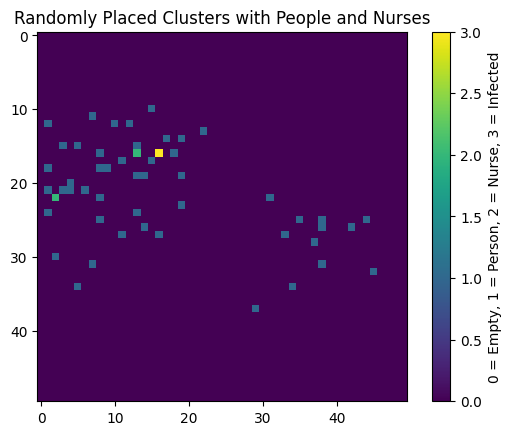

Node health is 1
Adding from [<cls.Disease object at 0x28c9f0670>] [<cls.Disease object at 0x28c9f0670>]
{(16, 13): 2, (22, 2): 12}
15 15 16 13 distance  2.23606797749979
15 16 16 13 distance  3.1622776601683795
15 17 16 13 distance  4.123105625617661
16 15 16 13 distance  2.0
16 17 16 13 distance  4.0
17 16 16 13 distance  3.1622776601683795
17 17 16 13 distance  4.123105625617661
Adding from [<cls.Disease object at 0x28c9f0670>] [<cls.Disease object at 0x28c9f0670>]
Neighbour 22 2 None
Neighbour 16 13 None


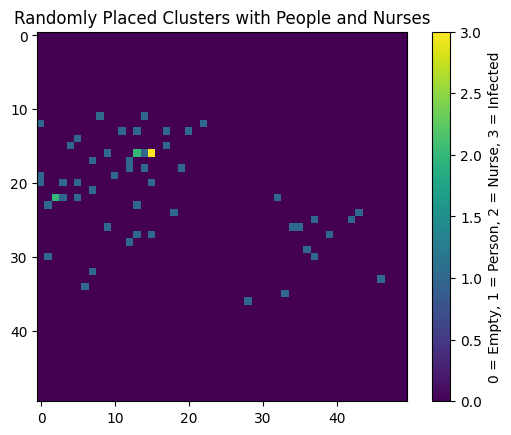

Neighbour 16 13 None
Node health is 1
Adding from [<cls.Disease object at 0x28351e380>] [<cls.Disease object at 0x28351e380>]
{(16, 13): 1, (22, 2): 11}
15 14 16 13 distance  1.4142135623730951
15 15 16 13 distance  2.23606797749979
15 16 16 13 distance  3.1622776601683795
16 14 16 13 distance  1.0
16 16 16 13 distance  3.0
17 15 16 13 distance  2.23606797749979
17 16 16 13 distance  3.1622776601683795
Adding from [<cls.Disease object at 0x28351e380>] [<cls.Disease object at 0x28351e380>]
Adding from [<cls.Disease object at 0x28351e380>] [<cls.Disease object at 0x28351e380>]
Adding from [<cls.Disease object at 0x28351e380>] [<cls.Disease object at 0x28351e380>]
Adding from [<cls.Disease object at 0x28351e380>] [<cls.Disease object at 0x28351e380>]
infectivity->0.14665650035659672 | mortality->0.9521130890093026 | kill_chance->0.21495363457892014 | name->c4cd48c6-79b1-4361-98e1-998ff062aaf2 |  added to 17 14
Neighbour 22 2 None


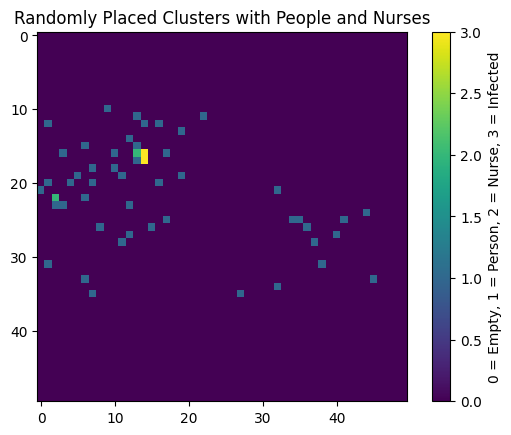

Neighbour 16 13 nurse->False | immunity->0 | natural_resistance->0.18769770756278303 | starting_health->4 | health->1 | diseases->[<cls.Disease object at 0x299ce3b50>] | 
Node health is 1
Health decreased
Node health is 3
Adding from [<cls.Disease object at 0x299ce3b50>] [<cls.Disease object at 0x299ce3b50>]
Adding from [<cls.Disease object at 0x299ce3b50>] [<cls.Disease object at 0x299ce3b50>]
Adding from [<cls.Disease object at 0x299ce3b50>] [<cls.Disease object at 0x299ce3b50>]
Neighbour 22 2 None


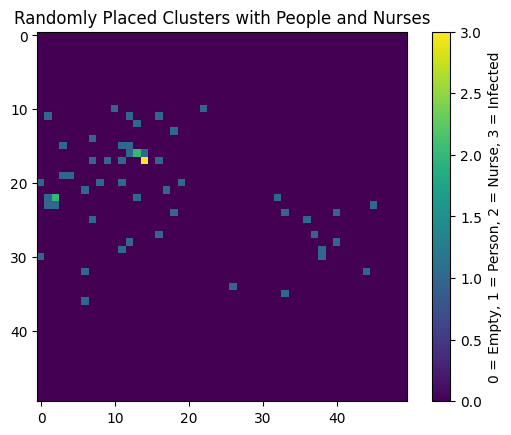

Neighbour 16 13 nurse->False | immunity->0 | natural_resistance->0.16096894996122946 | starting_health->4 | health->3 | diseases->[<cls.Disease object at 0x28d5b8370>] | 
Neighbour 22 2 None
Node health is 3


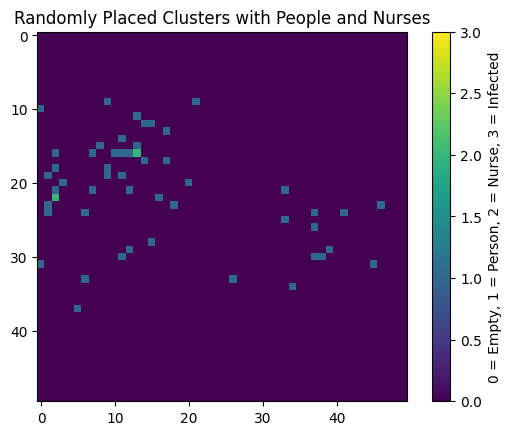

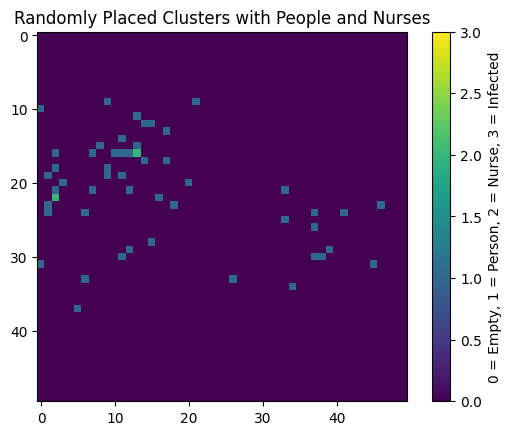

AttributeError: 'Simulation' object has no attribute 'appended_stats'

In [ ]:
from cls import *

BOARDSIZE = 50
NUM_CLUSTERS = 2
PROB_NURSE = 0.05
PROB_PERSON = 0.2

sim = Simulation(board_size=BOARDSIZE, num_clusters=NUM_CLUSTERS,
                 prob_nurse=PROB_NURSE, prob_person=PROB_PERSON)


sim.start()
sim.view()
sim.run_to_end()
sim.view()
sim.appended_stats()
sim.end()

#sim.animate(steps=50, interval=200)

In [ ]:
from cls import *

# Define simulation parameters
BOARDSIZE = 50
NUM_CLUSTERS = 2
PROB_NURSE = 0.05
PROB_PERSON = 0.2

sim_num = 0

Infecting 2


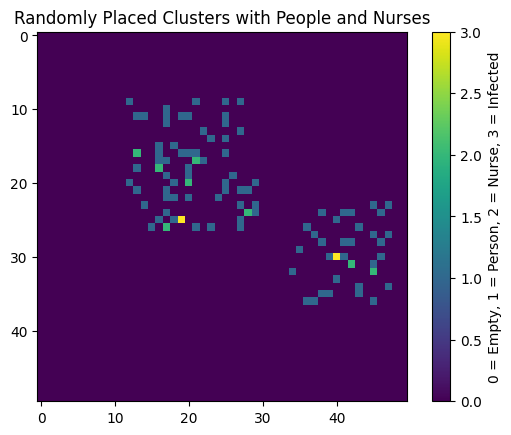

Neighbour 31 42 None
Neighbour 20 20 None
Neighbour 18 16 None
Neighbour 16 13 None
Neighbour 32 45 None
Neighbour 24 28 None
Neighbour 26 17 None
Health decreased
Node health is 6
Adding from [<cls.Disease object at 0x166738310>] [<cls.Disease object at 0x166738310>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance->0.3333037235664389 | name->d3b0b52c-7316-4e6d-bc6c-09d2b1303352 |  added to 26 19
{(26, 17): 1, (20, 20): 4, (17, 21): 6, (18, 16): 6, (16, 13): 8, (24, 28): 8, (31, 42): 21, (32, 45): 23}
24 18 26 17 distance  2.23606797749979
24 19 26 17 distance  2.8284271247461903
24 20 26 17 distance  3.605551275463989
25 18 26 17 distance  1.4142135623730951
25 20 26 17 distance  3.1622776601683795
26 18 26 17 distance  1.0
26 20 26 17 distance  3.0
Adding from [<cls.Disease object at 0x166738310>] [<cls.Disease object at 0x166738310>]
Adding from [<cls.Disease object at 0x166738310>] [<cls.Disease object at 0x166738310>]
infectivity->0.5397095729985536 |

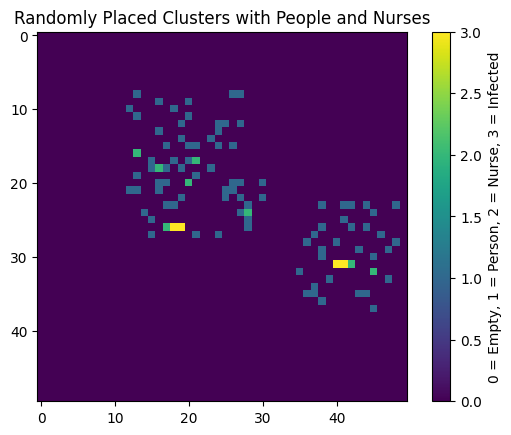

Health decreased
Node health is 3
Adding from [<cls.Disease object at 0x123814c40>] [<cls.Disease object at 0x123814c40>]
{(31, 42): 1, (32, 45): 3, (24, 28): 11, (20, 20): 18, (17, 21): 19, (18, 16): 21, (26, 17): 21, (16, 13): 24}
30 39 31 42 distance  3.1622776601683795
30 40 31 42 distance  2.23606797749979
30 41 31 42 distance  1.4142135623730951
31 39 31 42 distance  3.0
32 39 31 42 distance  3.1622776601683795
32 40 31 42 distance  2.23606797749979
32 41 31 42 distance  1.4142135623730951
Adding from [<cls.Disease object at 0x123814c40>] [<cls.Disease object at 0x123814c40>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance->0.3333037235664389 | name->d3b0b52c-7316-4e6d-bc6c-09d2b1303352 |  added to 31 41
Adding from [<cls.Disease object at 0x123814c40>] [<cls.Disease object at 0x123814c40>]
Health decreased
Node health is 5
Adding from [<cls.Disease object at 0x123814c40>] [<cls.Disease object at 0x123814c40>]
infectivity->0.5397095729985536 | mortal

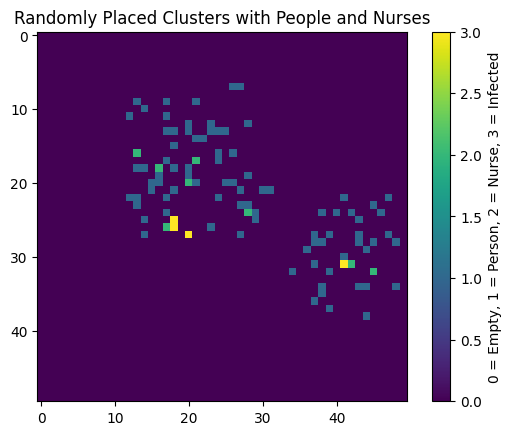

Neighbour 18 16 None
Health decreased
Node health is 5
Adding from [<cls.Disease object at 0x2a45f38e0>] [<cls.Disease object at 0x2a45f38e0>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance->0.3333037235664389 | name->d3b0b52c-7316-4e6d-bc6c-09d2b1303352 |  added to 24 17
Adding from [<cls.Disease object at 0x2a45f38e0>] [<cls.Disease object at 0x2a45f38e0>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance->0.3333037235664389 | name->d3b0b52c-7316-4e6d-bc6c-09d2b1303352 |  added to 26 17
Adding from [<cls.Disease object at 0x2a45f38e0>] [<cls.Disease object at 0x2a45f38e0>]
Neighbour 20 20 None
Neighbour 26 17 nurse->False | immunity->0 | natural_resistance->0.19033828994659663 | starting_health->7 | health->5 | diseases->[<cls.Disease object at 0x2a45f38e0>] | 
Health decreased
Node health is 5
Adding from [<cls.Disease object at 0x2a45f38e0>] [<cls.Disease object at 0x2a45f38e0>]
infectivity->0.5397095729985536 | mortality->

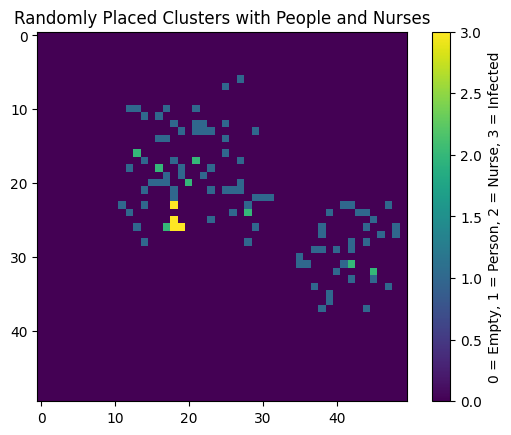

Neighbour 18 16 None
Node health is 5
Adding from [<cls.Disease object at 0x299cacb80>] [<cls.Disease object at 0x299cacb80>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance->0.3333037235664389 | name->d3b0b52c-7316-4e6d-bc6c-09d2b1303352 |  added to 22 18
{(20, 20): 2, (26, 17): 2, (17, 21): 4, (18, 16): 4, (16, 13): 6, (24, 28): 9, (31, 42): 22, (32, 45): 24}
22 17 20 20 distance  3.605551275463989
22 19 20 20 distance  2.23606797749979
23 17 20 20 distance  4.242640687119285
23 19 20 20 distance  3.1622776601683795
24 17 20 20 distance  5.0
24 18 20 20 distance  4.47213595499958
24 19 20 20 distance  4.123105625617661
Adding from [<cls.Disease object at 0x299cacb80>] [<cls.Disease object at 0x299cacb80>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance->0.3333037235664389 | name->d3b0b52c-7316-4e6d-bc6c-09d2b1303352 |  added to 21 18
Adding from [<cls.Disease object at 0x299cacb80>] [<cls.Disease object at 0x299cacb80>]
Heal

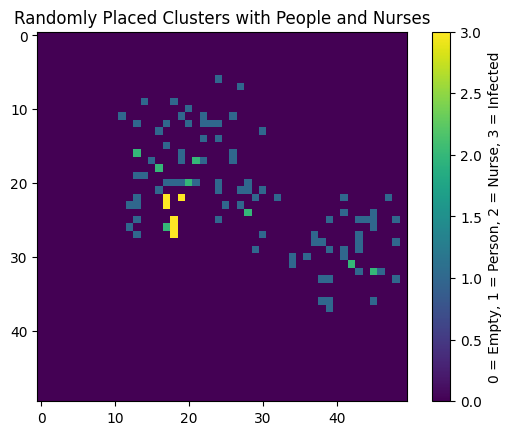

Neighbour 18 16 None
Neighbour 31 42 None
Neighbour 32 45 None
Health decreased
Node health is 3
Adding from [<cls.Disease object at 0x28d6fbca0>] [<cls.Disease object at 0x28d6fbca0>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance->0.3333037235664389 | name->d3b0b52c-7316-4e6d-bc6c-09d2b1303352 |  added to 26 17
Adding from [<cls.Disease object at 0x28d6fbca0>] [<cls.Disease object at 0x28d6fbca0>]
Health decreased
Node health is 4
{(20, 20): 1, (17, 21): 3, (18, 16): 3, (26, 17): 3, (16, 13): 5, (24, 28): 8, (31, 42): 21, (32, 45): 23}
21 18 20 20 distance  2.23606797749979
21 19 20 20 distance  1.4142135623730951
21 20 20 20 distance  1.0
22 18 20 20 distance  2.8284271247461903
22 20 20 20 distance  2.0
23 18 20 20 distance  3.605551275463989
23 19 20 20 distance  3.1622776601683795
23 20 20 20 distance  3.0
Adding from [<cls.Disease object at 0x28d6fbca0>] [<cls.Disease object at 0x28d6fbca0>]
Adding from [<cls.Disease object at 0x28d6fbca0>] [<cls.D

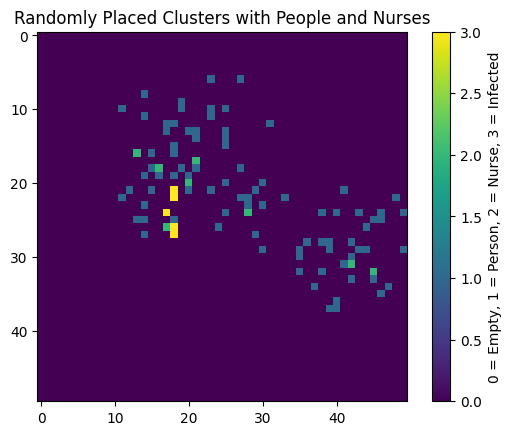

Health decreased
Node health is 2
Adding from [<cls.Disease object at 0x1347a81c0>] [<cls.Disease object at 0x1347a81c0>]
Adding from [<cls.Disease object at 0x1347a81c0>] [<cls.Disease object at 0x1347a81c0>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance->0.3333037235664389 | name->d3b0b52c-7316-4e6d-bc6c-09d2b1303352 |  added to 26 18
Health decreased
Node health is 4
Adding from [<cls.Disease object at 0x1347a81c0>] [<cls.Disease object at 0x1347a81c0>]
{(20, 20): 1, (18, 16): 2, (17, 21): 3, (16, 13): 4, (26, 17): 4, (24, 28): 8, (31, 42): 21, (32, 45): 23}
20 17 20 20 distance  3.0
20 18 20 20 distance  2.0
20 19 20 20 distance  1.0
21 17 20 20 distance  3.1622776601683795
21 19 20 20 distance  1.4142135623730951
22 17 20 20 distance  3.605551275463989
22 19 20 20 distance  2.23606797749979
Adding from [<cls.Disease object at 0x1347a81c0>] [<cls.Disease object at 0x1347a81c0>]
Adding from [<cls.Disease object at 0x1347a81c0>] [<cls.Disease object at

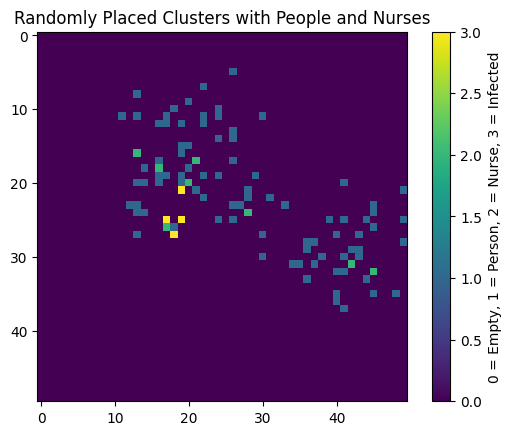

Neighbour 18 16 None
Neighbour 20 20 nurse->False | immunity->0 | natural_resistance->0.07443577134994216 | starting_health->6 | health->5 | diseases->[<cls.Disease object at 0x299b3b970>] | 
Neighbour 32 45 None
Health decreased
Node health is 4
Adding from [<cls.Disease object at 0x299b3b970>] [<cls.Disease object at 0x299b3b970>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance->0.3333037235664389 | name->d3b0b52c-7316-4e6d-bc6c-09d2b1303352 |  added to 26 18
{(26, 17): 1, (20, 20): 4, (17, 21): 6, (18, 16): 6, (16, 13): 8, (24, 28): 8, (31, 42): 21, (32, 45): 23}
24 18 26 17 distance  2.23606797749979
24 19 26 17 distance  2.8284271247461903
24 20 26 17 distance  3.605551275463989
25 18 26 17 distance  1.4142135623730951
25 20 26 17 distance  3.1622776601683795
26 19 26 17 distance  2.0
26 20 26 17 distance  3.0
Adding from [<cls.Disease object at 0x299b3b970>] [<cls.Disease object at 0x299b3b970>]
infectivity->0.5397095729985536 | mortality->0.85807215

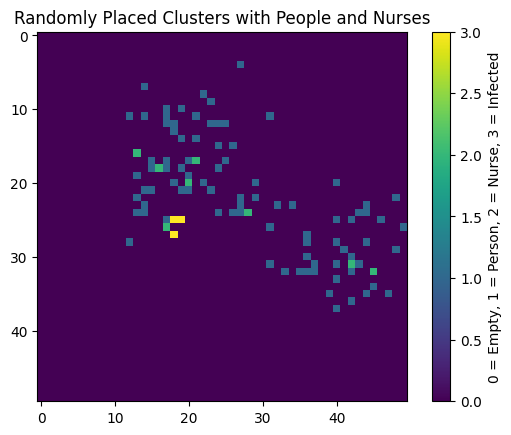

Neighbour 26 17 nurse->False | immunity->0 | natural_resistance->0.19033828994659663 | starting_health->7 | health->4 | diseases->[<cls.Disease object at 0x28d7fc820>] | 
Neighbour 32 45 None
Health decreased
Node health is 1
Adding from [<cls.Disease object at 0x28d7fc820>] [<cls.Disease object at 0x28d7fc820>]
Neighbour 31 42 None
Node health is 4
Neighbour 18 16 None
Neighbour 16 13 None
Neighbour 20 20 None
Neighbour 24 28 None
Neighbour 17 21 None
Health decreased
Node health is 2
Adding from [<cls.Disease object at 0x28d7fc820>] [<cls.Disease object at 0x28d7fc820>]
{(26, 17): 1, (20, 20): 4, (17, 21): 6, (18, 16): 6, (16, 13): 8, (24, 28): 8, (31, 42): 21, (32, 45): 23}
24 18 26 17 distance  2.23606797749979
24 19 26 17 distance  2.8284271247461903
24 20 26 17 distance  3.605551275463989
25 20 26 17 distance  3.1622776601683795
26 18 26 17 distance  1.0
26 19 26 17 distance  2.0
26 20 26 17 distance  3.0
Adding from [<cls.Disease object at 0x28d7fc820>] [<cls.Disease object at 0

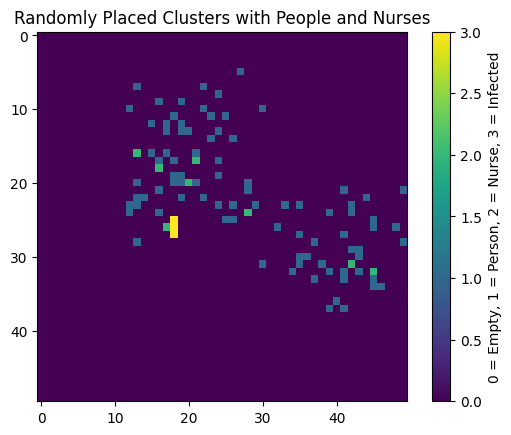

Health decreased
Node health is 3
Adding from [<cls.Disease object at 0x28d7ff3a0>] [<cls.Disease object at 0x28d7ff3a0>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance->0.3333037235664389 | name->d3b0b52c-7316-4e6d-bc6c-09d2b1303352 |  added to 26 17
Adding from [<cls.Disease object at 0x28d7ff3a0>] [<cls.Disease object at 0x28d7ff3a0>]
Neighbour 24 28 None
Neighbour 26 17 nurse->False | immunity->0 | natural_resistance->0.19033828994659663 | starting_health->7 | health->3 | diseases->[<cls.Disease object at 0x28d7ff3a0>] | 
Neighbour 18 16 None
Neighbour 31 42 None
Neighbour 16 13 None
Node health is 1
Adding from [<cls.Disease object at 0x28d7ff3a0>] [<cls.Disease object at 0x28d7ff3a0>]
Adding from [<cls.Disease object at 0x28d7ff3a0>] [<cls.Disease object at 0x28d7ff3a0>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance->0.3333037235664389 | name->d3b0b52c-7316-4e6d-bc6c-09d2b1303352 |  added to 26 18
Neighbour 17 21 None

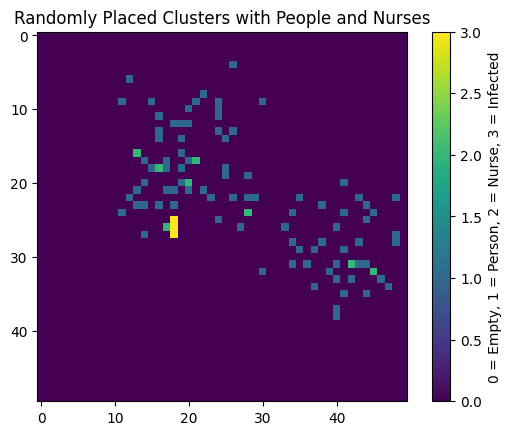

Neighbour 18 16 None
Node health is 1
Adding from [<cls.Disease object at 0x299b3a9e0>] [<cls.Disease object at 0x299b3a9e0>]
Adding from [<cls.Disease object at 0x299b3a9e0>] [<cls.Disease object at 0x299b3a9e0>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance->0.3333037235664389 | name->d3b0b52c-7316-4e6d-bc6c-09d2b1303352 |  added to 26 17
Adding from [<cls.Disease object at 0x299b3a9e0>] [<cls.Disease object at 0x299b3a9e0>]
Neighbour 31 42 None
Node health is 0
Node died
Neighbour 20 20 None
Neighbour 24 28 None
Neighbour 17 21 None
Neighbour 16 13 None
Health decreased
Node health is 2
Adding from [<cls.Disease object at 0x299b3a9e0>] [<cls.Disease object at 0x299b3a9e0>]
Adding from [<cls.Disease object at 0x299b3a9e0>] [<cls.Disease object at 0x299b3a9e0>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance->0.3333037235664389 | name->d3b0b52c-7316-4e6d-bc6c-09d2b1303352 |  added to 24 18
Adding from [<cls.Disease object a

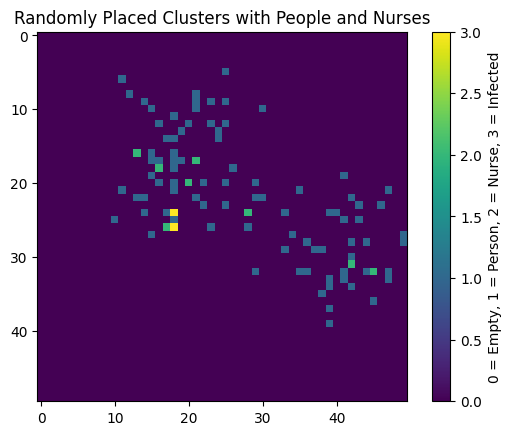

Neighbour 17 21 None
Neighbour 31 42 None
Health decreased
Node health is 3
Adding from [<cls.Disease object at 0x2a53c9f00>] [<cls.Disease object at 0x2a53c9f00>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance->0.3333037235664389 | name->d3b0b52c-7316-4e6d-bc6c-09d2b1303352 |  added to 24 17
Adding from [<cls.Disease object at 0x2a53c9f00>] [<cls.Disease object at 0x2a53c9f00>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance->0.3333037235664389 | name->d3b0b52c-7316-4e6d-bc6c-09d2b1303352 |  added to 24 19
{(26, 17): 1, (20, 20): 3, (17, 21): 5, (18, 16): 5, (16, 13): 7, (24, 28): 9, (31, 42): 22, (32, 45): 24}
23 17 26 17 distance  3.0
23 18 26 17 distance  3.1622776601683795
23 19 26 17 distance  3.605551275463989
25 17 26 17 distance  1.0
25 18 26 17 distance  1.4142135623730951
25 19 26 17 distance  2.23606797749979
Adding from [<cls.Disease object at 0x2a53c9f00>] [<cls.Disease object at 0x2a53c9f00>]
Adding from [<cls.

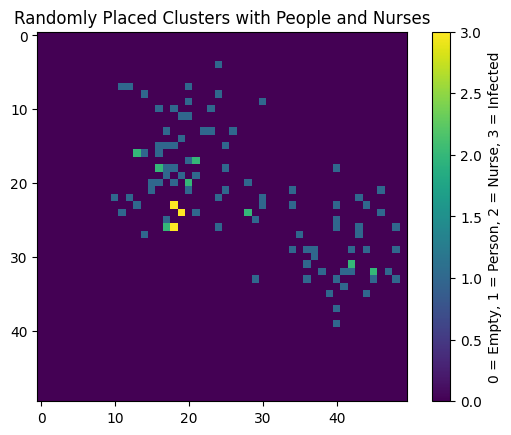

Neighbour 17 21 None
Neighbour 31 42 None
Neighbour 24 28 None
Neighbour 20 20 None
Neighbour 18 16 None
Health decreased
Node health is 1
Adding from [<cls.Disease object at 0x2a54547c0>] [<cls.Disease object at 0x2a54547c0>]
{(26, 17): 1, (20, 20): 3, (17, 21): 5, (18, 16): 6, (16, 13): 8, (24, 28): 8, (31, 42): 21, (32, 45): 23}
23 19 26 17 distance  3.605551275463989
23 20 26 17 distance  4.242640687119285
24 18 26 17 distance  2.23606797749979
24 20 26 17 distance  3.605551275463989
25 18 26 17 distance  1.4142135623730951
25 19 26 17 distance  2.23606797749979
25 20 26 17 distance  3.1622776601683795
Adding from [<cls.Disease object at 0x2a54547c0>] [<cls.Disease object at 0x2a54547c0>]
Adding from [<cls.Disease object at 0x2a54547c0>] [<cls.Disease object at 0x2a54547c0>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance->0.3333037235664389 | name->d3b0b52c-7316-4e6d-bc6c-09d2b1303352 |  added to 26 18
Neighbour 26 17 nurse->False | immunity->0 | natu

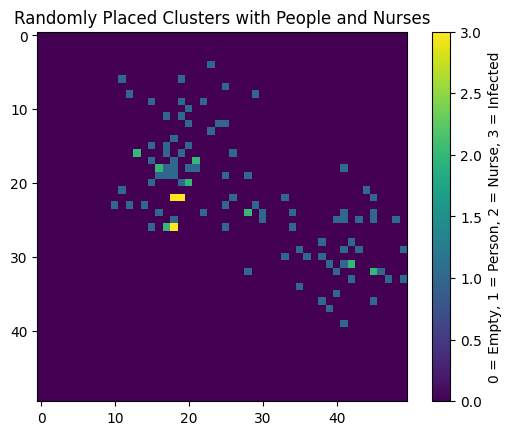

Health decreased
Node health is 5
Adding from [<cls.Disease object at 0x2a5363e80>] [<cls.Disease object at 0x2a5363e80>]
{(20, 20): 1, (17, 21): 3, (26, 17): 3, (18, 16): 4, (16, 13): 6, (24, 28): 8, (31, 42): 21, (32, 45): 23}
21 18 20 20 distance  2.23606797749979
21 19 20 20 distance  1.4142135623730951
21 20 20 20 distance  1.0
22 20 20 20 distance  2.0
23 18 20 20 distance  3.605551275463989
23 19 20 20 distance  3.1622776601683795
23 20 20 20 distance  3.0
Adding from [<cls.Disease object at 0x2a5363e80>] [<cls.Disease object at 0x2a5363e80>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance->0.3333037235664389 | name->d3b0b52c-7316-4e6d-bc6c-09d2b1303352 |  added to 20 19
Adding from [<cls.Disease object at 0x2a5363e80>] [<cls.Disease object at 0x2a5363e80>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance->0.3333037235664389 | name->d3b0b52c-7316-4e6d-bc6c-09d2b1303352 |  added to 20 20
Neighbour 24 28 None
Neighbour 32 

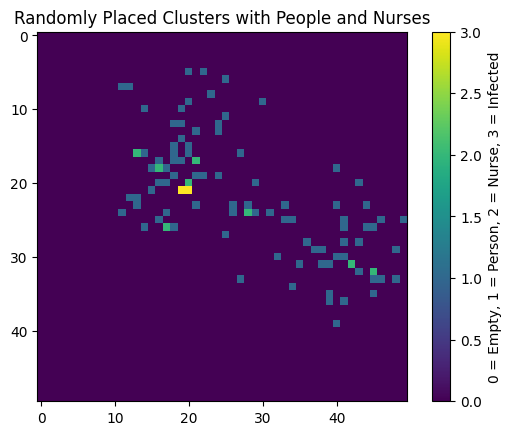

Neighbour 16 13 None
Node health is 5
Adding from [<cls.Disease object at 0x123b31960>] [<cls.Disease object at 0x123b31960>]
Adding from [<cls.Disease object at 0x123b31960>] [<cls.Disease object at 0x123b31960>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance->0.3333037235664389 | name->d3b0b52c-7316-4e6d-bc6c-09d2b1303352 |  added to 20 21
Adding from [<cls.Disease object at 0x123b31960>] [<cls.Disease object at 0x123b31960>]
Health decreased
Node health is 3
Adding from [<cls.Disease object at 0x123b31960>] [<cls.Disease object at 0x123b31960>]
Adding from [<cls.Disease object at 0x123b31960>] [<cls.Disease object at 0x123b31960>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance->0.3333037235664389 | name->d3b0b52c-7316-4e6d-bc6c-09d2b1303352 |  added to 20 20
Adding from [<cls.Disease object at 0x123b31960>] [<cls.Disease object at 0x123b31960>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance-

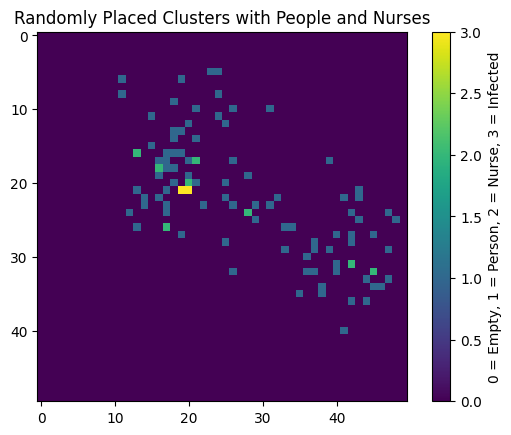

Neighbour 26 17 None
Neighbour 20 20 nurse->False | immunity->0 | natural_resistance->0.19491686078614703 | starting_health->6 | health->3 | diseases->[<cls.Disease object at 0x28d5b8ca0>] | 
Neighbour 18 16 None
Node health is 3
Health decreased
Node health is 4
Adding from [<cls.Disease object at 0x28d5b8ca0>] [<cls.Disease object at 0x28d5b8ca0>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance->0.3333037235664389 | name->d3b0b52c-7316-4e6d-bc6c-09d2b1303352 |  added to 20 20
Adding from [<cls.Disease object at 0x28d5b8ca0>] [<cls.Disease object at 0x28d5b8ca0>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance->0.3333037235664389 | name->d3b0b52c-7316-4e6d-bc6c-09d2b1303352 |  added to 20 21
Adding from [<cls.Disease object at 0x28d5b8ca0>] [<cls.Disease object at 0x28d5b8ca0>]
Neighbour 17 21 None
Neighbour 24 28 None
Neighbour 16 13 None
Neighbour 32 45 None
Neighbour 31 42 None


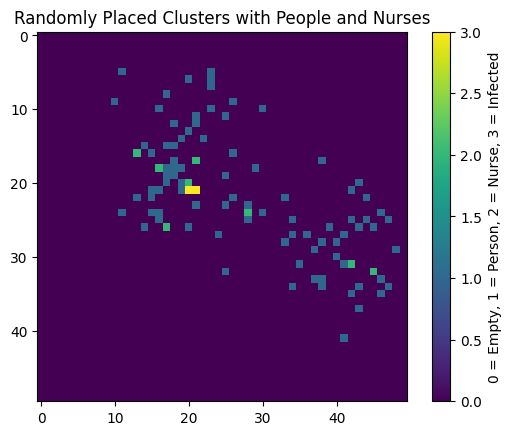

Neighbour 32 45 None
Neighbour 31 42 None
Health decreased
Node health is 4
Adding from [<cls.Disease object at 0x28d8a1d50>] [<cls.Disease object at 0x28d8a1d50>]
infectivity->0.5397095729985536 | mortality->0.8580721585956306 | kill_chance->0.3333037235664389 | name->d3b0b52c-7316-4e6d-bc6c-09d2b1303352 |  added to 20 20
Adding from [<cls.Disease object at 0x28d8a1d50>] [<cls.Disease object at 0x28d8a1d50>]
Neighbour 20 20 nurse->False | immunity->0 | natural_resistance->0.1647748996392337 | starting_health->6 | health->4 | diseases->[<cls.Disease object at 0x28d8a1d50>] | 
Neighbour 18 16 None
Neighbour 17 21 None
Neighbour 16 13 None
Node health is 4
Neighbour 26 17 None
Neighbour 24 28 None


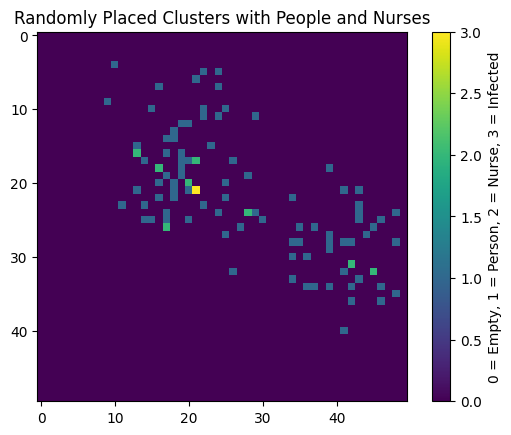

Neighbour 20 20 nurse->False | immunity->0 | natural_resistance->0.08702664603689653 | starting_health->5 | health->4 | diseases->[<cls.Disease object at 0x124558a60>] | 
Neighbour 17 21 None
Neighbour 16 13 None
Neighbour 32 45 None
Neighbour 24 28 None
Neighbour 18 16 None
Node health is 4
Neighbour 26 17 None
Neighbour 31 42 None


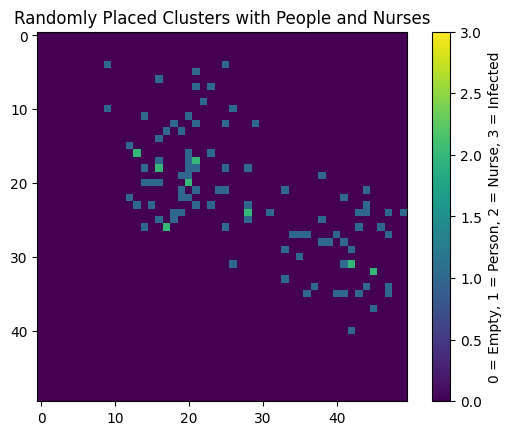

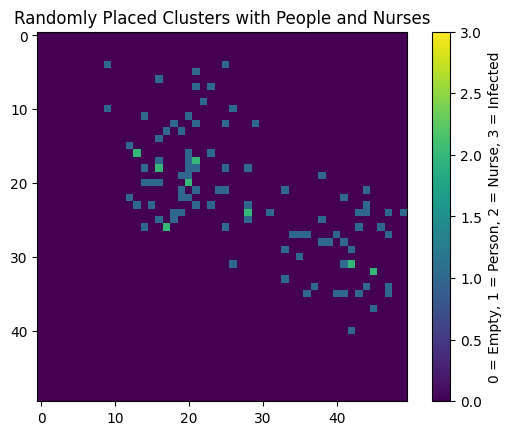

[30, 40]
[25, 19]
hotspots 3 starting neighbours out of 16 possible
Started with 98 people. Ended with 97. 1 people died in 17 iterations.
The following died: [<cls.Person object at 0x299b3bfd0>]
22 healed.
Ended because of: Condition.NO_INFECTED

















Started at:


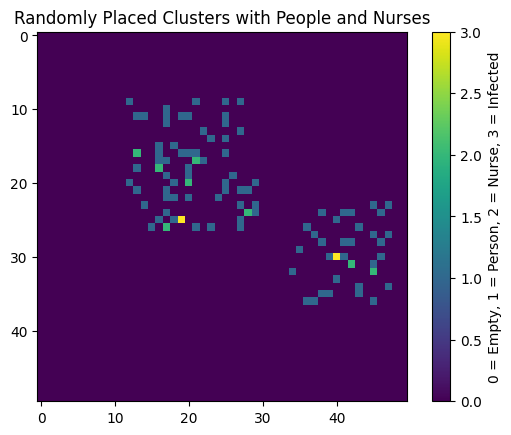

Finished at:


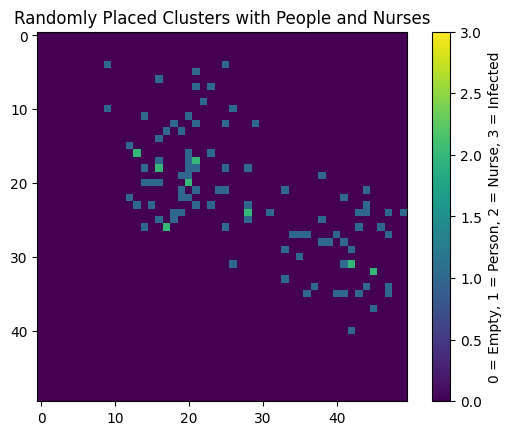

Infected Person Statistics:


,Infected X,Infected Y,Uninfected Count Near,Total Squares Visited,Time Step
0,25,19.0,3.0,23.0,0.0
1,30,40.0,5.0,23.0,0.0
2,26,18.0,0.0,22.0,1.0
3,26,19.0,1.0,22.0,1.0
4,31,40.0,3.0,22.0,1.0


Overall Statistics:


,Time Step,Current Infected,Total Deaths,Total Healed
0,0,2,0,0
1,1,4,0,0
2,2,4,0,2
3,3,4,0,4
4,4,6,0,5


In [ ]:
from cls import *

sim_num += 1

# Create a Simulation object
sim = Simulation(board_size=BOARDSIZE, num_clusters=NUM_CLUSTERS,
                 prob_nurse=PROB_NURSE, prob_person=PROB_PERSON)


# Start the simulation
sim.start()

# View the initial map
sim.view()

# Run the simulation for up to 100 steps and collect statistics
infected_df, overall_df = sim.run_to_end(max_steps=100)

# View the final map after the limited number of steps
sim.view()

# Display the final statistics
#sim.appended_stats()
sim.end()



# Display the infected person statistics as a table
print("Infected Person Statistics:")
display(infected_df.head())  # Show the first few rows

# Display the overall simulation statistics as a table
print("Overall Statistics:")
display(overall_df.head())  # Show the first few rows




In [ ]:
display(infected_df)  # Show the first few rows


display(overall_df)  # Show the first few rows

,Infected X,Infected Y,Uninfected Count Near,Total Squares Visited,Time Step
0,21.0,31.0,6.0,24.0,0.0
1,24.0,23.0,1.0,24.0,0.0
2,24.0,31.0,5.0,24.0,0.0
3,21.0,30.0,3.0,24.0,1.0
4,25.0,24.0,1.0,23.0,1.0
5,25.0,30.0,5.0,24.0,1.0
6,21.0,29.0,3.0,23.0,2.0
7,23.0,28.0,1.0,23.0,2.0
8,26.0,25.0,2.0,22.0,2.0
9,26.0,29.0,4.0,24.0,2.0


,Time Step,Current Infected,Total Deaths,Total Healed
0,0,3,0,0
1,1,3,0,0
2,2,5,0,0
3,3,4,0,1
4,4,3,0,2
5,5,2,0,3
6,6,0,1,4


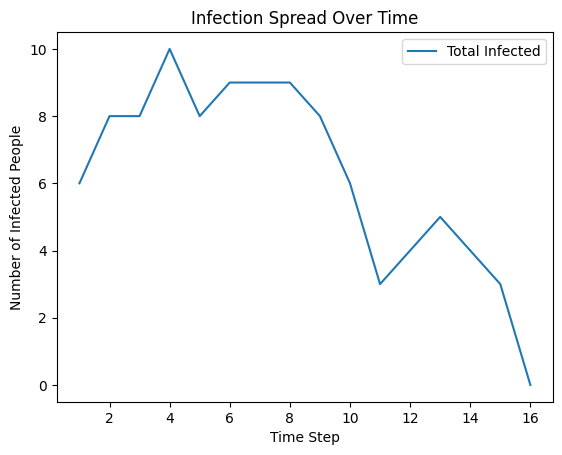

In [ ]:
import matplotlib.pyplot as plt

# Extract the time steps and the number of infected people
time_steps = [stat['time_step'] for stat in overall_stats]
infected_counts = [stat['total_infected'] for stat in overall_stats]

# Plot the data
plt.plot(time_steps, infected_counts, label='Total Infected')
plt.xlabel('Time Step')
plt.ylabel('Number of Infected People')
plt.title('Infection Spread Over Time')
plt.legend()
plt.show()


In [697]:
import importlib
import cls  # Assuming `cls.py` is in the same directory
importlib.reload(cls)
import os
print(os.listdir())  # This should show your current directory and files, including cls.py

['overall_stats.csv', 'run.py', 'Run_Notebook.ipynb', '.DS_Store', 'requirements.txt', 'over_15_7_1.csv', 'inf_01_7_1.csv', 'cls.py', 'over_05_2_2.csv', 'over_05_2_1.csv', '__pycache__', 'README.md', 'map.py', 'inf_15_7_1.csv', '.gitignore', 'Jupyter_added_sim', '.ipynb_checkpoints', 'sim_study_2.Rmd', 'venv', 'CITS4403_simulation_study.Rmd', '.git', 'inf_05_2_1.csv', 'over_01_7_1.csv', 'infected_person_stats.csv', 'inf_05_2_2.csv']


In [698]:
from cls import *

# Define simulation parameters
BOARDSIZE = 80
NUM_CLUSTERS = 5
PROB_NURSE = 0.01
PROB_PERSON = 0.7

sim_num = 0

Infecting 2


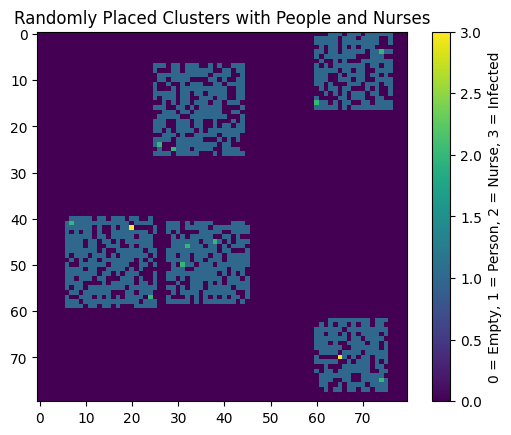

Neighbour 4 74 None
Neighbour 50 31 None
Neighbour 45 38 None
Neighbour 57 24 None
Neighbour 41 7 None
Neighbour 24 26 None
Health decreased
Node health is 3
Adding from [<cls.Disease object at 0x16d568ac0>] [<cls.Disease object at 0x16d568ac0>]
Adding from [<cls.Disease object at 0x16d568ac0>] [<cls.Disease object at 0x16d568ac0>]
{(75, 74): 16, (57, 24): 40, (50, 31): 47, (25, 29): 49, (46, 32): 49, (24, 26): 51, (15, 60): 57, (4, 74): 70, (41, 7): 70}
69 64 75 74 distance  11.661903789690601
69 65 75 74 distance  10.816653826391969
70 66 75 74 distance  9.433981132056603
71 64 75 74 distance  10.770329614269007
71 65 75 74 distance  9.848857801796104
71 66 75 74 distance  8.94427190999916
Adding from [<cls.Disease object at 0x16d568ac0>] [<cls.Disease object at 0x16d568ac0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 71 67
Adding from [<cls.Disease object at 0x16d568ac0>

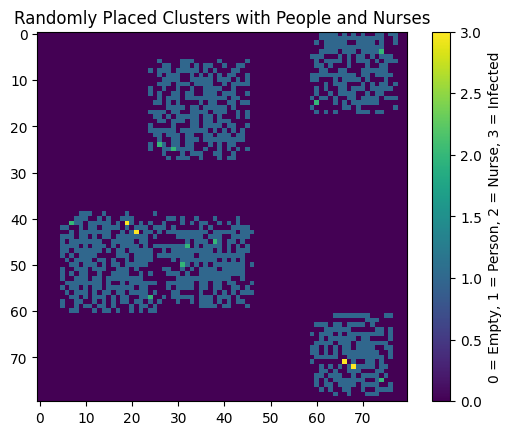

Neighbour 46 32 None
Health decreased
Node health is 5
Adding from [<cls.Disease object at 0x16d600fd0>] [<cls.Disease object at 0x16d600fd0>]
Adding from [<cls.Disease object at 0x16d600fd0>] [<cls.Disease object at 0x16d600fd0>]
Adding from [<cls.Disease object at 0x16d600fd0>] [<cls.Disease object at 0x16d600fd0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 43 20
Adding from [<cls.Disease object at 0x16d600fd0>] [<cls.Disease object at 0x16d600fd0>]
Adding from [<cls.Disease object at 0x16d600fd0>] [<cls.Disease object at 0x16d600fd0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 44 20
Adding from [<cls.Disease object at 0x16d600fd0>] [<cls.Disease object at 0x16d600fd0>]
Adding from [<cls.Disease object at 0x16d600fd0>] [<cls.Disease object at 0x16d600fd0>]
{(4

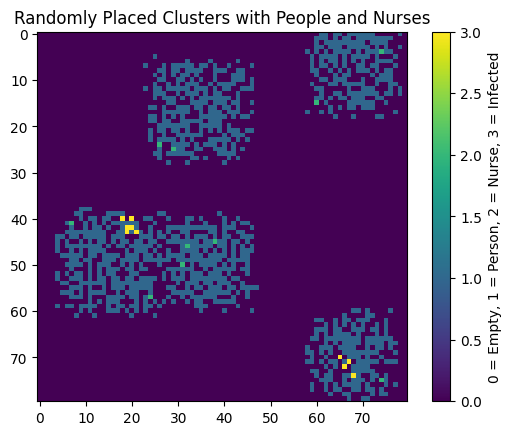

Neighbour 75 74 None
Neighbour 41 7 None
Health decreased
Node health is 5
Adding from [<cls.Disease object at 0x16d879e10>] [<cls.Disease object at 0x16d879e10>]
Adding from [<cls.Disease object at 0x16d879e10>] [<cls.Disease object at 0x16d879e10>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 70 68
Adding from [<cls.Disease object at 0x16d879e10>] [<cls.Disease object at 0x16d879e10>]
Adding from [<cls.Disease object at 0x16d879e10>] [<cls.Disease object at 0x16d879e10>]
Adding from [<cls.Disease object at 0x16d879e10>] [<cls.Disease object at 0x16d879e10>]
{(75, 74): 17, (45, 38): 33, (57, 24): 42, (50, 31): 48, (46, 32): 52, (24, 26): 53, (25, 29): 53, (15, 60): 60, (41, 7): 67, (4, 74): 72}
70 67 75 74 distance  8.602325267042627
71 66 75 74 distance  8.94427190999916
72 67 75 74 distance  7.615773105863909
Adding from [<cls.Disease object at 0x16d879e10>] [<cls.Disease 

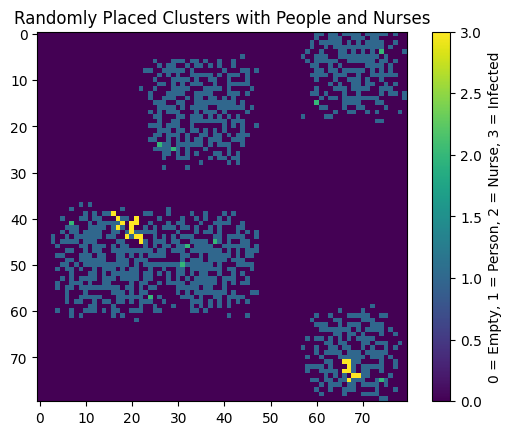

Health decreased
Node health is 4
Adding from [<cls.Disease object at 0x2a4bafa60>] [<cls.Disease object at 0x2a4bafa60>]
Adding from [<cls.Disease object at 0x2a4bafa60>] [<cls.Disease object at 0x2a4bafa60>]
Adding from [<cls.Disease object at 0x2a4bafa60>] [<cls.Disease object at 0x2a4bafa60>]
Adding from [<cls.Disease object at 0x2a4bafa60>] [<cls.Disease object at 0x2a4bafa60>]
Adding from [<cls.Disease object at 0x2a4bafa60>] [<cls.Disease object at 0x2a4bafa60>]
Adding from [<cls.Disease object at 0x2a4bafa60>] [<cls.Disease object at 0x2a4bafa60>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 75 69
{(75, 74): 18, (45, 38): 48, (46, 32): 53, (25, 29): 54, (50, 31): 56, (57, 24): 56, (15, 60): 59, (24, 26): 59, (4, 74): 71, (41, 7): 74}
73 69 75 74 distance  5.385164807134504
74 67 75 74 distance  7.0710678118654755
Adding from [<cls.Disease object at 0x2a4bafa60>] [<cls

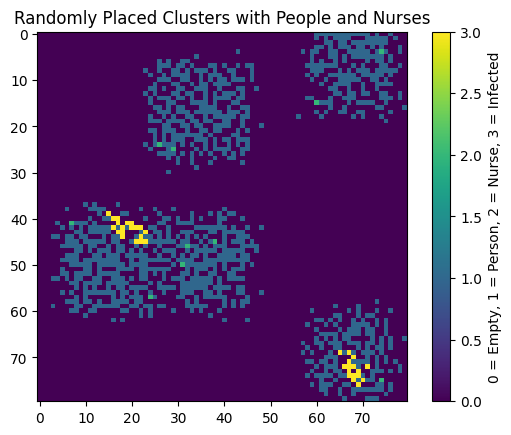

Node health is 4
Adding from [<cls.Disease object at 0x2a49637c0>] [<cls.Disease object at 0x2a49637c0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 74 69
Adding from [<cls.Disease object at 0x2a49637c0>] [<cls.Disease object at 0x2a49637c0>]
Adding from [<cls.Disease object at 0x2a49637c0>] [<cls.Disease object at 0x2a49637c0>]
Adding from [<cls.Disease object at 0x2a49637c0>] [<cls.Disease object at 0x2a49637c0>]
Adding from [<cls.Disease object at 0x2a49637c0>] [<cls.Disease object at 0x2a49637c0>]
{(75, 74): 3, (45, 38): 47, (46, 32): 52, (25, 29): 54, (57, 24): 55, (50, 31): 56, (15, 60): 59, (24, 26): 59, (4, 74): 71, (41, 7): 75}
74 71 75 74 distance  3.1622776601683795
76 70 75 74 distance  4.123105625617661
76 71 75 74 distance  3.1622776601683795
Adding from [<cls.Disease object at 0x2a49637c0>] [<cls.Disease object at 0x2a49637c0>]
Adding from [<cls.Disease object

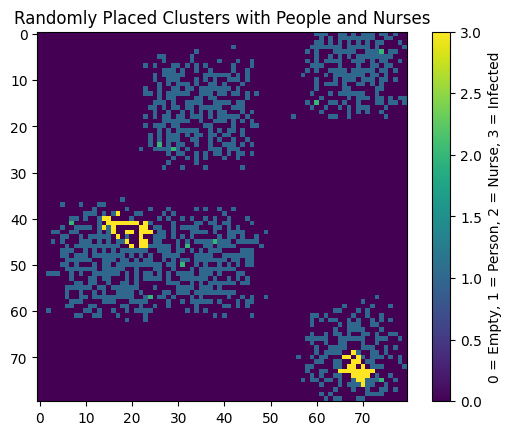

Health decreased
Node health is 5
Adding from [<cls.Disease object at 0x131e4dd80>] [<cls.Disease object at 0x131e4dd80>]
Adding from [<cls.Disease object at 0x131e4dd80>] [<cls.Disease object at 0x131e4dd80>]
Adding from [<cls.Disease object at 0x131e4dd80>] [<cls.Disease object at 0x131e4dd80>]
Adding from [<cls.Disease object at 0x131e4dd80>] [<cls.Disease object at 0x131e4dd80>]
Adding from [<cls.Disease object at 0x131e4dd80>] [<cls.Disease object at 0x131e4dd80>]
{(75, 74): 2, (45, 38): 41, (46, 32): 46, (25, 29): 48, (50, 31): 49, (57, 24): 49, (24, 26): 54, (15, 60): 57, (41, 7): 69, (4, 74): 72}
72 71 75 74 distance  4.242640687119285
73 73 75 74 distance  2.23606797749979
74 72 75 74 distance  2.23606797749979
Adding from [<cls.Disease object at 0x131e4dd80>] [<cls.Disease object at 0x131e4dd80>]
Adding from [<cls.Disease object at 0x131e4dd80>] [<cls.Disease object at 0x131e4dd80>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.245685745111

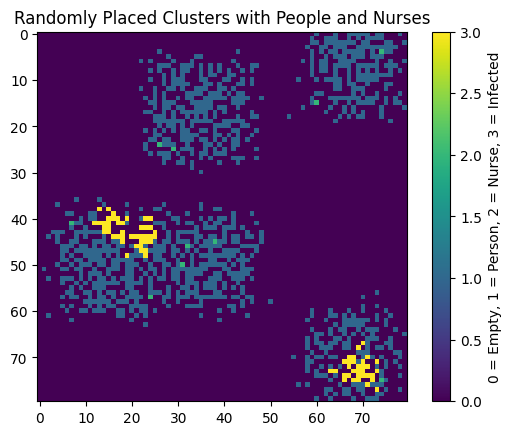

Node health is 6
Adding from [<cls.Disease object at 0x143c75f60>] [<cls.Disease object at 0x143c75f60>]
Adding from [<cls.Disease object at 0x143c75f60>] [<cls.Disease object at 0x143c75f60>]
Adding from [<cls.Disease object at 0x143c75f60>] [<cls.Disease object at 0x143c75f60>]
Adding from [<cls.Disease object at 0x143c75f60>] [<cls.Disease object at 0x143c75f60>]
{(46, 32): 11, (50, 31): 13, (41, 7): 17, (45, 38): 17, (25, 29): 18, (24, 26): 19, (57, 24): 22, (15, 60): 37, (4, 74): 61, (75, 74): 62}
43 21 46 32 distance  11.40175425099138
43 22 46 32 distance  10.44030650891055
43 23 46 32 distance  9.486832980505138
45 21 46 32 distance  11.045361017187261
Adding from [<cls.Disease object at 0x143c75f60>] [<cls.Disease object at 0x143c75f60>]
Adding from [<cls.Disease object at 0x143c75f60>] [<cls.Disease object at 0x143c75f60>]
Adding from [<cls.Disease object at 0x143c75f60>] [<cls.Disease object at 0x143c75f60>]
Adding from [<cls.Disease object at 0x143c75f60>] [<cls.Disease obj

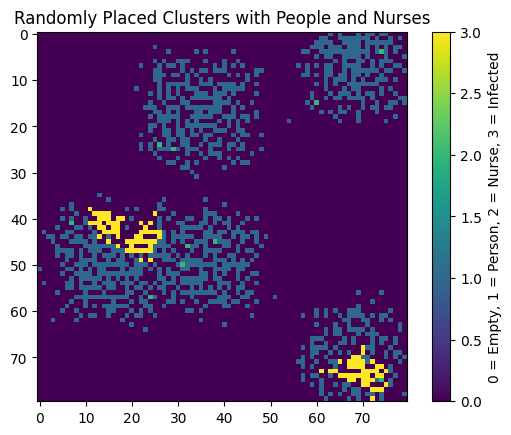

Node health is 5
Adding from [<cls.Disease object at 0x16634cc10>] [<cls.Disease object at 0x16634cc10>]
Adding from [<cls.Disease object at 0x16634cc10>] [<cls.Disease object at 0x16634cc10>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 73 73
Adding from [<cls.Disease object at 0x16634cc10>] [<cls.Disease object at 0x16634cc10>]
{(75, 74): 2, (45, 38): 42, (46, 32): 50, (50, 31): 51, (57, 24): 51, (25, 29): 53, (15, 60): 56, (24, 26): 57, (4, 74): 67, (41, 7): 74}
71 73 75 74 distance  4.123105625617661
71 74 75 74 distance  4.0
71 75 75 74 distance  4.123105625617661
72 75 75 74 distance  3.1622776601683795
73 74 75 74 distance  2.0
Adding from [<cls.Disease object at 0x16634cc10>] [<cls.Disease object at 0x16634cc10>]
Adding from [<cls.Disease object at 0x16634cc10>] [<cls.Disease object at 0x16634cc10>]
Adding from [<cls.Disease object at 0x16634cc10>] [<cls.Disease objec

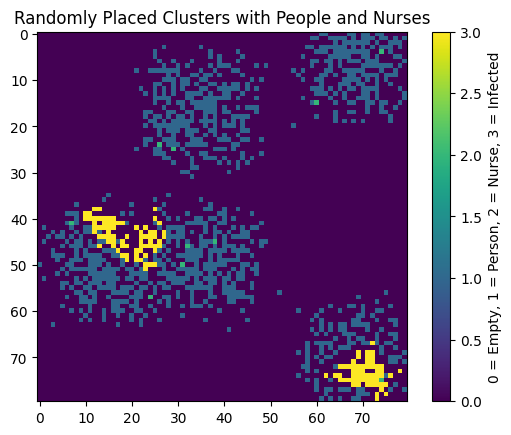

Neighbour 15 60 None
Health decreased
Node health is 3
Adding from [<cls.Disease object at 0x123e8d210>] [<cls.Disease object at 0x123e8d210>]
{(41, 7): 7, (24, 26): 14, (25, 29): 15, (46, 32): 19, (50, 31): 20, (45, 38): 24, (57, 24): 26, (15, 60): 45, (75, 74): 68, (4, 74): 69}
37 12 41 7 distance  6.4031242374328485
37 13 41 7 distance  7.211102550927978
37 14 41 7 distance  8.06225774829855
38 14 41 7 distance  7.615773105863909
39 12 41 7 distance  5.385164807134504
39 13 41 7 distance  6.324555320336759
39 14 41 7 distance  7.280109889280518
Adding from [<cls.Disease object at 0x123e8d210>] [<cls.Disease object at 0x123e8d210>]
Adding from [<cls.Disease object at 0x123e8d210>] [<cls.Disease object at 0x123e8d210>]
Adding from [<cls.Disease object at 0x123e8d210>] [<cls.Disease object at 0x123e8d210>]
Adding from [<cls.Disease object at 0x123e8d210>] [<cls.Disease object at 0x123e8d210>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.245685745111

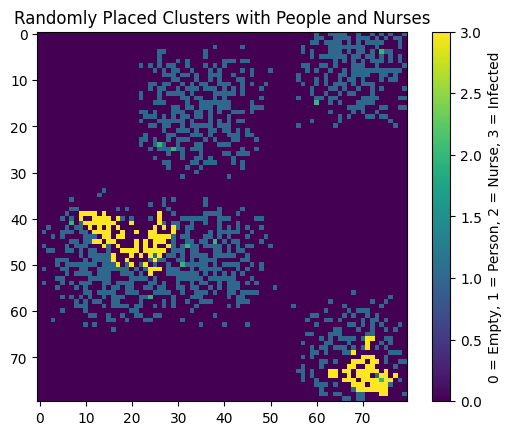

Health decreased
Node health is 2
Adding from [<cls.Disease object at 0x16673a2f0>] [<cls.Disease object at 0x16673a2f0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 70 71
Adding from [<cls.Disease object at 0x16673a2f0>] [<cls.Disease object at 0x16673a2f0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 70 72
Adding from [<cls.Disease object at 0x16673a2f0>] [<cls.Disease object at 0x16673a2f0>]
Adding from [<cls.Disease object at 0x16673a2f0>] [<cls.Disease object at 0x16673a2f0>]
Adding from [<cls.Disease object at 0x16673a2f0>] [<cls.Disease object at 0x16673a2f0>]
{(45, 38): 37, (57, 24): 49, (25, 29): 50, (24, 26): 52, (46, 32): 53, (50, 31): 53, (15, 60): 55, (4, 74): 68, (41, 7): 71}
70 73 45 38 distance  43.01162633521314
71 71 45 38 distance  42.0119030752

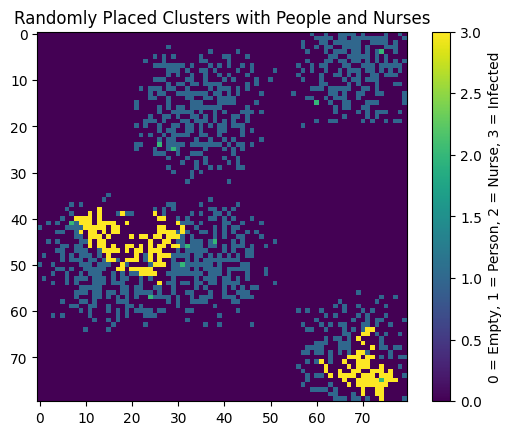

Health decreased
Node health is 3
Adding from [<cls.Disease object at 0x28d6f9600>] [<cls.Disease object at 0x28d6f9600>]
Adding from [<cls.Disease object at 0x28d6f9600>] [<cls.Disease object at 0x28d6f9600>]
Adding from [<cls.Disease object at 0x28d6f9600>] [<cls.Disease object at 0x28d6f9600>]
Adding from [<cls.Disease object at 0x28d6f9600>] [<cls.Disease object at 0x28d6f9600>]
Adding from [<cls.Disease object at 0x28d6f9600>] [<cls.Disease object at 0x28d6f9600>]
Adding from [<cls.Disease object at 0x28d6f9600>] [<cls.Disease object at 0x28d6f9600>]
Adding from [<cls.Disease object at 0x28d6f9600>] [<cls.Disease object at 0x28d6f9600>]
Node health is 4
Adding from [<cls.Disease object at 0x28d6f9600>] [<cls.Disease object at 0x28d6f9600>]
{(45, 38): 33, (46, 32): 40, (25, 29): 44, (24, 26): 46, (57, 24): 47, (15, 60): 51, (4, 74): 62, (41, 7): 65}
66 70 45 38 distance  38.27531841800928
66 71 45 38 distance  39.11521443121589
67 69 45 38 distance  38.01315561749642
67 71 45 38 di

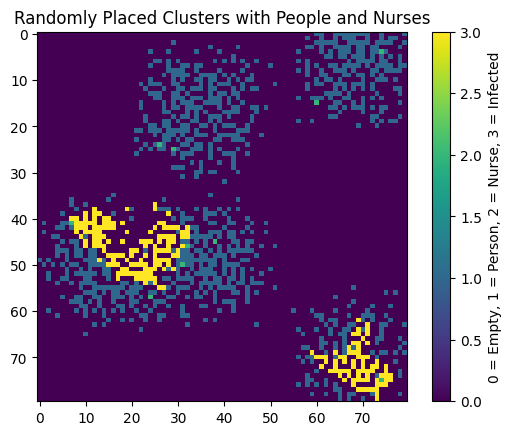

Node health is 4
Adding from [<cls.Disease object at 0x299b3a110>] [<cls.Disease object at 0x299b3a110>]
Adding from [<cls.Disease object at 0x299b3a110>] [<cls.Disease object at 0x299b3a110>]
Adding from [<cls.Disease object at 0x299b3a110>] [<cls.Disease object at 0x299b3a110>]
{(57, 24): 2, (50, 31): 10, (45, 38): 29, (41, 7): 32, (46, 32): 34, (25, 29): 43, (24, 26): 44, (15, 60): 57, (4, 74): 68}
54 26 57 24 distance  3.605551275463989
54 27 57 24 distance  4.242640687119285
54 28 57 24 distance  5.0
56 26 57 24 distance  2.23606797749979
56 28 57 24 distance  4.123105625617661
Adding from [<cls.Disease object at 0x299b3a110>] [<cls.Disease object at 0x299b3a110>]
Adding from [<cls.Disease object at 0x299b3a110>] [<cls.Disease object at 0x299b3a110>]
Adding from [<cls.Disease object at 0x299b3a110>] [<cls.Disease object at 0x299b3a110>]
Health decreased
Node health is 6
Adding from [<cls.Disease object at 0x299b3a110>] [<cls.Disease object at 0x299b3a110>]
Adding from [<cls.Diseas

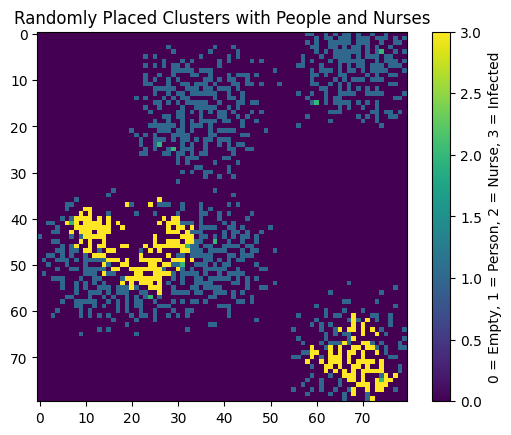

Node health is 1
Adding from [<cls.Disease object at 0x2a53cbca0>] [<cls.Disease object at 0x2a53cbca0>]
Adding from [<cls.Disease object at 0x2a53cbca0>] [<cls.Disease object at 0x2a53cbca0>]
Adding from [<cls.Disease object at 0x2a53cbca0>] [<cls.Disease object at 0x2a53cbca0>]
{(75, 74): 24, (45, 38): 35, (57, 24): 39, (25, 29): 51, (24, 26): 52, (46, 32): 55, (15, 60): 58, (41, 7): 68, (4, 74): 69}
72 64 75 74 distance  10.44030650891055
73 63 75 74 distance  11.180339887498949
73 65 75 74 distance  9.219544457292887
74 64 75 74 distance  10.04987562112089
74 65 75 74 distance  9.055385138137417
Adding from [<cls.Disease object at 0x2a53cbca0>] [<cls.Disease object at 0x2a53cbca0>]
Adding from [<cls.Disease object at 0x2a53cbca0>] [<cls.Disease object at 0x2a53cbca0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 74 66
Adding from [<cls.Disease object at 0x2a53cbca0>] [<cl

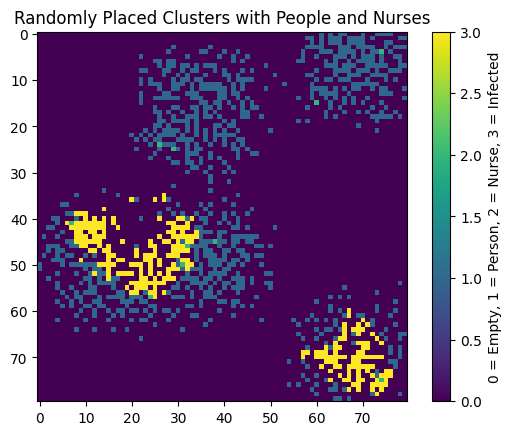

Node health is 1
Adding from [<cls.Disease object at 0x160258ac0>] [<cls.Disease object at 0x160258ac0>]
Adding from [<cls.Disease object at 0x160258ac0>] [<cls.Disease object at 0x160258ac0>]
Adding from [<cls.Disease object at 0x160258ac0>] [<cls.Disease object at 0x160258ac0>]
Adding from [<cls.Disease object at 0x160258ac0>] [<cls.Disease object at 0x160258ac0>]
Adding from [<cls.Disease object at 0x160258ac0>] [<cls.Disease object at 0x160258ac0>]
Adding from [<cls.Disease object at 0x160258ac0>] [<cls.Disease object at 0x160258ac0>]
{(45, 38): 8, (25, 29): 18, (24, 26): 19, (15, 60): 30, (41, 7): 34, (57, 24): 34, (4, 74): 50}
43 30 45 38 distance  8.246211251235321
43 32 45 38 distance  6.324555320336759
Adding from [<cls.Disease object at 0x160258ac0>] [<cls.Disease object at 0x160258ac0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 42 31
Adding from [<cls.Disease ob

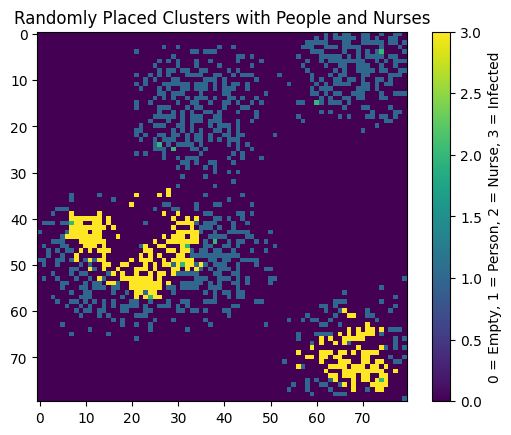

Node health is 1
Adding from [<cls.Disease object at 0x28d6c53c0>] [<cls.Disease object at 0x28d6c53c0>]
Adding from [<cls.Disease object at 0x28d6c53c0>] [<cls.Disease object at 0x28d6c53c0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 74 75
Adding from [<cls.Disease object at 0x28d6c53c0>] [<cls.Disease object at 0x28d6c53c0>]
Adding from [<cls.Disease object at 0x28d6c53c0>] [<cls.Disease object at 0x28d6c53c0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 76 74
Adding from [<cls.Disease object at 0x28d6c53c0>] [<cls.Disease object at 0x28d6c53c0>]
Health decreased
Node health is 2
Adding from [<cls.Disease object at 0x16d3f7eb0>] [<cls.Disease object at 0x16d3f7eb0>]
Adding from [<cls.Disease object at 0x16d3f7eb0>] [<cls.Disease object at 0x16d3f7eb0>]
Adding 

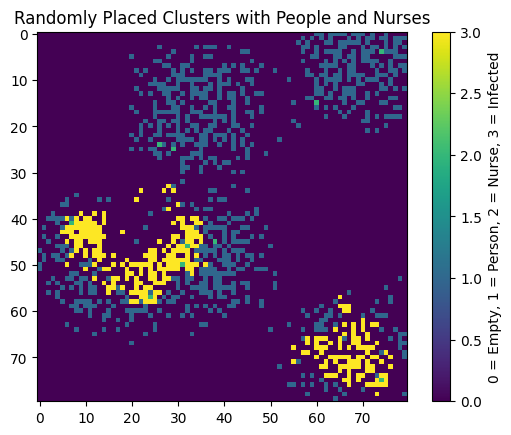

Health decreased
Node health is 4
Adding from [<cls.Disease object at 0x2a53ca620>] [<cls.Disease object at 0x2a53ca620>]
Adding from [<cls.Disease object at 0x2a53ca620>] [<cls.Disease object at 0x2a53ca620>]
Adding from [<cls.Disease object at 0x2a53ca620>] [<cls.Disease object at 0x2a53ca620>]
Adding from [<cls.Disease object at 0x2a53ca620>] [<cls.Disease object at 0x2a53ca620>]
Adding from [<cls.Disease object at 0x2a53ca620>] [<cls.Disease object at 0x2a53ca620>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 46 36
{(45, 38): 2, (25, 29): 19, (50, 31): 19, (24, 26): 20, (15, 60): 29, (41, 7): 43, (4, 74): 46}
44 36 45 38 distance  2.23606797749979
45 34 45 38 distance  4.0
45 36 45 38 distance  2.0
Adding from [<cls.Disease object at 0x2a53ca620>] [<cls.Disease object at 0x2a53ca620>]
Adding from [<cls.Disease object at 0x2a53ca620>] [<cls.Disease object at 0x2a53ca620>]


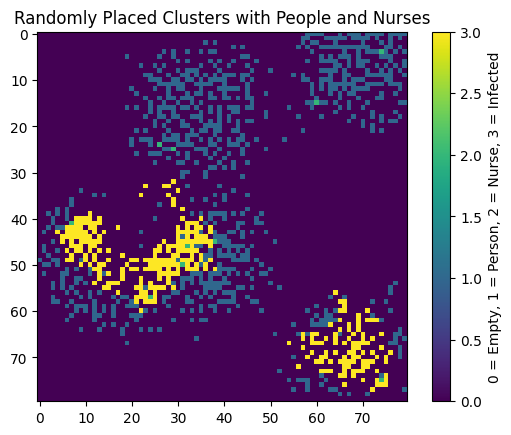

Node health is 1
Adding from [<cls.Disease object at 0x16634e080>] [<cls.Disease object at 0x16634e080>]
Adding from [<cls.Disease object at 0x16634e080>] [<cls.Disease object at 0x16634e080>]
Adding from [<cls.Disease object at 0x16634e080>] [<cls.Disease object at 0x16634e080>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 44 5
Adding from [<cls.Disease object at 0x16634e080>] [<cls.Disease object at 0x16634e080>]
Adding from [<cls.Disease object at 0x16634e080>] [<cls.Disease object at 0x16634e080>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 45 5
Adding from [<cls.Disease object at 0x16634e080>] [<cls.Disease object at 0x16634e080>]
{(41, 7): 7, (24, 26): 26, (25, 29): 28, (50, 31): 33, (45, 38): 34, (15, 60): 55, (4, 74): 70, (75, 74): 70}
43 5 41 7 distance  2

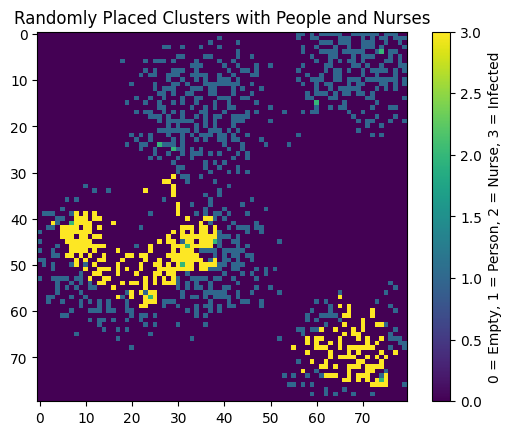

Node health is 1
Adding from [<cls.Disease object at 0x2a4156d40>] [<cls.Disease object at 0x2a4156d40>]
Adding from [<cls.Disease object at 0x2a4156d40>] [<cls.Disease object at 0x2a4156d40>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 39 10
Adding from [<cls.Disease object at 0x2a4156d40>] [<cls.Disease object at 0x2a4156d40>]
Adding from [<cls.Disease object at 0x2a4156d40>] [<cls.Disease object at 0x2a4156d40>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 40 10
Adding from [<cls.Disease object at 0x2a4156d40>] [<cls.Disease object at 0x2a4156d40>]
Adding from [<cls.Disease object at 0x2a4156d40>] [<cls.Disease object at 0x2a4156d40>]
Adding from [<cls.Disease object at 0x2a4156d40>] [<cls.Disease object at 0x2a4156d40>]
{(41, 7): 5, (24, 26): 17, (25, 29): 19, 

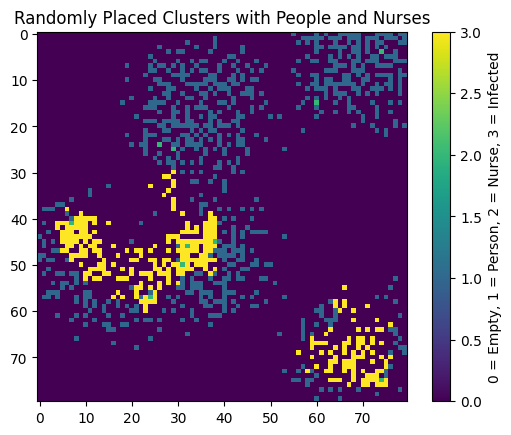

Node health is 2
Adding from [<cls.Disease object at 0x28d33c970>] [<cls.Disease object at 0x28d33c970>]
Adding from [<cls.Disease object at 0x28d33c970>] [<cls.Disease object at 0x28d33c970>]
{(45, 38): 39, (57, 24): 42, (25, 29): 50, (24, 26): 52, (41, 7): 58, (15, 60): 59, (4, 74): 71}
74 63 45 38 distance  38.28837943815329
74 64 45 38 distance  38.948684188300895
74 65 45 38 distance  39.6232255123179
76 63 45 38 distance  39.824615503479755
76 64 45 38 distance  40.45985664828782
76 65 45 38 distance  41.10960958218893
Adding from [<cls.Disease object at 0x28d33c970>] [<cls.Disease object at 0x28d33c970>]
Adding from [<cls.Disease object at 0x28d33c970>] [<cls.Disease object at 0x28d33c970>]
Adding from [<cls.Disease object at 0x28d33c970>] [<cls.Disease object at 0x28d33c970>]
Node health is 2
Adding from [<cls.Disease object at 0x28d33c970>] [<cls.Disease object at 0x28d33c970>]
Adding from [<cls.Disease object at 0x28d33c970>] [<cls.Disease object at 0x28d33c970>]
Adding from 

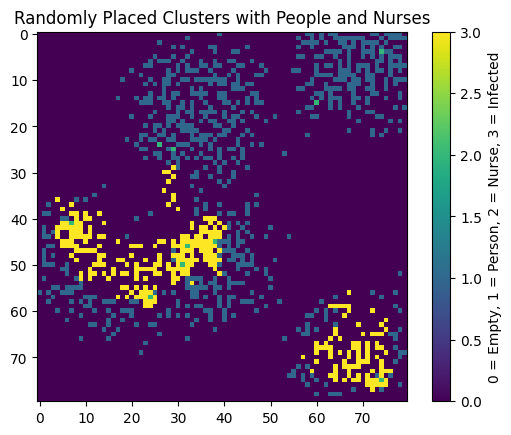

Health decreased
Node health is 3
Adding from [<cls.Disease object at 0x28d5b8be0>] [<cls.Disease object at 0x28d5b8be0>]
Adding from [<cls.Disease object at 0x28d5b8be0>] [<cls.Disease object at 0x28d5b8be0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 48 37
Adding from [<cls.Disease object at 0x28d5b8be0>] [<cls.Disease object at 0x28d5b8be0>]
Adding from [<cls.Disease object at 0x28d5b8be0>] [<cls.Disease object at 0x28d5b8be0>]
Adding from [<cls.Disease object at 0x28d5b8be0>] [<cls.Disease object at 0x28d5b8be0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 49 38
Adding from [<cls.Disease object at 0x28d5b8be0>] [<cls.Disease object at 0x28d5b8be0>]
Adding from [<cls.Disease object at 0x28d5b8be0>] [<cls.Disease object at 0x28d5b8be0>]
{(25, 29): 37, (24, 26):

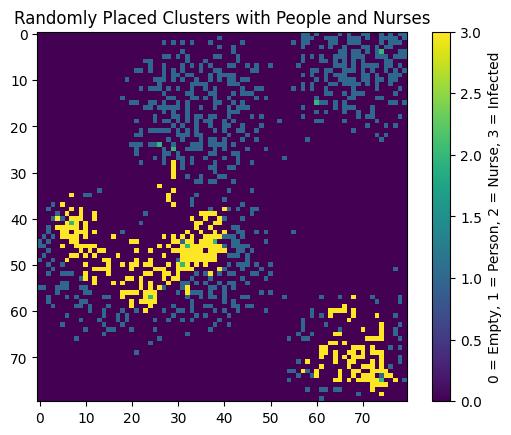

Node health is 1
Adding from [<cls.Disease object at 0x28d72c430>] [<cls.Disease object at 0x28d72c430>]
Adding from [<cls.Disease object at 0x28d72c430>] [<cls.Disease object at 0x28d72c430>]
Adding from [<cls.Disease object at 0x28d72c430>] [<cls.Disease object at 0x28d72c430>]
Adding from [<cls.Disease object at 0x28d72c430>] [<cls.Disease object at 0x28d72c430>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 53 29
{(45, 38): 17, (41, 7): 23, (25, 29): 26, (24, 26): 27, (15, 60): 39, (75, 74): 50, (4, 74): 58}
51 28 45 38 distance  11.661903789690601
51 29 45 38 distance  10.816653826391969
52 29 45 38 distance  11.40175425099138
53 28 45 38 distance  12.806248474865697
Adding from [<cls.Disease object at 0x28d72c430>] [<cls.Disease object at 0x28d72c430>]
Adding from [<cls.Disease object at 0x28d72c430>] [<cls.Disease object at 0x28d72c430>]
Adding from [<cls.Disease object

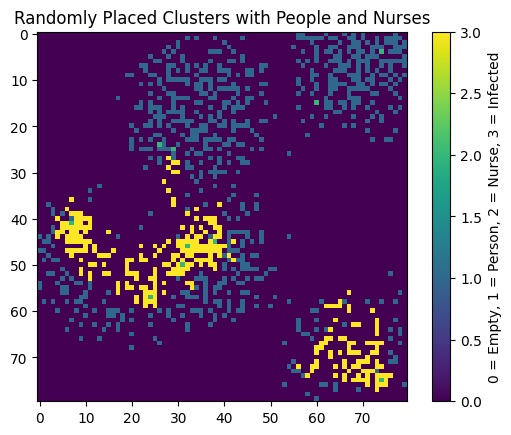

Node health is 2
Adding from [<cls.Disease object at 0x143ca43d0>] [<cls.Disease object at 0x143ca43d0>]
Adding from [<cls.Disease object at 0x143ca43d0>] [<cls.Disease object at 0x143ca43d0>]
{(25, 29): 3, (24, 26): 4, (45, 38): 17, (50, 31): 20, (41, 7): 23, (15, 60): 31, (4, 74): 51}
28 27 25 29 distance  3.605551275463989
28 28 25 29 distance  3.1622776601683795
29 27 25 29 distance  4.47213595499958
29 29 25 29 distance  4.0
30 27 25 29 distance  5.385164807134504
30 28 25 29 distance  5.0990195135927845
Adding from [<cls.Disease object at 0x143ca43d0>] [<cls.Disease object at 0x143ca43d0>]
Adding from [<cls.Disease object at 0x143ca43d0>] [<cls.Disease object at 0x143ca43d0>]
Adding from [<cls.Disease object at 0x143ca43d0>] [<cls.Disease object at 0x143ca43d0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 28 29
Node health is 1
Adding from [<cls.Disease object at 0x143

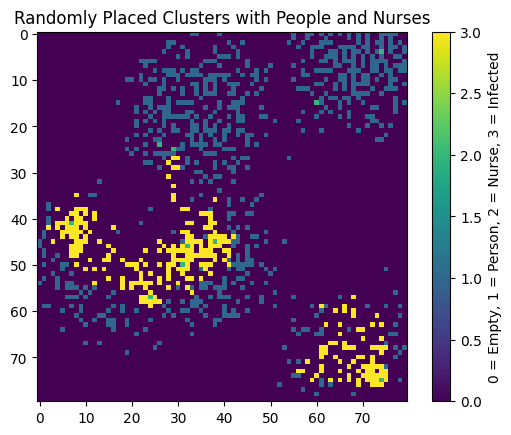

Health decreased
Node health is 2
{(75, 74): 13, (25, 29): 44, (24, 26): 46, (50, 31): 46, (15, 60): 47, (57, 24): 49, (4, 74): 58, (41, 7): 67}
62 73 75 74 distance  13.038404810405298
62 74 75 74 distance  13.0
62 75 75 74 distance  13.038404810405298
63 73 75 74 distance  12.041594578792296
63 75 75 74 distance  12.041594578792296
64 73 75 74 distance  11.045361017187261
64 74 75 74 distance  11.0
64 75 75 74 distance  11.045361017187261
Node health is 1
Adding from [<cls.Disease object at 0x2a5472260>] [<cls.Disease object at 0x2a5472260>]
Adding from [<cls.Disease object at 0x2a5472260>] [<cls.Disease object at 0x2a5472260>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 38 10
Adding from [<cls.Disease object at 0x2a5472260>] [<cls.Disease object at 0x2a5472260>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601

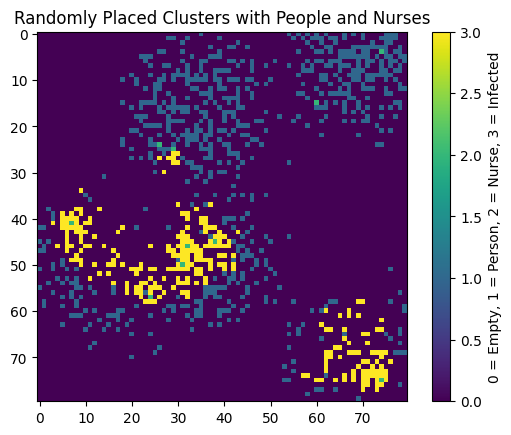

Health decreased
Node health is 3
Adding from [<cls.Disease object at 0x2a5812950>] [<cls.Disease object at 0x2a5812950>]
Adding from [<cls.Disease object at 0x2a5812950>] [<cls.Disease object at 0x2a5812950>]
{(57, 24): 7, (25, 29): 32, (24, 26): 33, (15, 60): 43, (75, 74): 43, (4, 74): 54}
56 33 57 24 distance  9.055385138137417
57 31 57 24 distance  7.0
57 33 57 24 distance  9.0
58 31 57 24 distance  7.0710678118654755
58 32 57 24 distance  8.06225774829855
58 33 57 24 distance  9.055385138137417
Adding from [<cls.Disease object at 0x2a5812950>] [<cls.Disease object at 0x2a5812950>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 56 31
Adding from [<cls.Disease object at 0x2a5812950>] [<cls.Disease object at 0x2a5812950>]
Adding from [<cls.Disease object at 0x2a5812950>] [<cls.Disease object at 0x2a5812950>]
Node health is 0
Node died
Health decreased
Node health is 2
{(57, 2

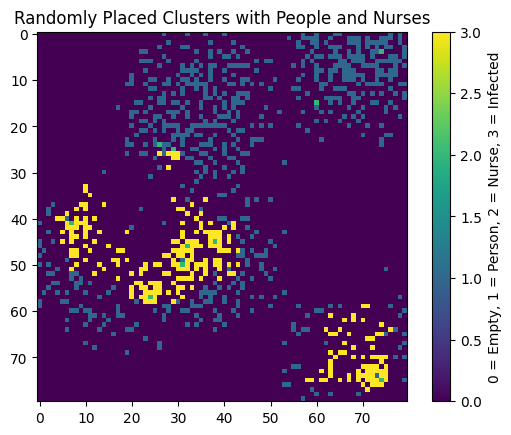

Node health is 1
{(41, 7): 5, (24, 26): 15, (25, 29): 18, (50, 31): 18, (46, 32): 19, (15, 60): 47, (75, 74): 63, (4, 74): 65}
39 11 41 7 distance  4.47213595499958
39 12 41 7 distance  5.385164807134504
39 13 41 7 distance  6.324555320336759
40 11 41 7 distance  4.123105625617661
40 13 41 7 distance  6.082762530298219
41 11 41 7 distance  4.0
41 12 41 7 distance  5.0
41 13 41 7 distance  6.0
Adding from [<cls.Disease object at 0x2a4bc4b80>] [<cls.Disease object at 0x2a4bc4b80>]
Adding from [<cls.Disease object at 0x2a4bc4b80>] [<cls.Disease object at 0x2a4bc4b80>]
Adding from [<cls.Disease object at 0x2a4bc4b80>] [<cls.Disease object at 0x2a4bc4b80>]
Adding from [<cls.Disease object at 0x2a4bc4b80>] [<cls.Disease object at 0x2a4bc4b80>]
Node health is 1
Adding from [<cls.Disease object at 0x2a4bc4b80>] [<cls.Disease object at 0x2a4bc4b80>]
Adding from [<cls.Disease object at 0x2a4bc4b80>] [<cls.Disease object at 0x2a4bc4b80>]
Adding from [<cls.Disease object at 0x2a4bc4b80>] [<cls.Dis

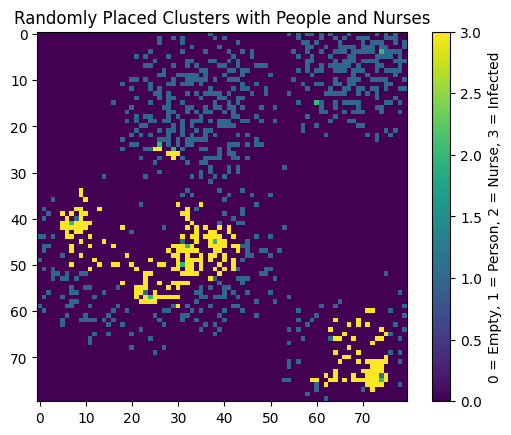

Node health is 1
Adding from [<cls.Disease object at 0x299eec760>] [<cls.Disease object at 0x299eec760>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 52 10
{(41, 7): 14, (57, 24): 18, (50, 31): 20, (46, 32): 22, (24, 26): 26, (25, 29): 26, (15, 60): 48, (4, 74): 62, (75, 74): 64}
50 10 41 7 distance  9.486832980505138
50 11 41 7 distance  9.848857801796104
50 12 41 7 distance  10.295630140987
51 10 41 7 distance  10.44030650891055
51 12 41 7 distance  11.180339887498949
52 11 41 7 distance  11.704699910719626
52 12 41 7 distance  12.083045973594572
Node health is 1
Adding from [<cls.Disease object at 0x299eec760>] [<cls.Disease object at 0x299eec760>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 41 33
{(46, 32): 3, (50, 31): 12, (57, 24): 14, (24, 26): 17, (25, 29):

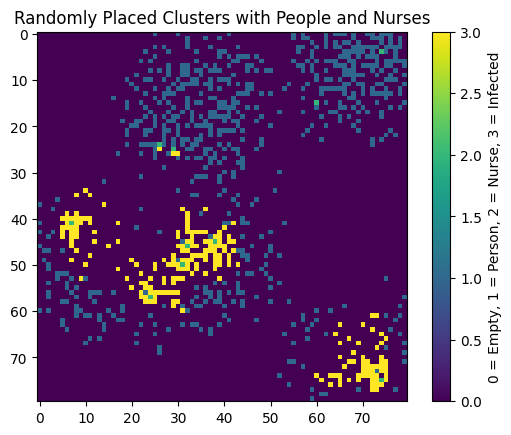

Node health is 1
Adding from [<cls.Disease object at 0x160571660>] [<cls.Disease object at 0x160571660>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 42 7
Adding from [<cls.Disease object at 0x160571660>] [<cls.Disease object at 0x160571660>]
Adding from [<cls.Disease object at 0x160571660>] [<cls.Disease object at 0x160571660>]
Adding from [<cls.Disease object at 0x160571660>] [<cls.Disease object at 0x160571660>]
Adding from [<cls.Disease object at 0x160571660>] [<cls.Disease object at 0x160571660>]
{(24, 26): 21, (25, 29): 21, (46, 32): 25, (15, 60): 51, (4, 74): 67, (75, 74): 67}
42 9 24 26 distance  24.758836806279895
43 9 24 26 distance  25.495097567963924
44 9 24 26 distance  26.248809496813376
Adding from [<cls.Disease object at 0x160571660>] [<cls.Disease object at 0x160571660>]
Adding from [<cls.Disease object at 0x160571660>] [<cls.Disease object at 0x160571660>]
A

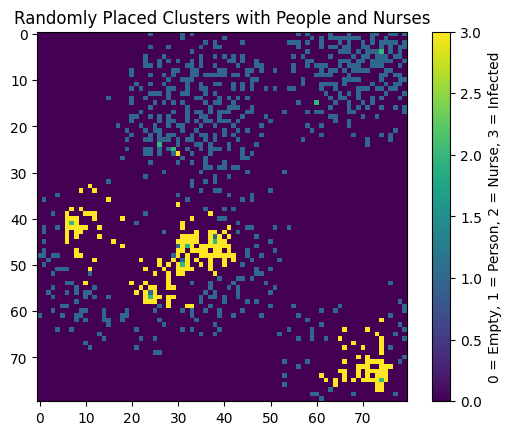

Node health is 0
Node died
Node health is 1
Adding from [<cls.Disease object at 0x28d371120>] [<cls.Disease object at 0x28d371120>]
Adding from [<cls.Disease object at 0x28d371120>] [<cls.Disease object at 0x28d371120>]
Adding from [<cls.Disease object at 0x28d371120>] [<cls.Disease object at 0x28d371120>]
Adding from [<cls.Disease object at 0x28d371120>] [<cls.Disease object at 0x28d371120>]
Adding from [<cls.Disease object at 0x28d371120>] [<cls.Disease object at 0x28d371120>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 49 34
{(46, 32): 3, (50, 31): 5, (25, 29): 30, (24, 26): 31, (15, 60): 42, (75, 74): 43, (4, 74): 55}
48 34 46 32 distance  2.8284271247461903
49 35 46 32 distance  4.242640687119285
49 36 46 32 distance  5.0
Adding from [<cls.Disease object at 0x28d371120>] [<cls.Disease object at 0x28d371120>]
Adding from [<cls.Disease object at 0x28d371120>] [<cls.Diseas

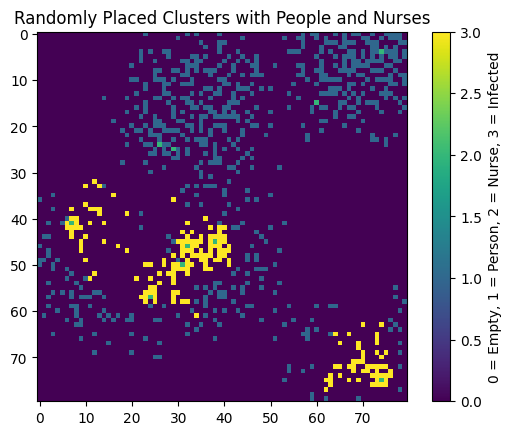

Node health is 3
{(50, 31): 12, (25, 29): 13, (24, 26): 14, (57, 24): 21, (15, 60): 40, (4, 74): 57}
38 18 50 31 distance  17.69180601295413
38 19 50 31 distance  16.97056274847714
38 20 50 31 distance  16.278820596099706
39 18 50 31 distance  17.029386365926403
39 20 50 31 distance  15.556349186104045
40 18 50 31 distance  16.401219466856727
40 19 50 31 distance  15.620499351813308
40 20 50 31 distance  14.866068747318506
Node health is 1
Adding from [<cls.Disease object at 0x160926170>] [<cls.Disease object at 0x160926170>]
Adding from [<cls.Disease object at 0x160926170>] [<cls.Disease object at 0x160926170>]
Adding from [<cls.Disease object at 0x160926170>] [<cls.Disease object at 0x160926170>]
Node health is 1
Adding from [<cls.Disease object at 0x16d878d30>] [<cls.Disease object at 0x16d878d30>]
Adding from [<cls.Disease object at 0x16d878d30>] [<cls.Disease object at 0x16d878d30>]
{(50, 31): 42, (25, 29): 45, (24, 26): 48, (57, 24): 49, (15, 60): 50, (4, 74): 61}
65 72 50 31 dis

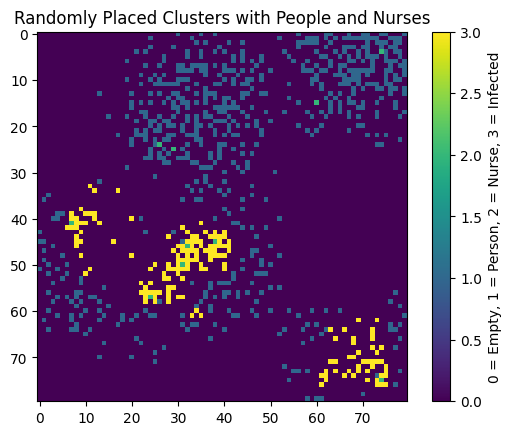

Health decreased
Node health is 1
Adding from [<cls.Disease object at 0x131571450>] [<cls.Disease object at 0x131571450>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 44 38
Adding from [<cls.Disease object at 0x131571450>] [<cls.Disease object at 0x131571450>]
Adding from [<cls.Disease object at 0x131571450>] [<cls.Disease object at 0x131571450>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 44 40
Adding from [<cls.Disease object at 0x131571450>] [<cls.Disease object at 0x131571450>]
Adding from [<cls.Disease object at 0x131571450>] [<cls.Disease object at 0x131571450>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 46 38
Adding from [<cls.Disease object at 0

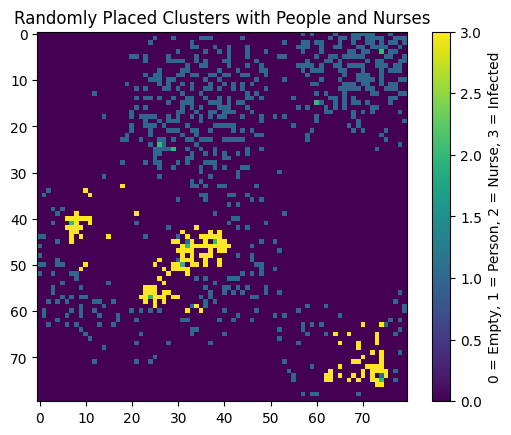

Node health is 1
Adding from [<cls.Disease object at 0x143d20490>] [<cls.Disease object at 0x143d20490>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 75 72
Adding from [<cls.Disease object at 0x143d20490>] [<cls.Disease object at 0x143d20490>]
Adding from [<cls.Disease object at 0x143d20490>] [<cls.Disease object at 0x143d20490>]
Adding from [<cls.Disease object at 0x143d20490>] [<cls.Disease object at 0x143d20490>]
Node health is 1
Adding from [<cls.Disease object at 0x131b6e8f0>] [<cls.Disease object at 0x131b6e8f0>]
Adding from [<cls.Disease object at 0x131b6e8f0>] [<cls.Disease object at 0x131b6e8f0>]
Adding from [<cls.Disease object at 0x131b6e8f0>] [<cls.Disease object at 0x131b6e8f0>]
{(46, 32): 7, (50, 31): 16, (25, 29): 17, (24, 26): 18, (57, 24): 22, (15, 60): 27, (41, 7): 33, (75, 74): 40, (4, 74): 43}
42 36 46 32 distance  5.656854249492381
42 37 46 32 distance  6

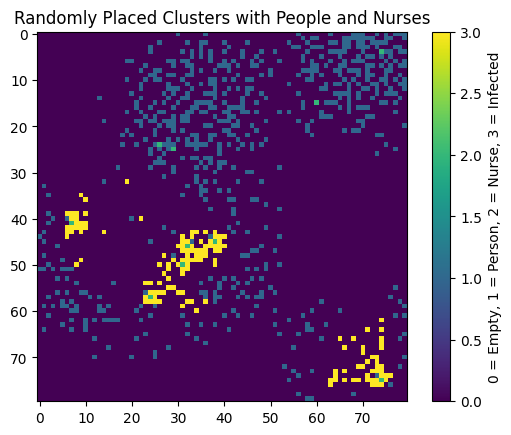

Node health is 1
Adding from [<cls.Disease object at 0x2a47809d0>] [<cls.Disease object at 0x2a47809d0>]
Adding from [<cls.Disease object at 0x2a47809d0>] [<cls.Disease object at 0x2a47809d0>]
Adding from [<cls.Disease object at 0x2a47809d0>] [<cls.Disease object at 0x2a47809d0>]
Adding from [<cls.Disease object at 0x2a47809d0>] [<cls.Disease object at 0x2a47809d0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 47 31
Adding from [<cls.Disease object at 0x2a47809d0>] [<cls.Disease object at 0x2a47809d0>]
Adding from [<cls.Disease object at 0x2a47809d0>] [<cls.Disease object at 0x2a47809d0>]
Node health is 1
Adding from [<cls.Disease object at 0x2a47809d0>] [<cls.Disease object at 0x2a47809d0>]
Adding from [<cls.Disease object at 0x2a47809d0>] [<cls.Disease object at 0x2a47809d0>]
Adding from [<cls.Disease object at 0x2a47809d0>] [<cls.Disease object at 0x2a47809d0>]
Adding from

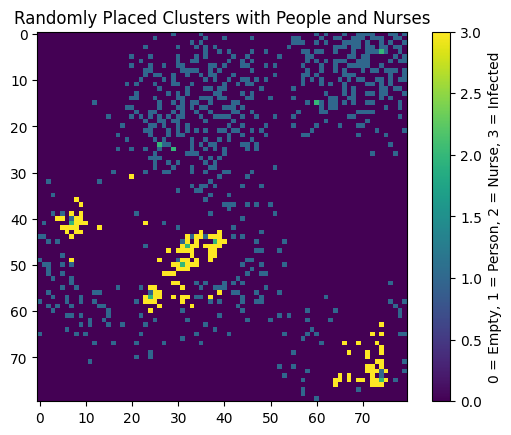

Neighbour 45 38 nurse->False | immunity->0 | natural_resistance->0.06970735566272238 | starting_health->5 | health->1 | diseases->[<cls.Disease object at 0x12411c9a0>] | 
Node health is 1
Adding from [<cls.Disease object at 0x2a469cf10>] [<cls.Disease object at 0x2a469cf10>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 72 72
Adding from [<cls.Disease object at 0x2a469cf10>] [<cls.Disease object at 0x2a469cf10>]
Adding from [<cls.Disease object at 0x2a469cf10>] [<cls.Disease object at 0x2a469cf10>]
{(75, 74): 7, (45, 38): 40, (25, 29): 47, (24, 26): 48, (57, 24): 49, (15, 60): 56, (41, 7): 66, (4, 74): 67}
71 70 75 74 distance  5.656854249492381
71 71 75 74 distance  5.0
71 72 75 74 distance  4.47213595499958
72 70 75 74 distance  5.0
73 70 75 74 distance  4.47213595499958
Adding from [<cls.Disease object at 0x2a469cf10>] [<cls.Disease object at 0x2a469cf10>]
Adding from [<cls

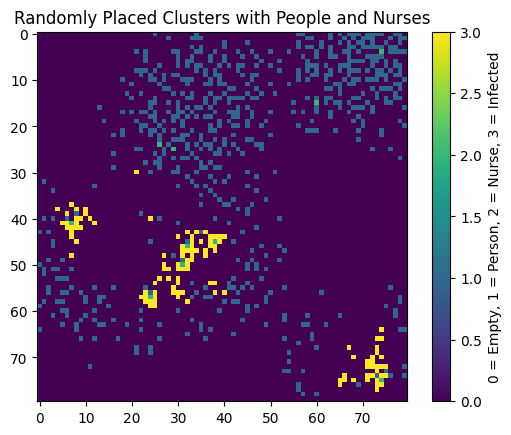

Node health is 5
Adding from [<cls.Disease object at 0x2a3a6ecb0>] [<cls.Disease object at 0x2a3a6ecb0>]
Adding from [<cls.Disease object at 0x2a3a6ecb0>] [<cls.Disease object at 0x2a3a6ecb0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 57 24
Adding from [<cls.Disease object at 0x2a3a6ecb0>] [<cls.Disease object at 0x2a3a6ecb0>]
Adding from [<cls.Disease object at 0x2a3a6ecb0>] [<cls.Disease object at 0x2a3a6ecb0>]
Adding from [<cls.Disease object at 0x2a3a6ecb0>] [<cls.Disease object at 0x2a3a6ecb0>]
Adding from [<cls.Disease object at 0x2a3a6ecb0>] [<cls.Disease object at 0x2a3a6ecb0>]
Adding from [<cls.Disease object at 0x2a3a6ecb0>] [<cls.Disease object at 0x2a3a6ecb0>]
Node health is 1
Adding from [<cls.Disease object at 0x2a3cf5390>] [<cls.Disease object at 0x2a3cf5390>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332

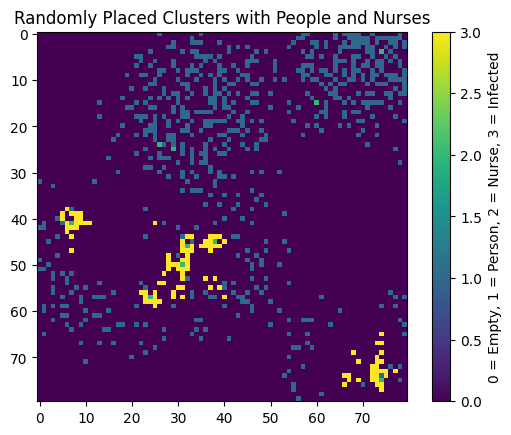

Node health is 1
Adding from [<cls.Disease object at 0x12439e8c0>] [<cls.Disease object at 0x12439e8c0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 75 73
Adding from [<cls.Disease object at 0x12439e8c0>] [<cls.Disease object at 0x12439e8c0>]
Adding from [<cls.Disease object at 0x12439e8c0>] [<cls.Disease object at 0x12439e8c0>]
Adding from [<cls.Disease object at 0x12439e8c0>] [<cls.Disease object at 0x12439e8c0>]
Node health is 1
Adding from [<cls.Disease object at 0x2a465c160>] [<cls.Disease object at 0x2a465c160>]
Adding from [<cls.Disease object at 0x2a465c160>] [<cls.Disease object at 0x2a465c160>]
Adding from [<cls.Disease object at 0x2a465c160>] [<cls.Disease object at 0x2a465c160>]
Adding from [<cls.Disease object at 0x2a465c160>] [<cls.Disease object at 0x2a465c160>]
Adding from [<cls.Disease object at 0x2a465c160>] [<cls.Disease object at 0x2a465c160>]
Node health

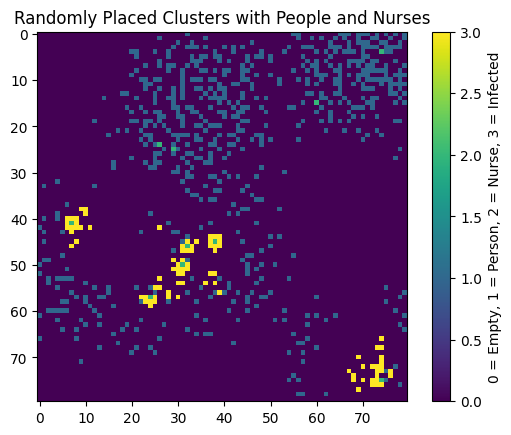

Neighbour 45 38 nurse->False | immunity->0 | natural_resistance->0.1698171701119287 | starting_health->6 | health->1 | diseases->[<cls.Disease object at 0x143ddc700>] | 
Node health is 1
Adding from [<cls.Disease object at 0x143ddc700>] [<cls.Disease object at 0x143ddc700>]
Adding from [<cls.Disease object at 0x143ddc700>] [<cls.Disease object at 0x143ddc700>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 57 24
Adding from [<cls.Disease object at 0x143ddc700>] [<cls.Disease object at 0x143ddc700>]
Adding from [<cls.Disease object at 0x143ddc700>] [<cls.Disease object at 0x143ddc700>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 58 23
Adding from [<cls.Disease object at 0x143ddc700>] [<cls.Disease object at 0x143ddc700>]
Node health is 1
{(50, 31): 8, (57, 24): 8, (46

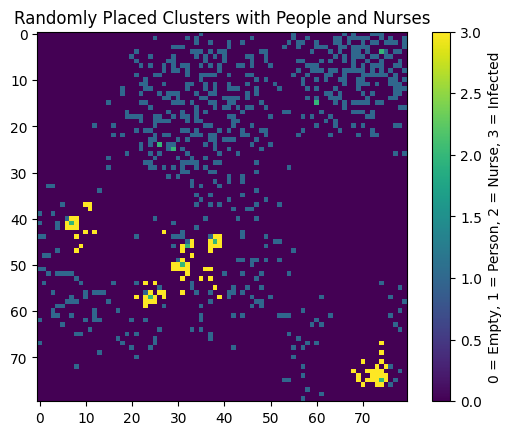

Node health is 0
Node died
Node health is 1
Adding from [<cls.Disease object at 0x2a45cde10>] [<cls.Disease object at 0x2a45cde10>]
Adding from [<cls.Disease object at 0x2a45cde10>] [<cls.Disease object at 0x2a45cde10>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 50 30
Adding from [<cls.Disease object at 0x2a45cde10>] [<cls.Disease object at 0x2a45cde10>]
Adding from [<cls.Disease object at 0x2a45cde10>] [<cls.Disease object at 0x2a45cde10>]
Adding from [<cls.Disease object at 0x2a45cde10>] [<cls.Disease object at 0x2a45cde10>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 51 31
Node health is 1
Adding from [<cls.Disease object at 0x2a45cde10>] [<cls.Disease object at 0x2a45cde10>]
Adding from [<cls.Disease object at 0x2a45cde10>] [<cls.Disease object at 0x2a45cde10

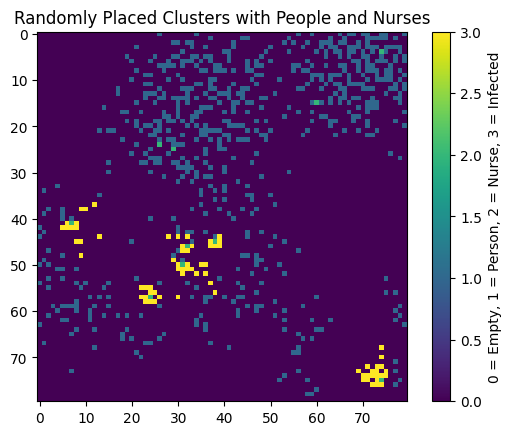

Node health is 1
Adding from [<cls.Disease object at 0x2999baa40>] [<cls.Disease object at 0x2999baa40>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 46 32
Adding from [<cls.Disease object at 0x2999baa40>] [<cls.Disease object at 0x2999baa40>]
Adding from [<cls.Disease object at 0x2999baa40>] [<cls.Disease object at 0x2999baa40>]
Adding from [<cls.Disease object at 0x2999baa40>] [<cls.Disease object at 0x2999baa40>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 47 32
Node health is 1
Adding from [<cls.Disease object at 0x2999baa40>] [<cls.Disease object at 0x2999baa40>]
Adding from [<cls.Disease object at 0x2999baa40>] [<cls.Disease object at 0x2999baa40>]
Adding from [<cls.Disease object at 0x2999baa40>] [<cls.Disease object at 0x2999baa40>]
{(57, 24): 1, (50, 31): 

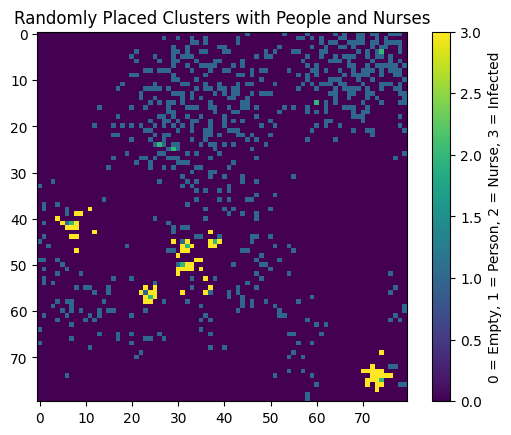

Node health is 1
Adding from [<cls.Disease object at 0x29a274910>] [<cls.Disease object at 0x29a274910>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 73 71
Adding from [<cls.Disease object at 0x29a274910>] [<cls.Disease object at 0x29a274910>]
Adding from [<cls.Disease object at 0x29a274910>] [<cls.Disease object at 0x29a274910>]
Adding from [<cls.Disease object at 0x29a274910>] [<cls.Disease object at 0x29a274910>]
Adding from [<cls.Disease object at 0x29a274910>] [<cls.Disease object at 0x29a274910>]
Adding from [<cls.Disease object at 0x29a274910>] [<cls.Disease object at 0x29a274910>]
Adding from [<cls.Disease object at 0x29a274910>] [<cls.Disease object at 0x29a274910>]
{(75, 74): 8, (45, 38): 33, (46, 32): 38, (50, 31): 39, (57, 24): 47, (25, 29): 51, (24, 26): 52, (15, 60): 60, (41, 7): 62, (4, 74): 72}
74 71 75 74 distance  3.1622776601683795
Adding from [<cls.Disease

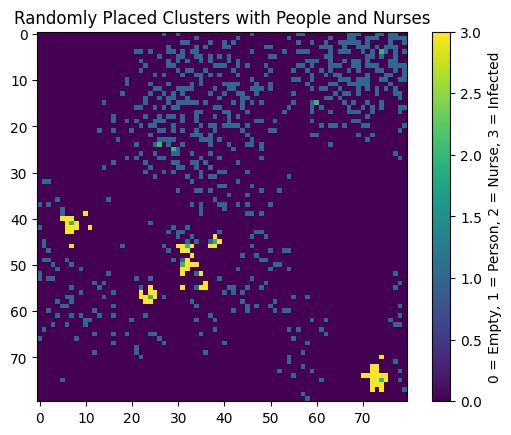

Health decreased
Node health is 5
Adding from [<cls.Disease object at 0x16d493880>] [<cls.Disease object at 0x16d493880>]
Adding from [<cls.Disease object at 0x16d493880>] [<cls.Disease object at 0x16d493880>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 55 34
Adding from [<cls.Disease object at 0x16d493880>] [<cls.Disease object at 0x16d493880>]
{(50, 31): 6, (46, 32): 8, (45, 38): 9, (57, 24): 10, (41, 7): 27, (25, 29): 28, (24, 26): 29, (15, 60): 38, (75, 74): 41, (4, 74): 50}
54 34 50 31 distance  5.0
54 35 50 31 distance  5.656854249492381
56 34 50 31 distance  6.708203932499369
56 35 50 31 distance  7.211102550927978
56 36 50 31 distance  7.810249675906654
Adding from [<cls.Disease object at 0x16d493880>] [<cls.Disease object at 0x16d493880>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b

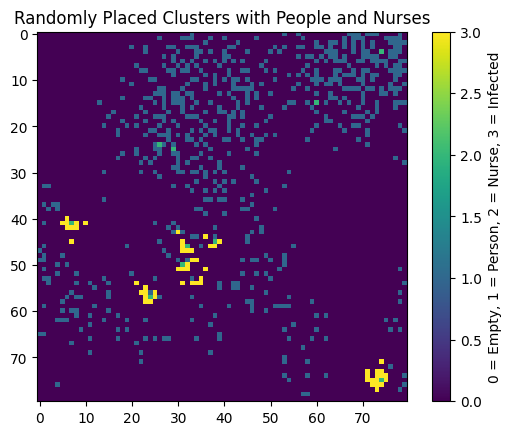

Node health is 0
Node died
Node health is 1
{(41, 7): 2, (24, 26): 18, (25, 29): 18, (57, 24): 19, (50, 31): 20, (46, 32): 22, (45, 38): 27, (15, 60): 48, (75, 74): 62, (4, 74): 66}
40 9 41 7 distance  2.23606797749979
40 10 41 7 distance  3.1622776601683795
40 11 41 7 distance  4.123105625617661
41 9 41 7 distance  2.0
41 11 41 7 distance  4.0
42 9 41 7 distance  2.23606797749979
42 10 41 7 distance  3.1622776601683795
42 11 41 7 distance  4.123105625617661
Adding from [<cls.Disease object at 0x2a52a6380>] [<cls.Disease object at 0x2a52a6380>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 41 8
Adding from [<cls.Disease object at 0x2a52a6380>] [<cls.Disease object at 0x2a52a6380>]
Node health is 1
Adding from [<cls.Disease object at 0x2a52a6380>] [<cls.Disease object at 0x2a52a6380>]
Adding from [<cls.Disease object at 0x2a52a6380>] [<cls.Disease object at 0x2a52a6380>]
Adding

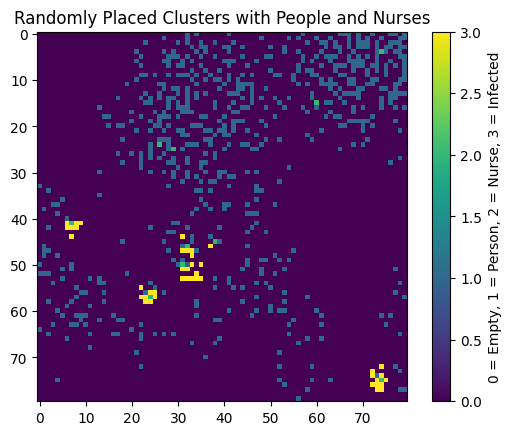

Neighbour 45 38 nurse->False | immunity->0 | natural_resistance->0.1961744711232981 | starting_health->7 | health->1 | diseases->[<cls.Disease object at 0x2a5796650>] | 
Neighbour 25 29 None
Node health is 1
Adding from [<cls.Disease object at 0x2a5796650>] [<cls.Disease object at 0x2a5796650>]
{(50, 31): 2, (57, 24): 6, (46, 32): 7, (45, 38): 7, (41, 7): 23, (25, 29): 26, (24, 26): 27, (15, 60): 36, (75, 74): 44, (4, 74): 50}
52 30 50 31 distance  2.23606797749979
52 31 50 31 distance  2.0
52 32 50 31 distance  2.23606797749979
53 30 50 31 distance  3.1622776601683795
54 30 50 31 distance  4.123105625617661
54 31 50 31 distance  4.0
54 32 50 31 distance  4.123105625617661
Adding from [<cls.Disease object at 0x2a5796650>] [<cls.Disease object at 0x2a5796650>]
Adding from [<cls.Disease object at 0x2a5796650>] [<cls.Disease object at 0x2a5796650>]
Adding from [<cls.Disease object at 0x2a5796650>] [<cls.Disease object at 0x2a5796650>]
Node health is 1
Adding from [<cls.Disease object at 0

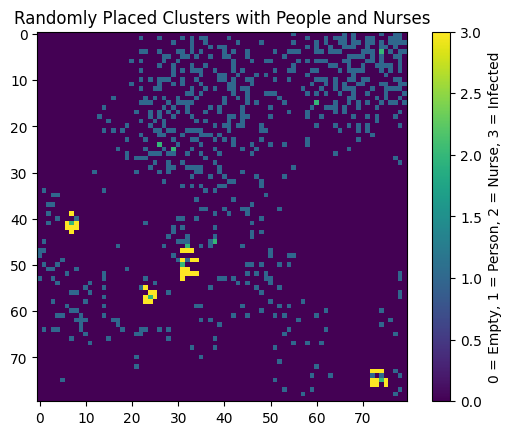

Node health is 1
Adding from [<cls.Disease object at 0x28d90b430>] [<cls.Disease object at 0x28d90b430>]
{(50, 31): 2, (46, 32): 3, (45, 38): 4, (57, 24): 10, (25, 29): 23, (24, 26): 24, (41, 7): 26, (15, 60): 33, (75, 74): 40, (4, 74): 48}
48 33 50 31 distance  2.8284271247461903
48 34 50 31 distance  3.605551275463989
48 35 50 31 distance  4.47213595499958
49 35 50 31 distance  4.123105625617661
50 33 50 31 distance  2.0
50 34 50 31 distance  3.0
50 35 50 31 distance  4.0
Adding from [<cls.Disease object at 0x28d90b430>] [<cls.Disease object at 0x28d90b430>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 49 32
Adding from [<cls.Disease object at 0x28d90b430>] [<cls.Disease object at 0x28d90b430>]
Adding from [<cls.Disease object at 0x28d90b430>] [<cls.Disease object at 0x28d90b430>]
Node health is 1
Adding from [<cls.Disease object at 0x2a3e6a470>] [<cls.Disease object at 0x2

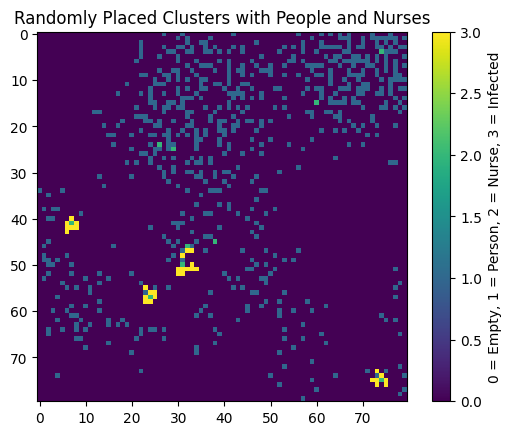

Node health is 1
Adding from [<cls.Disease object at 0x29a2af5e0>] [<cls.Disease object at 0x29a2af5e0>]
Adding from [<cls.Disease object at 0x29a2af5e0>] [<cls.Disease object at 0x29a2af5e0>]
Adding from [<cls.Disease object at 0x29a2af5e0>] [<cls.Disease object at 0x29a2af5e0>]
Adding from [<cls.Disease object at 0x29a2af5e0>] [<cls.Disease object at 0x29a2af5e0>]
Health decreased
Node health is 1
Adding from [<cls.Disease object at 0x29a2af5e0>] [<cls.Disease object at 0x29a2af5e0>]
Adding from [<cls.Disease object at 0x29a2af5e0>] [<cls.Disease object at 0x29a2af5e0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 41 7
Adding from [<cls.Disease object at 0x29a2af5e0>] [<cls.Disease object at 0x29a2af5e0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 41 8
Node heal

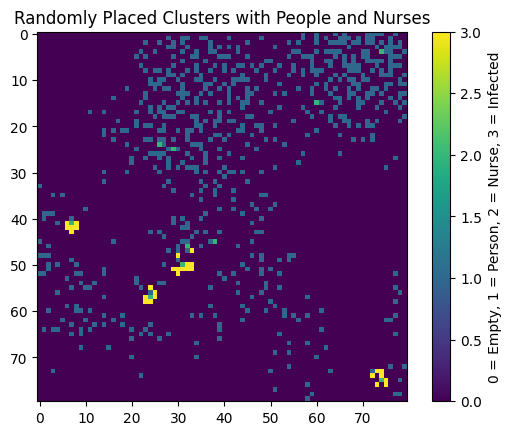

Neighbour 57 24 nurse->False | immunity->0 | natural_resistance->0.14481953883746443 | starting_health->5 | health->1 | diseases->[<cls.Disease object at 0x16c902c50>] | 
Node health is 0
Node died
Neighbour 25 29 None
Neighbour 50 31 nurse->False | immunity->0 | natural_resistance->0.14582246715294553 | starting_health->7 | health->1 | diseases->[<cls.Disease object at 0x16c902c50>] | 
Node health is 1
Adding from [<cls.Disease object at 0x16c902c50>] [<cls.Disease object at 0x16c902c50>]
Adding from [<cls.Disease object at 0x16c902c50>] [<cls.Disease object at 0x16c902c50>]
Adding from [<cls.Disease object at 0x16c902c50>] [<cls.Disease object at 0x16c902c50>]
Node health is 1
Adding from [<cls.Disease object at 0x282f862f0>] [<cls.Disease object at 0x282f862f0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 73 73
Adding from [<cls.Disease object at 0x282f862f0>] [<cls.Disea

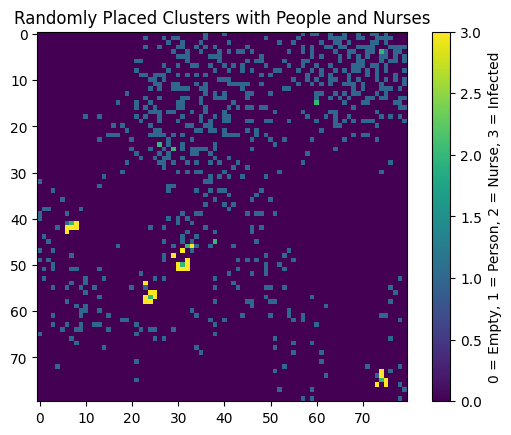

Node health is 1
Adding from [<cls.Disease object at 0x1242c6e00>] [<cls.Disease object at 0x1242c6e00>]
Adding from [<cls.Disease object at 0x1242c6e00>] [<cls.Disease object at 0x1242c6e00>]
Adding from [<cls.Disease object at 0x1242c6e00>] [<cls.Disease object at 0x1242c6e00>]
Adding from [<cls.Disease object at 0x1242c6e00>] [<cls.Disease object at 0x1242c6e00>]
Node health is 1
Adding from [<cls.Disease object at 0x1242c6e00>] [<cls.Disease object at 0x1242c6e00>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 55 23
{(57, 24): 2, (50, 31): 7, (46, 32): 9, (45, 38): 14, (41, 7): 15, (25, 29): 28, (24, 26): 29, (15, 60): 40, (75, 74): 49, (4, 74): 53}
53 22 57 24 distance  4.47213595499958
53 23 57 24 distance  4.123105625617661
53 24 57 24 distance  4.0
54 22 57 24 distance  3.605551275463989
54 24 57 24 distance  3.0
55 22 57 24 distance  2.8284271247461903
55 24 57 24 dis

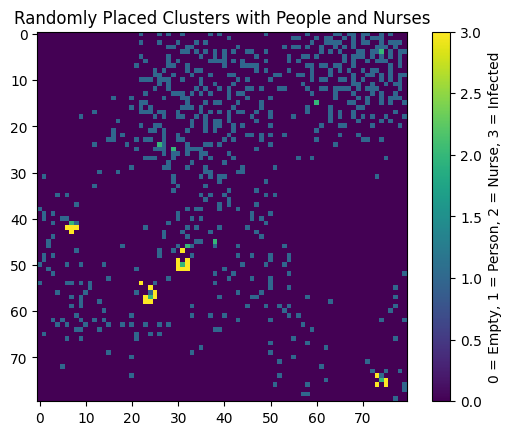

Neighbour 45 38 None
Node health is 1
Adding from [<cls.Disease object at 0x29a34ea10>] [<cls.Disease object at 0x29a34ea10>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 49 32
Adding from [<cls.Disease object at 0x29a34ea10>] [<cls.Disease object at 0x29a34ea10>]
Adding from [<cls.Disease object at 0x29a34ea10>] [<cls.Disease object at 0x29a34ea10>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 51 31
Adding from [<cls.Disease object at 0x29a34ea10>] [<cls.Disease object at 0x29a34ea10>]
Node health is 1
Adding from [<cls.Disease object at 0x29a34ea10>] [<cls.Disease object at 0x29a34ea10>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 41 7
Adding from [<cls

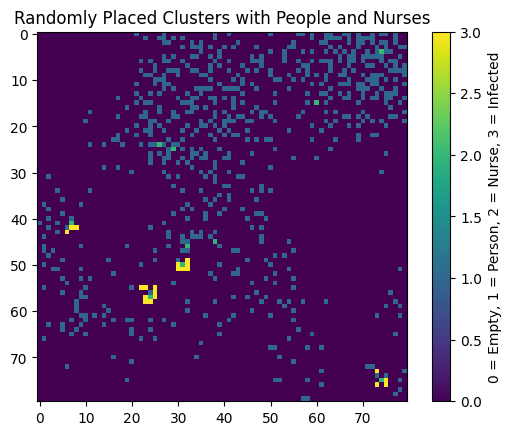

Node health is 1
Adding from [<cls.Disease object at 0x299d4a3b0>] [<cls.Disease object at 0x299d4a3b0>]
Adding from [<cls.Disease object at 0x299d4a3b0>] [<cls.Disease object at 0x299d4a3b0>]
Adding from [<cls.Disease object at 0x299d4a3b0>] [<cls.Disease object at 0x299d4a3b0>]
Adding from [<cls.Disease object at 0x299d4a3b0>] [<cls.Disease object at 0x299d4a3b0>]
Neighbour 41 7 nurse->False | immunity->0 | natural_resistance->0.175291609983522 | starting_health->7 | health->1 | diseases->[<cls.Disease object at 0x299d4a3b0>] | 
Node health is 1
Adding from [<cls.Disease object at 0x137eea6b0>] [<cls.Disease object at 0x137eea6b0>]
Node health is 1
Adding from [<cls.Disease object at 0x299d4a3b0>] [<cls.Disease object at 0x299d4a3b0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 49 32
Adding from [<cls.Disease object at 0x299d4a3b0>] [<cls.Disease object at 0x299d4a3b0>]
Ad

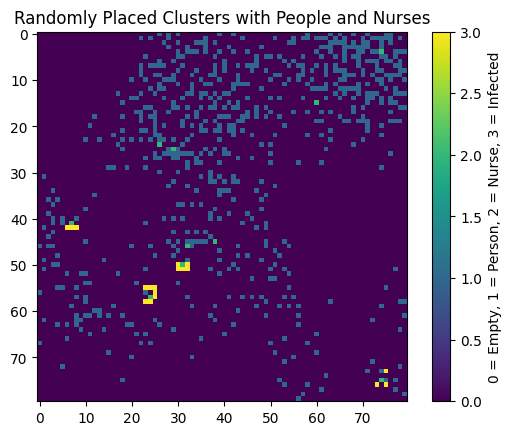

Node health is 1
Adding from [<cls.Disease object at 0x1667cf790>] [<cls.Disease object at 0x1667cf790>]
Node health is 1
Adding from [<cls.Disease object at 0x29a1020e0>] [<cls.Disease object at 0x29a1020e0>]
Adding from [<cls.Disease object at 0x29a1020e0>] [<cls.Disease object at 0x29a1020e0>]
Adding from [<cls.Disease object at 0x29a1020e0>] [<cls.Disease object at 0x29a1020e0>]
Neighbour 57 24 nurse->False | immunity->0 | natural_resistance->0.14481953883746443 | starting_health->5 | health->1 | diseases->[<cls.Disease object at 0x29a1020e0>] | 
Node health is 1
Adding from [<cls.Disease object at 0x29a1020e0>] [<cls.Disease object at 0x29a1020e0>]
Adding from [<cls.Disease object at 0x29a1020e0>] [<cls.Disease object at 0x29a1020e0>]
{(57, 24): 1, (50, 31): 6, (46, 32): 8, (45, 38): 13, (41, 7): 17, (24, 26): 29, (25, 29): 30, (15, 60): 39, (75, 74): 48, (4, 74): 54}
54 24 57 24 distance  3.0
54 25 57 24 distance  3.1622776601683795
54 26 57 24 distance  3.605551275463989
55 26 5

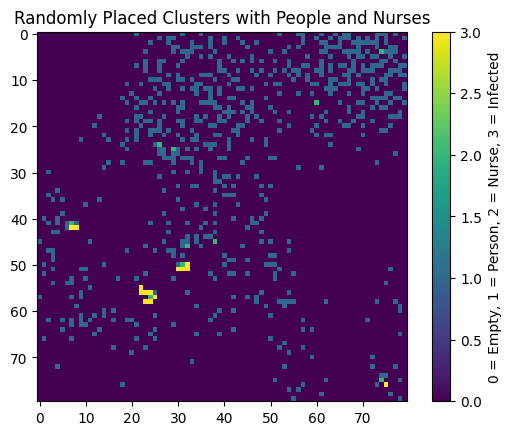

Node health is 1
Adding from [<cls.Disease object at 0x28db1da50>] [<cls.Disease object at 0x28db1da50>]
Adding from [<cls.Disease object at 0x28db1da50>] [<cls.Disease object at 0x28db1da50>]
Adding from [<cls.Disease object at 0x28db1da50>] [<cls.Disease object at 0x28db1da50>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 51 31
Node health is 1
Adding from [<cls.Disease object at 0x28db1da50>] [<cls.Disease object at 0x28db1da50>]
Adding from [<cls.Disease object at 0x28db1da50>] [<cls.Disease object at 0x28db1da50>]
Adding from [<cls.Disease object at 0x28db1da50>] [<cls.Disease object at 0x28db1da50>]
Adding from [<cls.Disease object at 0x28db1da50>] [<cls.Disease object at 0x28db1da50>]
Adding from [<cls.Disease object at 0x28db1da50>] [<cls.Disease object at 0x28db1da50>]
Node health is 1
Adding from [<cls.Disease object at 0x28db1da50>] [<cls.Disease object at 0x28db1d

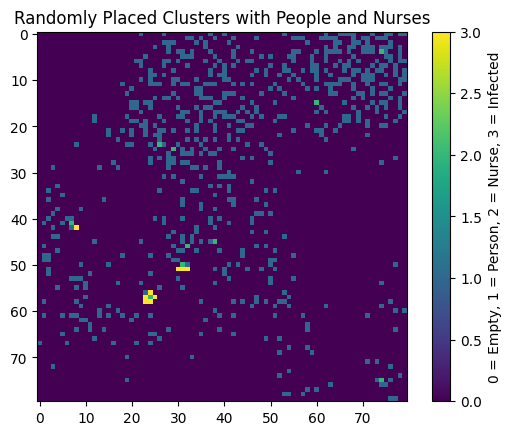

Neighbour 15 60 None
Neighbour 4 74 None
Neighbour 41 7 nurse->False | immunity->0 | natural_resistance->0.18471527265447496 | starting_health->5 | health->1 | diseases->[<cls.Disease object at 0x28d4b32b0>] | 
Node health is 1
Adding from [<cls.Disease object at 0x28d4b32b0>] [<cls.Disease object at 0x28d4b32b0>]
Adding from [<cls.Disease object at 0x28d4b32b0>] [<cls.Disease object at 0x28d4b32b0>]
Adding from [<cls.Disease object at 0x28d4b32b0>] [<cls.Disease object at 0x28d4b32b0>]
Adding from [<cls.Disease object at 0x28d4b32b0>] [<cls.Disease object at 0x28d4b32b0>]
Neighbour 45 38 None
Neighbour 25 29 None
Node health is 1
Neighbour 24 26 None
Node health is 1
Adding from [<cls.Disease object at 0x28d4b32b0>] [<cls.Disease object at 0x28d4b32b0>]
Adding from [<cls.Disease object at 0x28d4b32b0>] [<cls.Disease object at 0x28d4b32b0>]
Adding from [<cls.Disease object at 0x28d4b32b0>] [<cls.Disease object at 0x28d4b32b0>]
Adding from [<cls.Disease object at 0x28d4b32b0>] [<cls.Dis

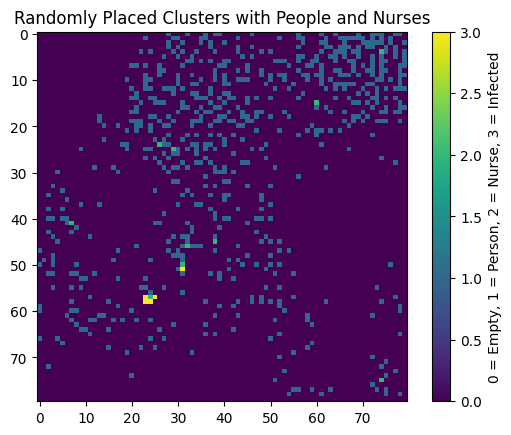

Neighbour 15 60 None
Neighbour 41 7 None
Node health is 1
Adding from [<cls.Disease object at 0x16d6003d0>] [<cls.Disease object at 0x16d6003d0>]
Adding from [<cls.Disease object at 0x16d6003d0>] [<cls.Disease object at 0x16d6003d0>]
Adding from [<cls.Disease object at 0x16d6003d0>] [<cls.Disease object at 0x16d6003d0>]
Neighbour 24 26 None
Node health is 1
Adding from [<cls.Disease object at 0x16d6003d0>] [<cls.Disease object at 0x16d6003d0>]
Adding from [<cls.Disease object at 0x16d6003d0>] [<cls.Disease object at 0x16d6003d0>]
Node health is 1
Adding from [<cls.Disease object at 0x16d6003d0>] [<cls.Disease object at 0x16d6003d0>]
Adding from [<cls.Disease object at 0x16d6003d0>] [<cls.Disease object at 0x16d6003d0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 57 24
Adding from [<cls.Disease object at 0x16d6003d0>] [<cls.Disease object at 0x16d6003d0>]
Adding from [<cls.Di

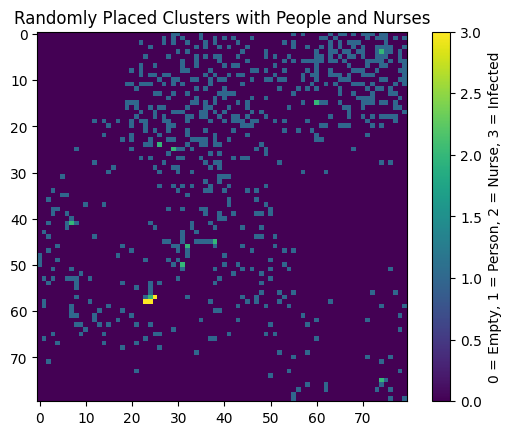

Neighbour 75 74 None
Neighbour 50 31 None
Node health is 1
Adding from [<cls.Disease object at 0x16673aef0>] [<cls.Disease object at 0x16673aef0>]
Adding from [<cls.Disease object at 0x16673aef0>] [<cls.Disease object at 0x16673aef0>]
Adding from [<cls.Disease object at 0x16673aef0>] [<cls.Disease object at 0x16673aef0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 57 25
Adding from [<cls.Disease object at 0x16673aef0>] [<cls.Disease object at 0x16673aef0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 58 23
Neighbour 4 74 None
Neighbour 25 29 None
Node health is 1
Adding from [<cls.Disease object at 0x16673aef0>] [<cls.Disease object at 0x16673aef0>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-

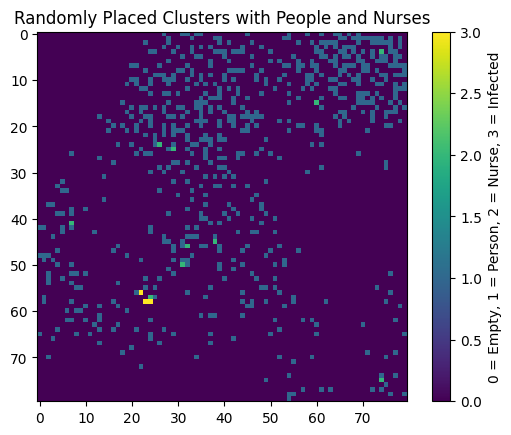

Neighbour 25 29 None
Neighbour 24 26 None
Neighbour 50 31 None
Neighbour 57 24 nurse->False | immunity->0 | natural_resistance->0.19728947493778967 | starting_health->4 | health->1 | diseases->[<cls.Disease object at 0x282e15630>] | 
Neighbour 75 74 None
Neighbour 15 60 None
Node health is 1
Neighbour 4 74 None
Neighbour 41 7 None
Node health is 1
{(57, 24): 1, (50, 31): 8, (46, 32): 10, (41, 7): 14, (45, 38): 14, (25, 29): 30, (24, 26): 31, (15, 60): 41, (75, 74): 49, (4, 74): 53}
55 21 57 24 distance  3.605551275463989
55 22 57 24 distance  2.8284271247461903
55 23 57 24 distance  2.23606797749979
56 21 57 24 distance  3.1622776601683795
56 23 57 24 distance  1.4142135623730951
57 21 57 24 distance  3.0
57 22 57 24 distance  2.0
57 23 57 24 distance  1.0
Adding from [<cls.Disease object at 0x282e15630>] [<cls.Disease object at 0x282e15630>]
Adding from [<cls.Disease object at 0x282e15630>] [<cls.Disease object at 0x282e15630>]
Adding from [<cls.Disease object at 0x282e15630>] [<cls.D

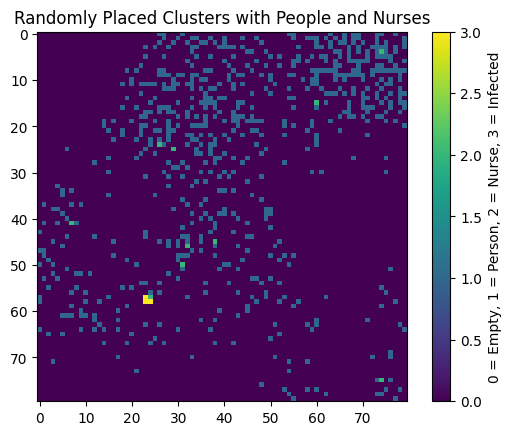

Neighbour 41 7 None
Neighbour 25 29 None
Neighbour 4 74 None
Node health is 1
Adding from [<cls.Disease object at 0x123ef1810>] [<cls.Disease object at 0x123ef1810>]
Adding from [<cls.Disease object at 0x123ef1810>] [<cls.Disease object at 0x123ef1810>]
Adding from [<cls.Disease object at 0x123ef1810>] [<cls.Disease object at 0x123ef1810>]
Node health is 1
Adding from [<cls.Disease object at 0x123ef1810>] [<cls.Disease object at 0x123ef1810>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 56 24
Adding from [<cls.Disease object at 0x123ef1810>] [<cls.Disease object at 0x123ef1810>]
Adding from [<cls.Disease object at 0x123ef1810>] [<cls.Disease object at 0x123ef1810>]
Adding from [<cls.Disease object at 0x123ef1810>] [<cls.Disease object at 0x123ef1810>]
Neighbour 15 60 None
Neighbour 50 31 None
Neighbour 75 74 None
Neighbour 46 32 None
Neighbour 24 26 None
Neighbour 45 38 None


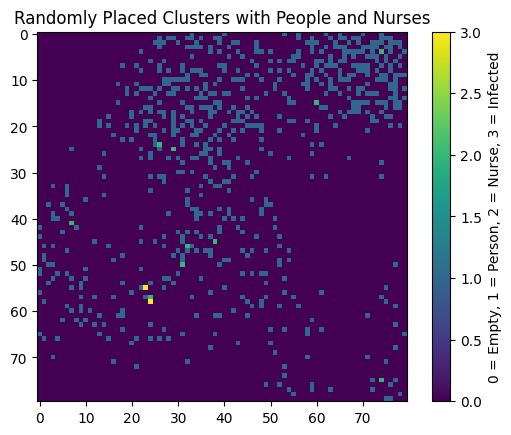

Neighbour 4 74 None
Neighbour 41 7 None
Node health is 1
Adding from [<cls.Disease object at 0x16d354190>] [<cls.Disease object at 0x16d354190>]
{(57, 24): 1, (50, 31): 7, (46, 32): 10, (45, 38): 13, (41, 7): 15, (25, 29): 29, (24, 26): 30, (15, 60): 40, (75, 74): 48, (4, 74): 56}
54 22 57 24 distance  3.605551275463989
54 23 57 24 distance  3.1622776601683795
55 22 57 24 distance  2.8284271247461903
55 24 57 24 distance  2.0
56 22 57 24 distance  2.23606797749979
56 23 57 24 distance  1.4142135623730951
56 24 57 24 distance  1.0
Adding from [<cls.Disease object at 0x16d354190>] [<cls.Disease object at 0x16d354190>]
Adding from [<cls.Disease object at 0x16d354190>] [<cls.Disease object at 0x16d354190>]
infectivity->0.18616593475226895 | mortality->0.8492059982553049 | kill_chance->0.24568574511191332 | name->601d8db5-d251-490a-8b38-725d6143ba0c |  added to 57 24
Neighbour 24 26 None
Neighbour 15 60 None
Node health is 1
Adding from [<cls.Disease object at 0x16d354190>] [<cls.Disease ob

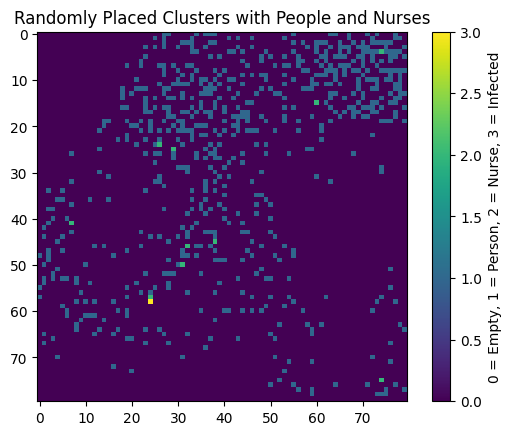

Neighbour 15 60 None
Neighbour 50 31 None
Neighbour 25 29 None
Neighbour 24 26 None
Neighbour 75 74 None
Neighbour 4 74 None
Neighbour 57 24 nurse->False | immunity->0 | natural_resistance->0.14449953397881443 | starting_health->7 | health->1 | diseases->[<cls.Disease object at 0x143a6b970>] | 
Neighbour 41 7 None
Neighbour 45 38 None
Node health is 1
Neighbour 46 32 None


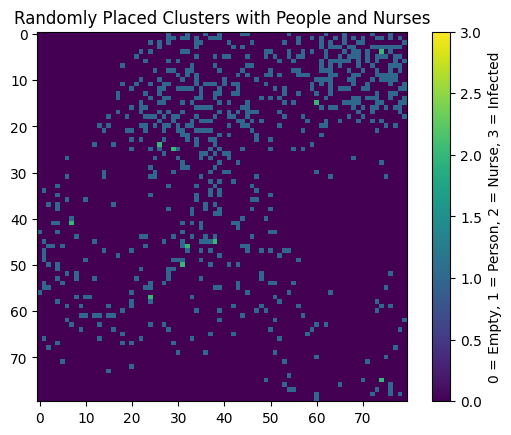

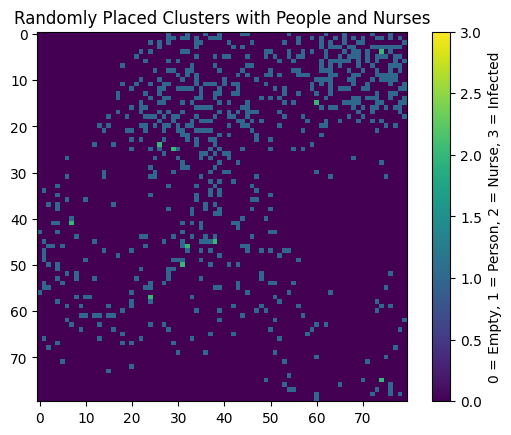

[42, 20]
[70, 65]
hotspots 10 starting neighbours out of 16 possible
Started with 1159 people. Ended with 681. 478 people died in 57 iterations.
The following died: [<cls.Person object at 0x16662ec20>, <cls.Person object at 0x14360e050>, <cls.Person object at 0x2a41cba00>, <cls.Person object at 0x2a41cb520>, <cls.Person object at 0x2a41cbeb0>, <cls.Person object at 0x2a41caad0>, <cls.Person object at 0x166738370>, <cls.Person object at 0x28d6fac50>, <cls.Person object at 0x28d6fa2f0>, <cls.Person object at 0x28d93edd0>, <cls.Person object at 0x299b38850>, <cls.Person object at 0x299b3ace0>, <cls.Person object at 0x299b397e0>, <cls.Person object at 0x299b39060>, <cls.Person object at 0x299b38b50>, <cls.Person object at 0x16d775f60>, <cls.Person object at 0x299b383a0>, <cls.Person object at 0x299b38eb0>, <cls.Person object at 0x2a53c9c60>, <cls.Person object at 0x2a5363850>, <cls.Person object at 0x2a5363460>, <cls.Person object at 0x2a5361db0>, <cls.Person object at 0x2a53c9bd0>, <cls.P

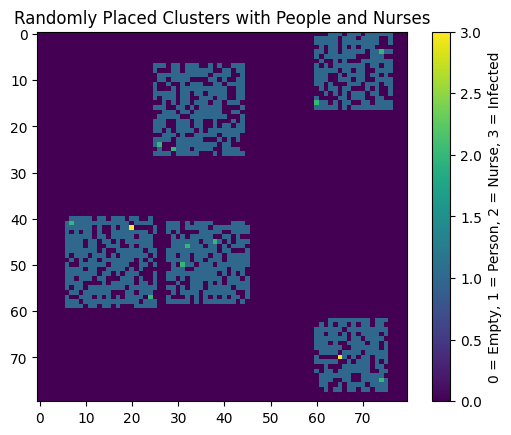

Finished at:


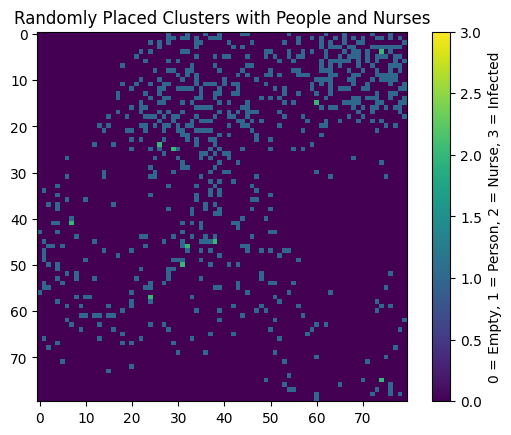

Infected Person Statistics:


,Infected X,Infected Y,Uninfected Count Near,Total Squares Visited,Time Step
0,42,20.0,18.0,24.0,0.0
1,70,65.0,13.0,24.0,0.0
2,41,19.0,11.0,23.0,1.0
3,43,21.0,17.0,23.0,1.0
4,71,66.0,13.0,23.0,1.0


Overall Statistics:


,Time Step,Current Infected,Total Deaths,Total Healed
0,0,2,0,0
1,1,4,0,0
2,2,10,0,0
3,3,21,0,0
4,4,35,0,0


In [699]:
from cls import *

sim_num += 1
# Create a Simulation object
sim = Simulation(board_size=BOARDSIZE, num_clusters=NUM_CLUSTERS,
                 prob_nurse=PROB_NURSE, prob_person=PROB_PERSON)

# Start the simulation
sim.start()
# View the initial map
sim.view()
# Run the simulation for up to 100 steps and collect statistics
infected_df, overall_df = sim.run_to_end(max_steps=100)
# View the final map after the limited number of steps
sim.view()
sim.end()

# Display the infected person statistics as a table
print("Infected Person Statistics:")
display(infected_df.head())  # Show the first few rows

# Display the overall simulation statistics as a table
print("Overall Statistics:")
display(overall_df.head())  # Show the first few rows


In [700]:
display(infected_df)  # Show the first few rows

display(overall_df)  # Show the first few rows

,Infected X,Infected Y,Uninfected Count Near,Total Squares Visited,Time Step
0,42,20.0,18.0,24.0,0.0
1,70,65.0,13.0,24.0,0.0
2,41,19.0,11.0,23.0,1.0
3,43,21.0,17.0,23.0,1.0
4,71,66.0,13.0,23.0,1.0
...,...,...,...,...,...
6975,58,24.0,2.0,21.0,54.0
6976,55,23.0,3.0,23.0,55.0
6977,58,24.0,1.0,23.0,55.0
6978,"[58, 24, 2, 23, 56]",NaN,NaN,NaN,NaN


,Time Step,Current Infected,Total Deaths,Total Healed
0,0,2,0,0
1,1,4,0,0
2,2,10,0,0
3,3,21,0,0
4,4,35,0,0
5,5,53,0,0
6,6,75,0,0
7,7,102,0,1
8,8,130,1,2
9,9,147,2,3


In [702]:


#type(str(PROB_NURSE).split(".")[-1])

name = str(PROB_NURSE).split(".")[-1] + "_" + str(PROB_PERSON).split(".")[-1] + '_' + str()

inf_name = 'inf_' + name + '.csv'
over_name = 'over_' + name + '.csv'
inf_name
#over_name

'inf_01_7_2.csv'

In [703]:
# Export Infected Person Stats DataFrame to CSV
#infected_df.to_csv(inf_name, index=False)  # index=False to avoid writing row indices

# Export Overall Stats DataFrame to CSV
#overall_df.to_csv(over_name, index=False)
